In [1]:
# Importing necessary packages
# Importing necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import math
from math import sqrt

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import GaussianDropout

from sklearn.ensemble import RandomForestRegressor
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import OrdinalEncoder
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import tensorflow as tf

import warnings
warnings.filterwarnings('ignore')

%pip install fancyimpute -qq
from fancyimpute import KNN

%pip install statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols

%pip install dataframe_image
import dataframe_image as dfi


In [2]:
# Cloning the directory in which the Germany housing data is stored
%git clone https://github.com/Kris492b/data_ger

In [3]:
# Reading and displaying the data as is
data_ger = pd.read_csv('germany_housing.csv')
data_ger

,Unnamed: 0,Price,Type,Living_space,Lot,Usable_area,Free_of_Relation,Rooms,Bedrooms,Bathrooms,...,Energy_source,Energy_certificate,Energy_certificate_type,Energy_consumption,Energy_efficiency_class,State,City,Place,Garages,Garagetype
0,0,498000.0,Multiple dwelling,106.00,229.0,NaN,01.10.2020,5.5,3.0,1.0,...,Gas,available,demand certificate,NaN,D,Baden-Württemberg,Bodenseekreis,Bermatingen,2.0,Parking lot
1,1,495000.0,Mid-terrace house,140.93,517.0,20.00,01.01.2021,6.0,3.0,2.0,...,NaN,not required by law,NaN,NaN,NaN,Baden-Württemberg,Konstanz (Kreis),Engen,7.0,Parking lot
2,2,749000.0,Farmhouse,162.89,82.0,37.62,01.07.2020,5.0,3.0,2.0,...,"Fernwärme, Bioenergie",available,demand certificate,NaN,B,Baden-Württemberg,Esslingen (Kreis),Ostfildern,1.0,Garage
3,3,259000.0,Farmhouse,140.00,814.0,NaN,nach Vereinbarung,4.0,NaN,2.0,...,Strom,available,demand certificate,NaN,G,Baden-Württemberg,Waldshut (Kreis),Bonndorf im Schwarzwald,1.0,Garage
4,4,469000.0,Multiple dwelling,115.00,244.0,NaN,sofort,4.5,2.0,1.0,...,Öl,available,demand certificate,NaN,F,Baden-Württemberg,Esslingen (Kreis),Leinfelden-Echterdingen,1.0,Garage
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10547,10547,1495000.0,Special property,167.00,683.0,63.00,nach Vereinbarung,6.5,4.0,3.0,...,Fernwärme,available,consumption certificate,113.2,D,Bayern,München,Perlach,1.0,Garage
10548,10548,449000.0,Mid-terrace house,222.00,4000.0,NaN,NaN,6.0,5.0,3.0,...,Erdwärme,available,demand certificate,NaN,A+,Sachsen-Anhalt,Altmarkkreis Salzwedel,Henningen,4.0,Parking lot
10549,10549,678000.0,Mid-terrace house,142.00,377.0,NaN,31.07.2021,4.0,3.0,NaN,...,NaN,NaN,NaN,NaN,NaN,Bayern,Augsburg (Kreis),Untermeitingen,2.0,Garage
10550,10550,419900.0,Mid-terrace house,120.83,501.0,NaN,sofort,5.0,NaN,1.0,...,NaN,available,demand certificate,NaN,A+,Sachsen-Anhalt,Börde (Kreis),Wolmirstedt,1.0,Garage


In [4]:
# Garnering information on the data, showing the types and amount of na values present in the dataset
data_ger.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10552 entries, 0 to 10551
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               10552 non-null  int64  
 1   Price                    10552 non-null  float64
 2   Type                     10150 non-null  object 
 3   Living_space             10552 non-null  float64
 4   Lot                      10552 non-null  float64
 5   Usable_area              5568 non-null   float64
 6   Free_of_Relation         6983 non-null   object 
 7   Rooms                    10552 non-null  float64
 8   Bedrooms                 6878 non-null   float64
 9   Bathrooms                8751 non-null   float64
 10  Floors                   7888 non-null   float64
 11  Year_built               9858 non-null   float64
 12  Furnishing_quality       7826 non-null   object 
 13  Year_renovated           5349 non-null   float64
 14  Condition             

In [5]:
data_ger.describe()

,Unnamed: 0,Price,Living_space,Lot,Usable_area,Rooms,Bedrooms,Bathrooms,Floors,Year_built,Year_renovated,Energy_consumption,Garages
count,10552.000000,1.055200e+04,10552.000000,10552.000000,5568.000000,10552.000000,6878.000000,8751.000000,7888.000000,9858.000000,5349.000000,2433.000000,8592.000000
mean,5275.500000,5.566851e+05,216.721008,1491.659004,134.300424,7.388978,4.169817,2.308993,2.283976,1958.821465,2010.706300,117.663111,2.698673
std,3046.244354,6.087410e+05,172.421321,8582.361675,188.814089,5.378126,2.577169,1.742330,0.821288,55.958072,10.548651,54.023207,3.195068
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1300.000000,1900.000000,5.100000,1.000000
25%,2637.750000,2.500000e+05,130.000000,370.000000,48.000000,5.000000,3.000000,1.000000,2.000000,1935.000000,2006.000000,83.170000,1.000000
50%,5275.500000,4.052150e+05,176.775000,656.500000,80.000000,6.000000,4.000000,2.000000,2.000000,1971.000000,2015.000000,112.700000,2.000000
75%,7913.250000,6.550000e+05,250.000000,1047.000000,150.250000,8.000000,5.000000,3.000000,3.000000,1996.000000,2018.000000,146.000000,3.000000
max,10551.000000,1.300000e+07,5600.000000,547087.000000,4034.000000,170.000000,61.000000,44.000000,13.000000,2022.000000,2206.000000,503.940000,70.000000


In [6]:
# Dropping the first column, it's but a replica of the index column
data_ger.drop('Unnamed: 0', axis=1, inplace=True)

In [7]:
# Wanting to clean up missing values, we want to detect the variables where this is possible and/or needed.
# With multiple variables containing either a lot of missing variables (Free of relation), 
# and/or have very little explanaition (Furnishing Quality), and/or have the same qualities as other columns (Energy consumption vs energy class) we decided to remove these. 
data_ger.drop(['Energy_consumption', 'Energy_certificate_type', 'Energy_certificate', 'Year_renovated','Furnishing_quality','Free_of_Relation'], axis=1, inplace=True)
# Some variables may contain na values instead of 0's, which seem to be the case for the amount of garages. As well as some housing options seemingly contains a lot of garages, upwards to 70, which may be an error.

data_ger['Garages'].value_counts()

1.0     3098
2.0     2724
3.0     1016
4.0      680
5.0      364
6.0      259
8.0       96
7.0       85
10.0      78
12.0      30
9.0       25
11.0      22
20.0      21
14.0      15
15.0      14
16.0      12
13.0       8
17.0       8
30.0       7
27.0       4
50.0       3
21.0       3
25.0       3
18.0       2
40.0       2
22.0       2
70.0       1
36.0       1
31.0       1
65.0       1
45.0       1
60.0       1
26.0       1
49.0       1
23.0       1
28.0       1
58.0       1
Name: Garages, dtype: int64

In [8]:
# Replacing the na values for housing with 0 garage options.
data_ger['Garages'].fillna(0, inplace=True)

In [9]:
# Removing observations where amount of garages exceed 20.
data_ger.query('Garages < 21', inplace=True)

In [10]:
# Because of the purpose of this project, we will have to find areas where there is a larger amount of housing price observations
# This is because we want to add socio-economic data which is relevant for a less aggregated area of Germany.
data_ger['State'].value_counts()

Nordrhein-Westfalen       1654
Bayern                    1338
Baden-Württemberg         1297
Niedersachsen             1291
Rheinland-Pfalz           1022
Hessen                     961
Schleswig-Holstein         556
Sachsen                    542
Brandenburg                489
Sachsen-Anhalt             375
Mecklenburg-Vorpommern     364
Berlin                     212
Saarland                   173
Thüringen                  146
Bremen                      50
Hamburg                     46
Name: State, dtype: int64

In [11]:
# The limited size of our dataset can be observed in the observations pr. City. We have the largest amount of observations in Hannover, in the Neidersachsen state.
# Neidersachsen would, at the very least, be relevant to include. 
# In case we can achieve access to socio-economic data on a city level, Hannover would perhaps be the best bet at creating a somewhat accurate prediction model.
data_ger['City'].value_counts().head(10)

Hannover (Kreis)                 107
Nordfriesland (Kreis)             95
Rhein-Neckar-Kreis                95
Wetteraukreis                     85
Rhein-Sieg-Kreis                  76
Gifhorn (Kreis)                   74
Mayen-Koblenz (Kreis)             73
Schleswig-Flensburg (Kreis)       71
Mittelsachsen (Kreis)             68
Rendsburg-Eckernförde (Kreis)     67
Name: City, dtype: int64

In [12]:
# Multiple housing price observation in places within cities are very sparse, we would perhaps have to avoid to place socio-economic data on this aggregate level. 
data_ger['Place'].value_counts().head(10)

Innenstadt       32
Falkensee        28
Stadtmitte       20
Hameln           19
Homburg          19
Schotten         18
Barsinghausen    18
Celle            17
Gifhorn          17
Cuxhaven         17
Name: Place, dtype: int64

In [13]:
#data_ger['Price'] = data_ger['Price'].astype(int)

In [14]:
# Splitting the data to seperate datasets based upon the state for ease of use in EDA.
data_ger_state_1 = data_ger.loc[data_ger['State'] == "Nordrhein-Westfalen"]
# Now that State is a constant, we can drop that column.
data_ger_state_1.drop('State', axis=1 ,inplace=True)
# As indexes gets moved around, we reset it.
data_ger_state_1.reset_index(drop=True,inplace=True)
data_ger_state_2 = data_ger.loc[data_ger['State'] == "Bayern"]
data_ger_state_2.drop('State', axis=1 ,inplace=True)
data_ger_state_2.reset_index(drop=True,inplace=True)
data_ger_state_3 = data_ger.loc[data_ger['State'] == "Baden-Württemberg"]
data_ger_state_3.drop('State', axis=1 ,inplace=True)
data_ger_state_3.reset_index(drop=True,inplace=True)
data_ger_state_4 = data_ger.loc[data_ger['State'] == "Niedersachsen"]
data_ger_state_4.drop('State', axis=1 ,inplace=True)
data_ger_state_4.reset_index(drop=True,inplace=True)
data_ger_state_5 = data_ger.loc[data_ger['State'] == "Rheinland-Pfalz"]
data_ger_state_5.drop('State', axis=1 ,inplace=True)
data_ger_state_5.reset_index(drop=True,inplace=True)

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\pandas\core\frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [15]:
# As an example, the unique cities are listed as below.
data_ger_state_1['City'].nunique()

54

In [16]:
data_ger_state_2['City'].unique()

array(['Altötting (Kreis)', 'Würzburg (Kreis)',
       'Fürstenfeldbruck (Kreis)', 'München', 'Augsburg (Kreis)',
       'München (Kreis)', 'Ingolstadt', 'Berchtesgadener Land (Kreis)',
       'Dachau (Kreis)', 'Starnberg (Kreis)', 'Passau (Kreis)',
       'Freising (Kreis)', 'Schwabach', 'Fürth (Kreis)',
       'Mühldorf am Inn (Kreis)', 'Traunstein (Kreis)',
       'Ebersberg (Kreis)', 'Nürnberger Land (Kreis)', 'Kulmbach (Kreis)',
       'Unterallgäu (Kreis)', 'Straubing-Bogen (Kreis)',
       'Schweinfurt (Kreis)', 'Rosenheim (Kreis)', 'Deggendorf (Kreis)',
       'Aichach-Friedberg (Kreis)', 'Günzburg (Kreis)', 'Cham (Kreis)',
       'Haßberge (Kreis)', 'Regensburg (Kreis)', 'Oberallgäu (Kreis)',
       'Erlangen-Höchstadt (Kreis)', 'Miesbach (Kreis)',
       'Eichstätt (Kreis)', 'Garmisch-Partenkirchen (Kreis)',
       'Weilheim-Schongau (Kreis)', 'Lindau (Bodensee) (Kreis)',
       'Bamberg', 'Ansbach (Kreis)', 'Coburg (Kreis)', 'Erlangen',
       'Landshut (Kreis)', 'Bad Tölz-W

In [17]:
data_ger_state_3['City'].unique()

array(['Bodenseekreis', 'Konstanz (Kreis)', 'Esslingen (Kreis)',
       'Waldshut (Kreis)', 'Stuttgart', 'Göppingen (Kreis)',
       'Freiburg im Breisgau', 'Enzkreis', 'Mannheim',
       'Böblingen (Kreis)', 'Tübingen (Kreis)', 'Rhein-Neckar-Kreis',
       'Zollernalbkreis', 'Ulm', 'Rastatt (Kreis)', 'Heilbronn (Kreis)',
       'Lörrach (Kreis)', 'Reutlingen (Kreis)', 'Pforzheim',
       'Alb-Donau-Kreis', 'Ludwigsburg (Kreis)', 'Rems-Murr-Kreis',
       'Karlsruhe (Kreis)', 'Heilbronn', 'Freudenstadt (Kreis)',
       'Biberach (Kreis)', 'Neckar-Odenwald-Kreis', 'Tuttlingen (Kreis)',
       'Ostalbkreis', 'Schwäbisch Hall (Kreis)', 'Calw (Kreis)',
       'Rottweil (Kreis)', 'Breisgau-Hochschwarzwald (Kreis)',
       'Karlsruhe', 'Ravensburg (Kreis)', 'Heidelberg', 'Baden-Baden',
       'Ortenaukreis', 'Emmendingen (Kreis)', 'Sigmaringen (Kreis)',
       'Main-Tauber-Kreis', 'Hohenlohekreis', 'Schwarzwald-Baar-Kreis',
       'Heidenheim (Kreis)'], dtype=object)

In [18]:
data_ger_state_4['City'].nunique

<bound method IndexOpsMixin.nunique of 0          Peine (Kreis)
1          Stade (Kreis)
2              Wolfsburg
3       Hannover (Kreis)
4       Northeim (Kreis)
              ...       
1286       Stade (Kreis)
1287      Goslar (Kreis)
1288       Peine (Kreis)
1289       Stade (Kreis)
1290      Goslar (Kreis)
Name: City, Length: 1291, dtype: object>

With the initial exploration and cleanup of the dataset, we want to take a look at specific features of the individual German states and will split this EDA up into seperate sections for each state and perform the same EDA methods for all.  

This EDA will conclude in a comparative summary of the states explored.
A recommendation for the reader is to go through the 1st state EDA and then go to the summary.

In [19]:
%pip install statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols

Note: you may need to restart the kernel to use updated packages.


In [20]:
# Performing analysis of vaiance (Anova) upon categorical variables upon the dependent variable (Price)
model = ols('Price ~ Type + Heating + Condition + Energy_efficiency_class + Energy_source + Garagetype + City + Place',
            data=data_ger).fit()

anova_results = sm.stats.anova_lm(model, typ=2)
print(anova_results)

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\statsmodels\base\model.py:1873: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 10, but rank is 9
  'rank is %d' % (J, J_), ValueWarning)
C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\statsmodels\base\model.py:1873: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 103, but rank is 73
  'rank is %d' % (J, J_), ValueWarning)
C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\statsmodels\base\model.py:1873: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 533, but rank is 407
  'rank is %d' % (J, J_), ValueWarning)


                               sum_sq      df          F         PR(>F)
Type                     4.033576e+13    10.0  53.606039   6.608680e-83
Heating                  3.394080e+12    12.0   3.758930   1.251520e-05
Condition                1.853450e+12     9.0   2.736918   3.622524e-03
Energy_efficiency_class  3.912636e+12     8.0   6.499843   2.516012e-08
Energy_source            3.503338e+13   103.0   4.520310   1.419613e-29
Garagetype               3.349829e+12     6.0   7.419844   7.971551e-08
City                     3.468755e+14   533.0   8.649077  9.801453e-196
Place                    1.323202e+15  4752.0   3.700608  4.285783e-135
Residual                 9.691532e+13  1288.0        NaN            NaN


C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\statsmodels\base\model.py:1873: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4752, but rank is 2639
  'rank is %d' % (J, J_), ValueWarning)


Result shows that PR(>F) is significant on all instances of variables on the dependent variable of price. By the ANOVA, we should keep all these variables.

## State 1 - Nordrhein-Westfalen

<AxesSubplot:xlabel='City', ylabel='Price'>

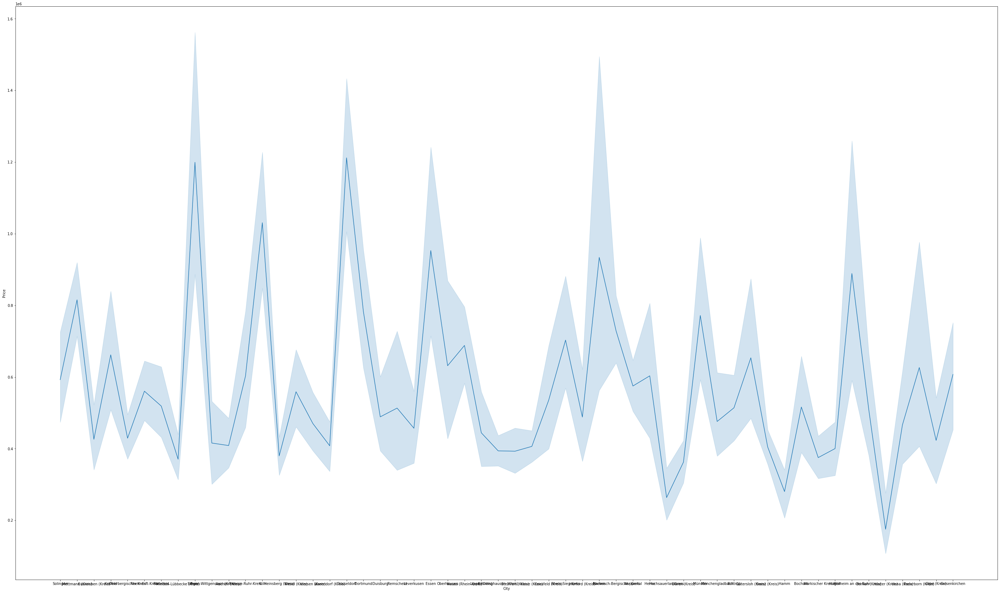

In [21]:
# Plotting Cities housing price distributions in the Nordrhein-Westfalen state.
plt.figure(figsize=(50,30))
sns.lineplot(x='City', y='Price', data=data_ger_state_1)

The graph above shows that prices plotted on city level creates a distribution that seem to reflect expensive cities from cheaper cities for housing options. 

Trying to visualize this even futher, we can plot some cities housing prices seperately

<AxesSubplot:xlabel='Year_built', ylabel='Price'>

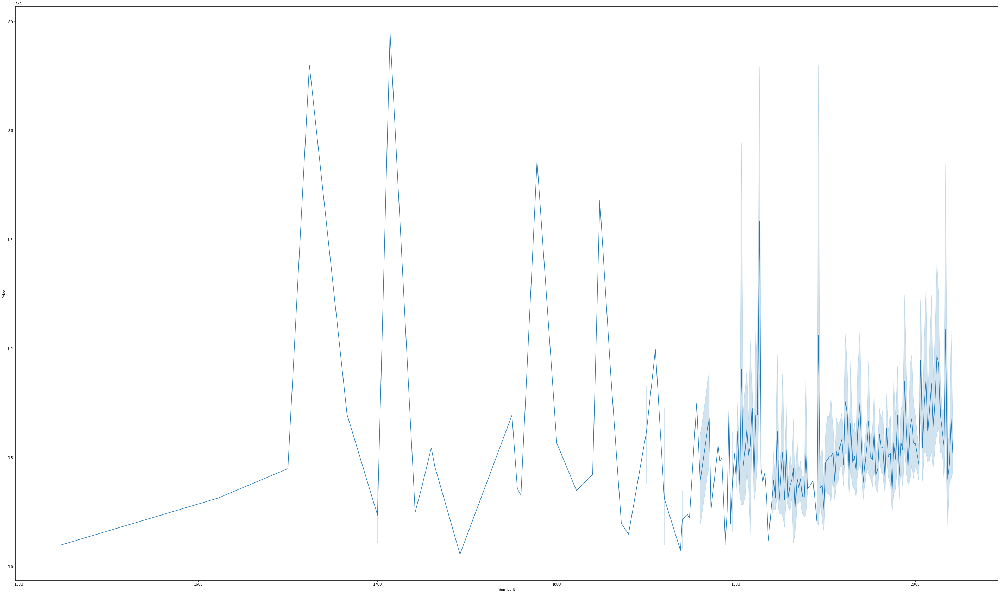

In [22]:
# Plotting the price distribution based on build year in the Nordrhein-Westfalen state as well.
plt.figure(figsize=(50,30))
sns.lineplot(x='Year_built', y='Price', data=data_ger_state_1)

The plotting above shows a large divergence in housing options that are built before the 1900's. These seem to have a very large value spread, either they are very low in value or extremely high with regards to the later built housing options. 

We could consider these as outliers, also taking into account that these only constitute to a marginal part of the dataset and thereby remove extraordinary cases, as to normalize the dataset.

In [23]:
# Displaying the least observed years of housing constructions.
data_ger_state_1['Year_built'].value_counts().tail(25)

1683.0    1
1897.0    1
1780.0    1
1778.0    1
1840.0    1
1746.0    1
1855.0    1
1650.0    1
1895.0    1
1732.0    1
1918.0    1
1523.0    1
1789.0    1
1730.0    1
1662.0    1
1892.0    1
1869.0    1
1899.0    1
1721.0    1
1874.0    1
1611.0    1
1915.0    1
1811.0    1
1943.0    1
1707.0    1
Name: Year_built, dtype: int64

In [24]:
# Removing observations that are not withing the preferred built year range 
data_ger_state_1.query('Year_built > 1899', inplace=True)
#data_ger_state_1_sub = data_ger_state_1.groupby('Year_built').filter(lambda x : len(x)>4)

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<AxesSubplot:xlabel='Year_built', ylabel='Price'>

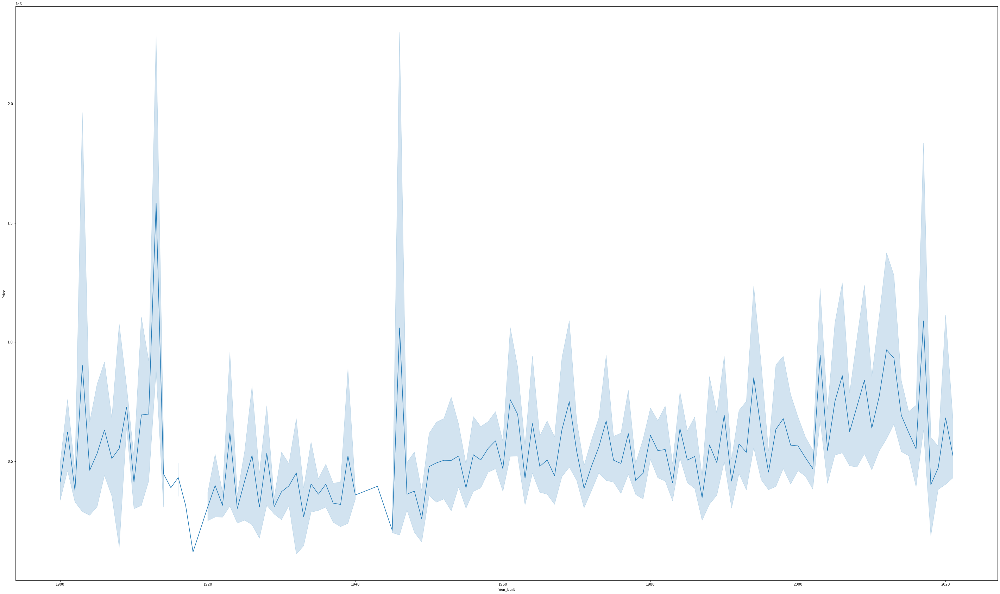

In [25]:
plt.figure(figsize=(50,30))
sns.lineplot(x='Year_built', y='Price', data=data_ger_state_1)

With the data filtered for outliers for the state of Nordrhein-Westfalen, the graph above is not only more readable, the max-min distributions are shown for all plotpoints. 

Futhermore, we would like to see a correlation matrix of variables in the dataset. To get the most amount of correlation info, we want to include variables which are non numeric (String values).

In [26]:
# Following code is inspired by https://stackoverflow.com/questions/24458645/label-encoding-across-multiple-columns-in-scikit-learn/60302366#60302366
# Setting up a label encoder which works on multiple columns, as to transform the categorical variables to numeric values. This allows us for further data exploration.
class MultiColumnLabelEncoder:
    def __init__(self,columns = None):
        self.columns = columns # array of column names to encode

    def fit(self,X,y=None):
        return self # not relevant here

    def transform(self,X):
        '''
        Transforms columns of X specified in self.columns using
        LabelEncoder(). If no columns specified, transforms all
        columns in X.
        '''
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

In [27]:
#Selecting which columns to encode
column_select= ['Type','Heating', 'Condition','Energy_efficiency_class', 'Energy_source', 'Garagetype', 'City', 'Place']

In [28]:
# Encoding columns and saving to new dataframe.
data_ger_state_1_sub = MultiColumnLabelEncoder(columns = column_select).fit_transform(data_ger_state_1)

In [29]:
# We still have a lot of missing values for a decent amount of our features. By using Iterative imputer, we can estimate with the regressor model, what the values could have been.
# This takes other variable features into account, and is a decent way to keep/add a lot of information we otherwise would leave out. Though it may not be fully representative of the real missing values.
imp_mean = IterativeImputer(estimator=RandomForestRegressor(), random_state=8)
imp_mean.fit(data_ger_state_1_sub)
data_ger_state_1_sub = pd.DataFrame(imp_mean.transform(data_ger_state_1_sub), columns=data_ger_state_1.columns)

<AxesSubplot:>

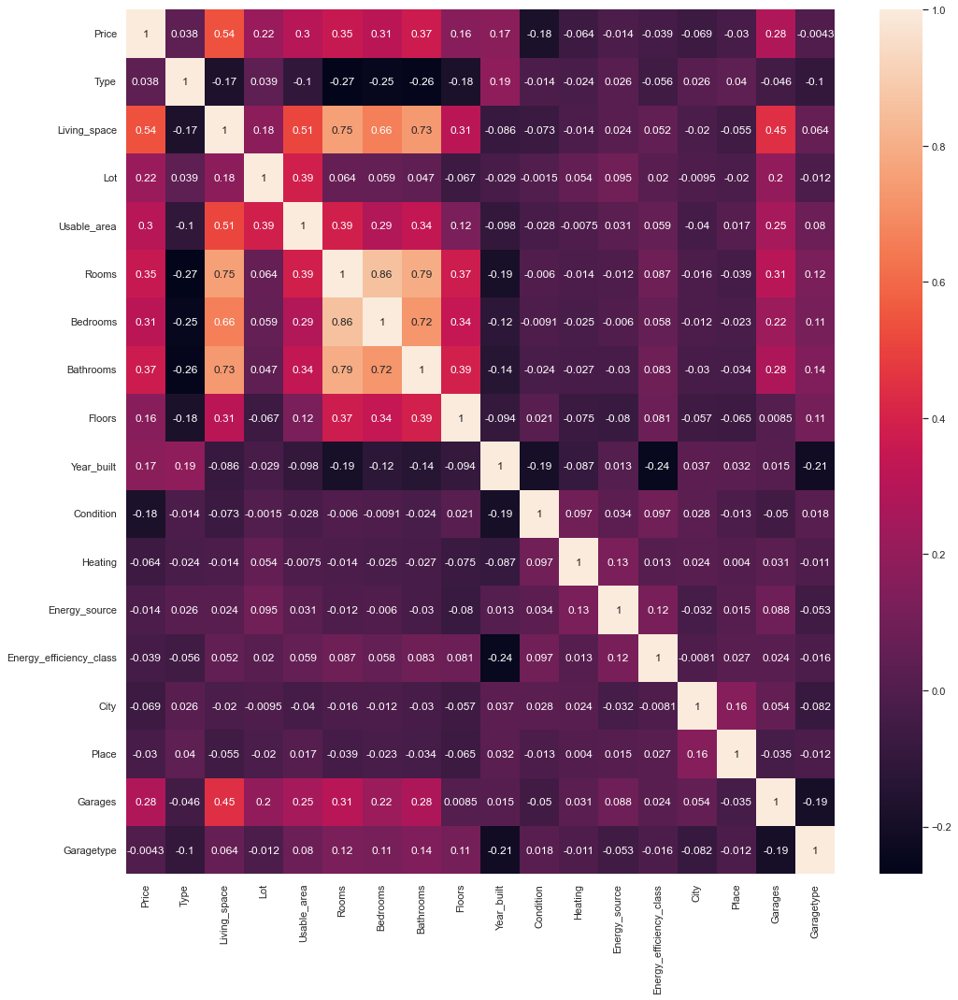

In [30]:
sns.set(rc={'figure.figsize':(17,17)})
sns.heatmap(data_ger_state_1_sub.corr(), annot=True)

The correlation matrix above displays the correlation coefficient for the different variables selected, including the otherwise categorical variables.

We can observe some interrestingly lack of correlation between price and city. As the problem statement of this project suggests, the assumption was that there may have been some correlation between socio-economic factors, which would perhaps be present in the city and/or place in which the housing option is located. Although, we cannot deduce that there is no correlation between the geographic location of housing and the price, as this could still be a matter of a small sample size and/or statistical coincidence.

Other correlations seem pretty logical as for the data. Eg. Energy efficiency class correlating with built year, Price strongly correlated with living space and so on. 

## STATE 2 - Bayern

<AxesSubplot:xlabel='City', ylabel='Price'>

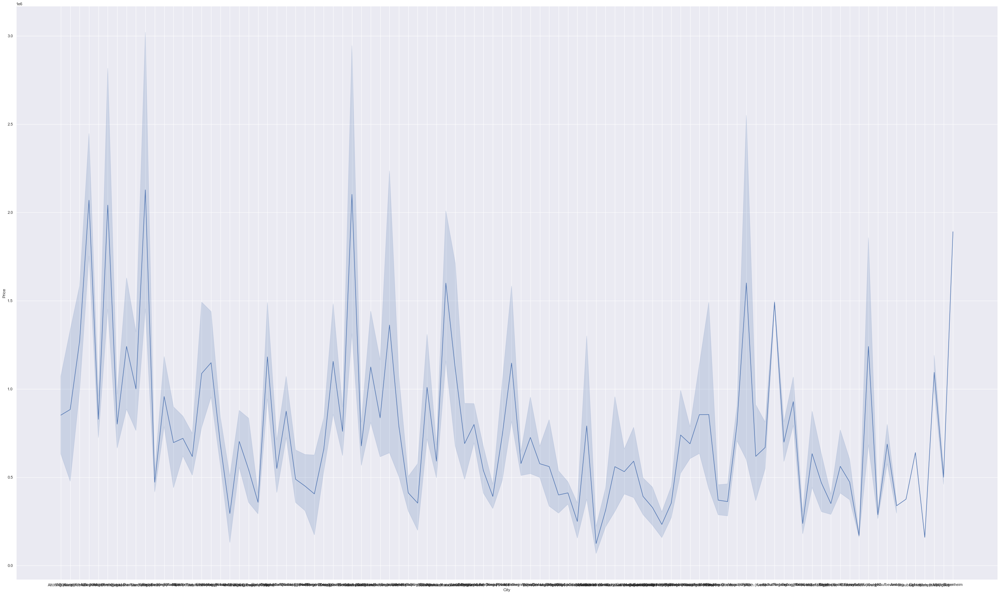

In [31]:
# Plotting Cities housing price distributions in the Bayern state.
plt.figure(figsize=(50,30))
sns.lineplot(x='City', y='Price', data=data_ger_state_2)

The graph above shows that prices plotted on city level creates a distribution that seem to reflect expensive cities from cheaper cities for housing options. 

As argumented above all houses built before the 1900's is removed from the data since they are considered as outliers, also taking into account that these only constitute to a marginal part of the dataset and thereby remove extraordinary cases, as to normalize the dataset.

In [32]:
# Removing observations that are not withing the preferred built year range  
data_ger_state_2.query('Year_built > 1899', inplace=True)

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<AxesSubplot:xlabel='Year_built', ylabel='Price'>

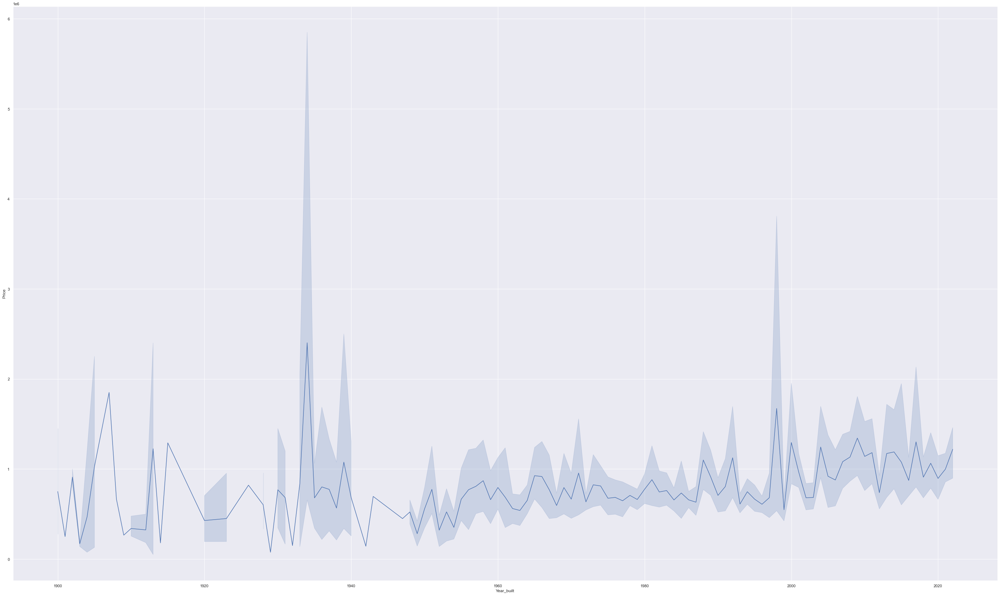

In [33]:
# Plotting the price distribution based on build year in the Bayern state as well.
plt.figure(figsize=(50,30))
sns.lineplot(x='Year_built', y='Price', data=data_ger_state_2)

With the data filtered for outliers for the state of Bayern, the graph above is not only more readable, the max-min distributions are shown for nearly all plotpoints. 

Futhermore, we would like to see a correlation matrix of variables in the dataset. To get the most amount of correlation info, we want to include variables which are non numeric (String values).

In [34]:
# Encoding columns and saving to new dataframe.
data_ger_state_2_sub = MultiColumnLabelEncoder(columns = column_select).fit_transform(data_ger_state_2)
# Imputing for missing data
imp_mean = IterativeImputer(estimator=RandomForestRegressor(), random_state=8)
imp_mean.fit(data_ger_state_2_sub)
data_ger_state_2_sub = pd.DataFrame(imp_mean.transform(data_ger_state_2_sub), columns=data_ger_state_2.columns)

<AxesSubplot:>

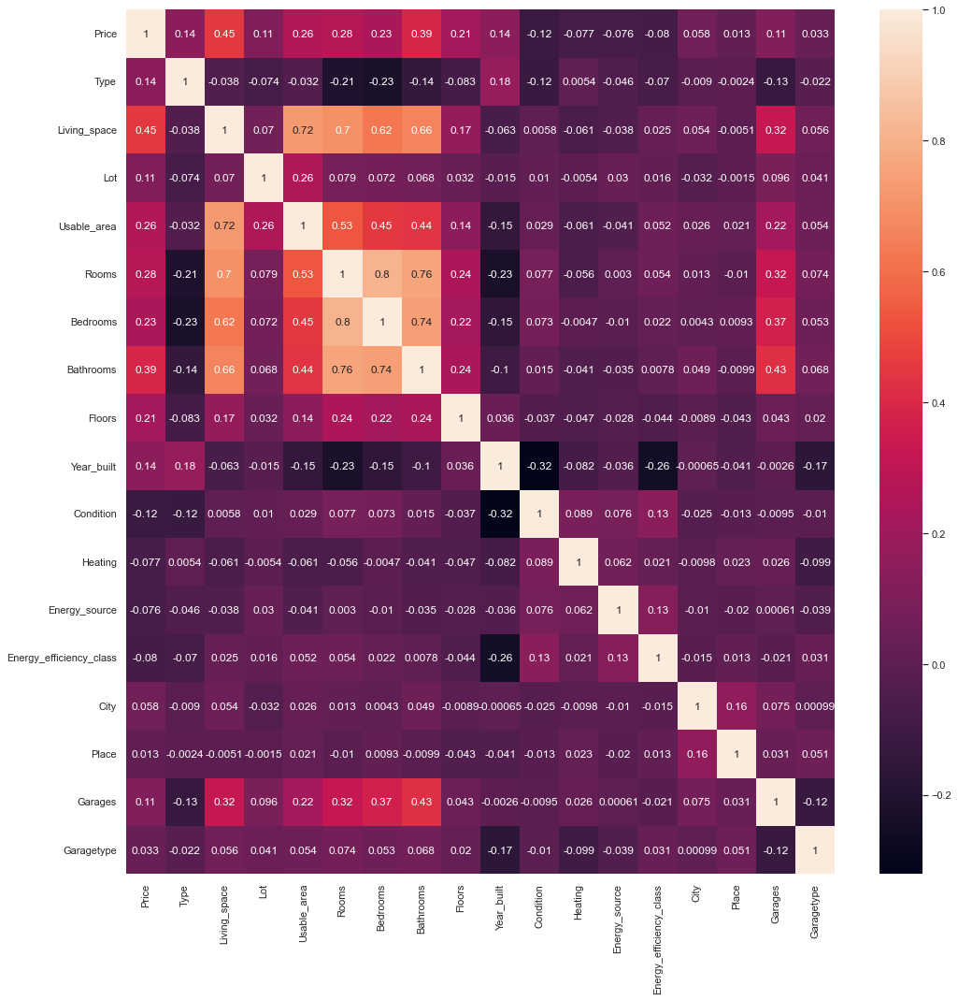

In [35]:
sns.set(rc={'figure.figsize':(17,17)})
sns.heatmap(data_ger_state_2_sub.corr(), annot=True)

The correlation matrix above displays the correlation coefficient for the different variables selected, including the otherwise categorical variables.

## STATE 3 - Baden-Württemberg

<AxesSubplot:xlabel='City', ylabel='Price'>

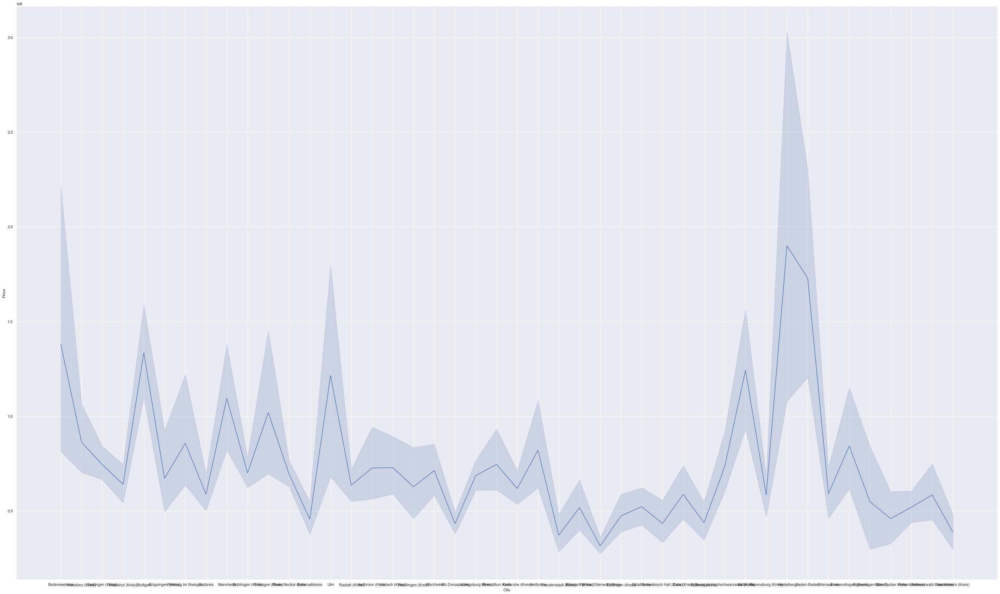

In [36]:
# Plotting Cities housing price distributions in the Baden-Württemberg state.
plt.figure(figsize=(50,30))
sns.lineplot(x='City', y='Price', data=data_ger_state_3)

The graph above shows that prices plotted on city level creates a distribution that seem to reflect expensive cities from cheaper cities for housing options. 

As argumented above all houses built before the 1900's is removed from the data since they are considered as outliers, also taking into account that these only constitute to a marginal part of the dataset and thereby remove extraordinary cases, as to normalize the dataset.

In [37]:
# Removing observations that are not withing the preferred built year range
data_ger_state_3.query('Year_built > 1899', inplace=True)

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<AxesSubplot:xlabel='Year_built', ylabel='Price'>

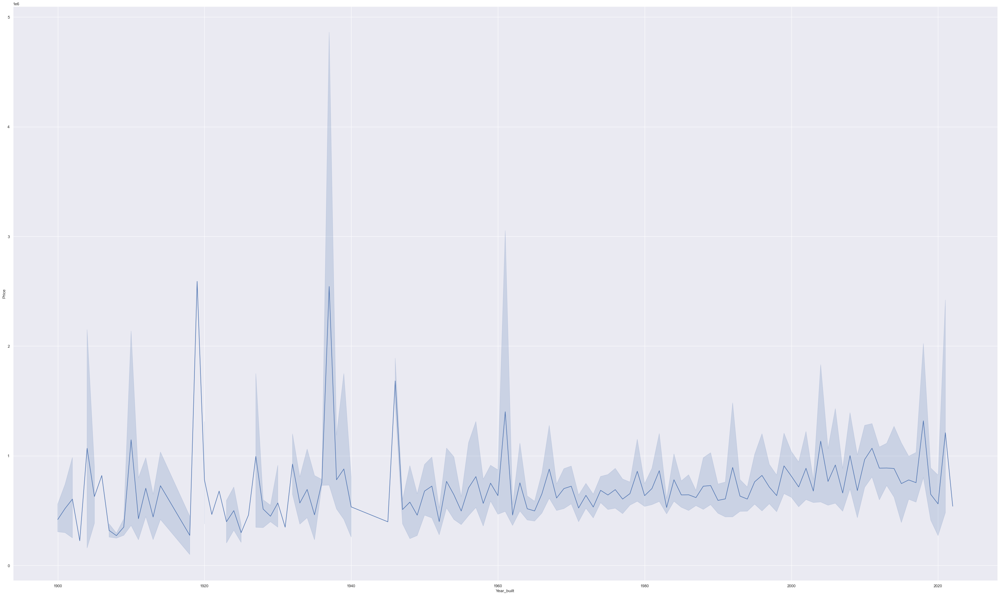

In [38]:
# Plotting the price distribution based on build year in the Baden-Württemberg state as well.
plt.figure(figsize=(50,30))
sns.lineplot(x='Year_built', y='Price', data=data_ger_state_3)

With the data filtered for outliers for the state of Baden-Württemberg, the graph above is not only more readable, the max-min distributions are shown for all plotpoints. 

Futhermore, we would like to see a correlation matrix of variables in the dataset. To get the most amount of correlation info, we want to include variables which are non numeric (String values).

In [39]:
# Encoding columns and saving to new dataframe.
data_ger_state_3_sub = MultiColumnLabelEncoder(columns = column_select).fit_transform(data_ger_state_3)
# Imputing for missing data
imp_mean = IterativeImputer(estimator=RandomForestRegressor(), random_state=8)
imp_mean.fit(data_ger_state_3_sub)
data_ger_state_3_sub = pd.DataFrame(imp_mean.transform(data_ger_state_3_sub), columns=data_ger_state_3.columns)

<AxesSubplot:>

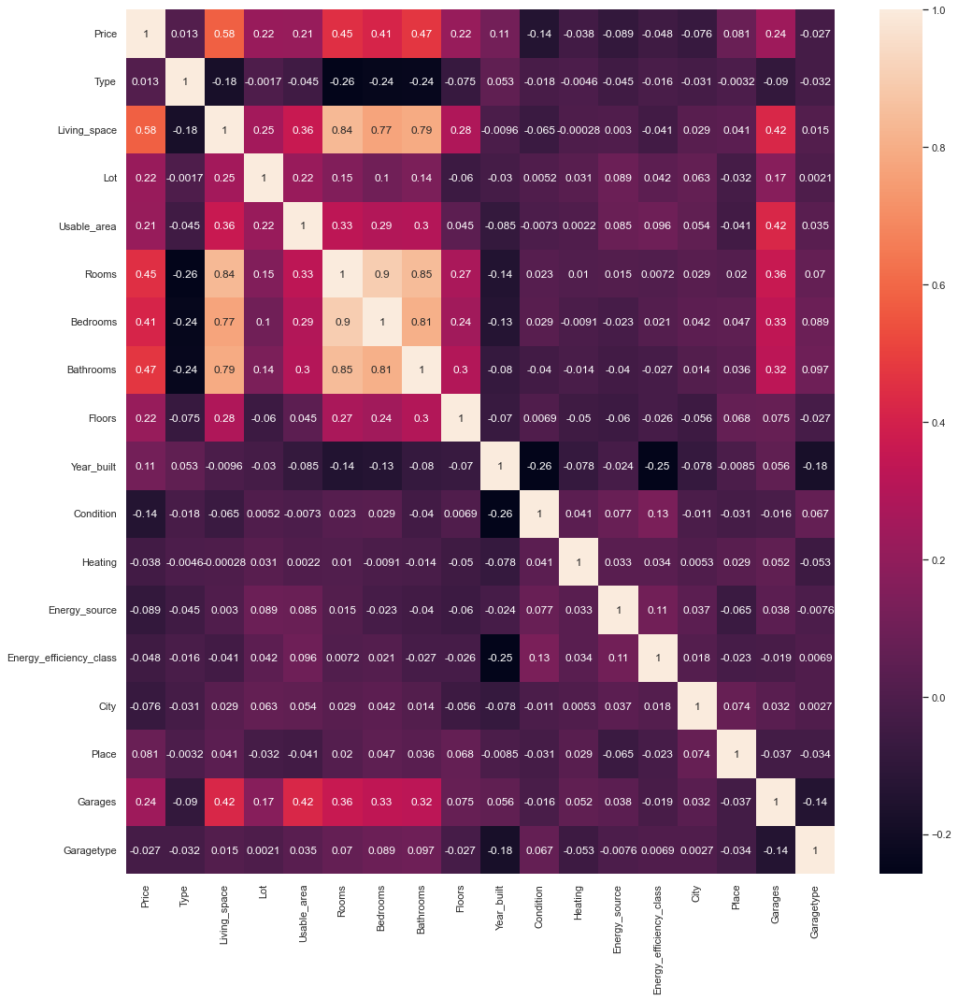

In [40]:
sns.set(rc={'figure.figsize':(17,17)})
sns.heatmap(data_ger_state_3_sub.corr(), annot=True)

The correlation matrix above displays the correlation coefficient for the different variables selected, including the otherwise categorical variables.

## STATE 4 - Neidersachsen

<AxesSubplot:xlabel='City', ylabel='Price'>

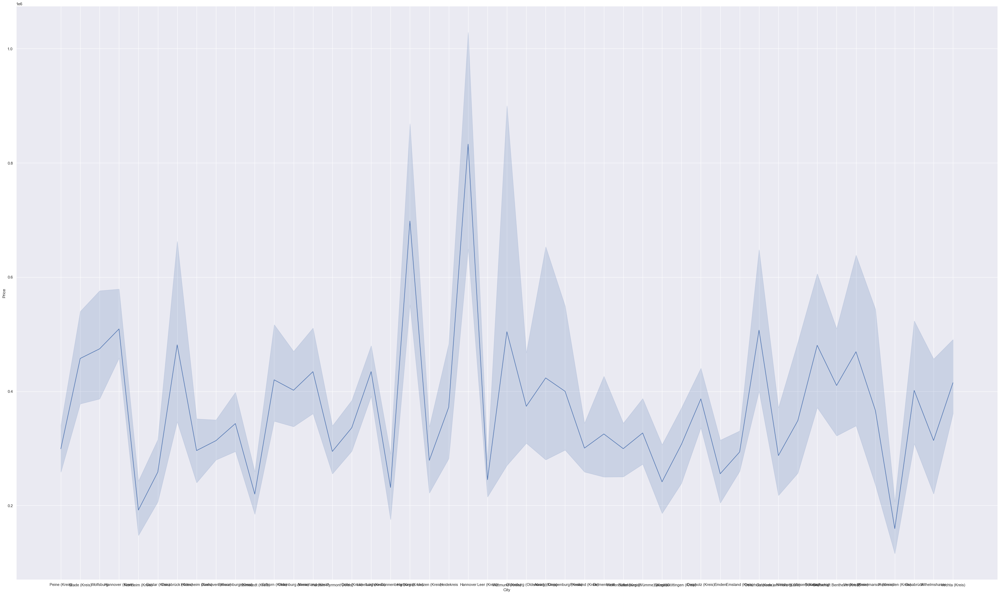

In [41]:
# Plotting Cities housing price distributions in the Neidersachsen state.
plt.figure(figsize=(50,30))
sns.lineplot(x='City', y='Price', data=data_ger_state_4)


The graph above shows that prices plotted on city level creates a distribution that seem to reflect expensive cities from cheaper cities for housing options. 
Trying to visualize this even futher, we can plot some cities housing prices seperately


As argumented above all houses built before the 1900's is removed from the data since they are considered as outliers, also taking into account that these only constitute to a marginal part of the dataset and thereby remove extraordinary cases, as to normalize the dataset.


In [42]:
# Removing observations that are not withing the preferred built year range**  
data_ger_state_4.query('Year_built > 1899', inplace=True)
#data_ger_state_1_sub = data_ger_state_1.groupby('Year_built').filter(lambda x : len(x)>4)


C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<AxesSubplot:xlabel='Year_built', ylabel='Price'>

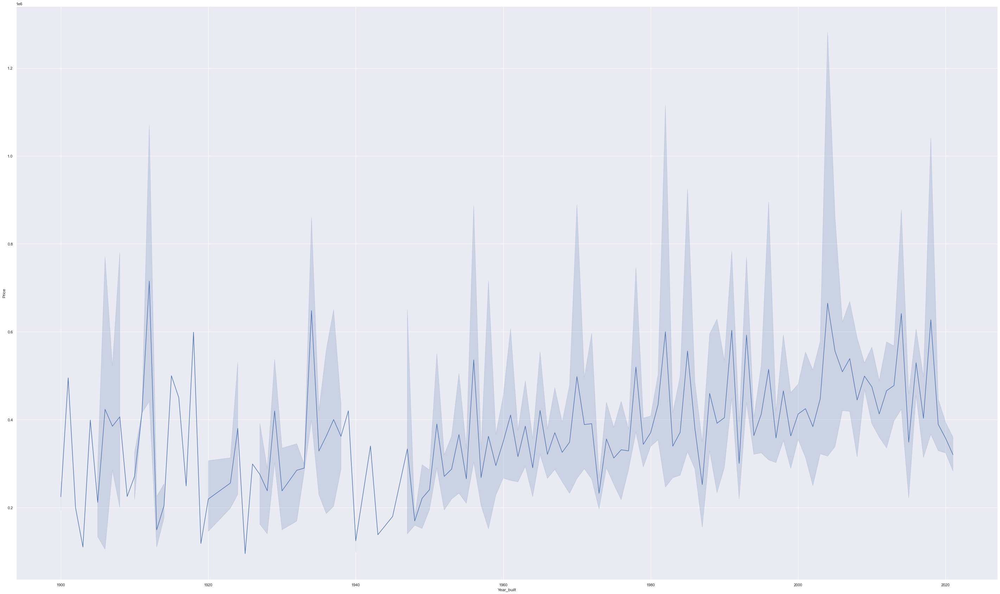

In [43]:
# Plotting the price distribution based on build year in the Baden-Württemberg state as well.
plt.figure(figsize=(50,30))
sns.lineplot(x='Year_built', y='Price', data=data_ger_state_4)

With the data filtered for outliers for the state of Neidersachsen, the graph above is not only more readable, the max-min distributions are shown for all plotpoints. 

Futhermore, we would like to see a correlation matrix of variables in the dataset. To get the most amount of correlation info, we want to include variables which are non numeric (String values).


In [44]:
# Encoding columns and saving to new dataframe.
data_ger_state_4_sub = MultiColumnLabelEncoder(columns = column_select).fit_transform(data_ger_state_4)
# Imputing for missing data
imp_mean = IterativeImputer(estimator=RandomForestRegressor(), random_state=8)
imp_mean.fit(data_ger_state_4_sub)
data_ger_state_4_sub = pd.DataFrame(imp_mean.transform(data_ger_state_4_sub), columns=data_ger_state_4.columns)


<AxesSubplot:>

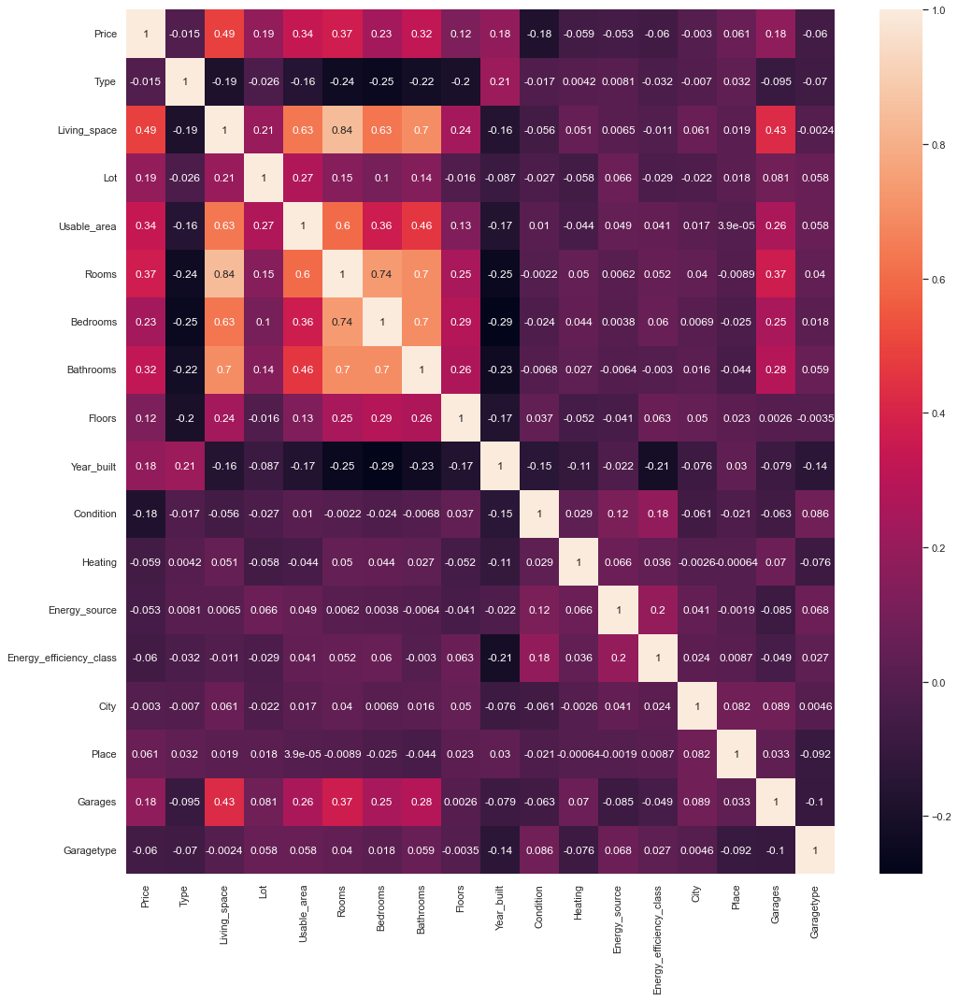

In [45]:
sns.set(rc={'figure.figsize':(17,17)})
sns.heatmap(data_ger_state_4_sub.corr(), annot=True)

The correlation matrix above displays the correlation coefficient for the different variables selected, including the otherwise categorical variables.


## STATE 5 - Rheinland Pfalz

<AxesSubplot:xlabel='City', ylabel='Price'>

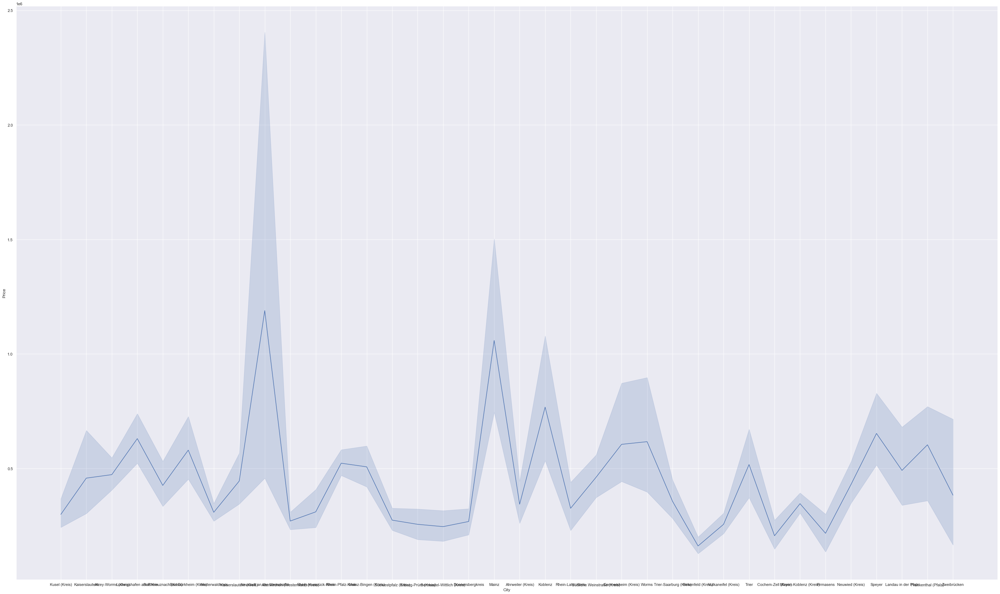

In [46]:
# Plotting Cities housing price distributions in the Rheinland Pfalz state.
plt.figure(figsize=(50,30))
sns.lineplot(x='City', y='Price', data=data_ger_state_5)

The graph above shows that prices plotted on city level creates a distribution that seem to reflect expensive cities from cheaper cities for housing options. 
Trying to visualize this even futher, we can plot some cities housing prices seperately

As argumented above all houses built before the 1900's is removed from the data since they are considered as outliers, also taking into account that these only constitute to a marginal part of the dataset and thereby remove extraordinary cases, as to normalize the dataset.

In [47]:
# Removing observations that are not withing the preferred built year range
data_ger_state_5.query('Year_built > 1899', inplace=True)

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<AxesSubplot:xlabel='Year_built', ylabel='Price'>

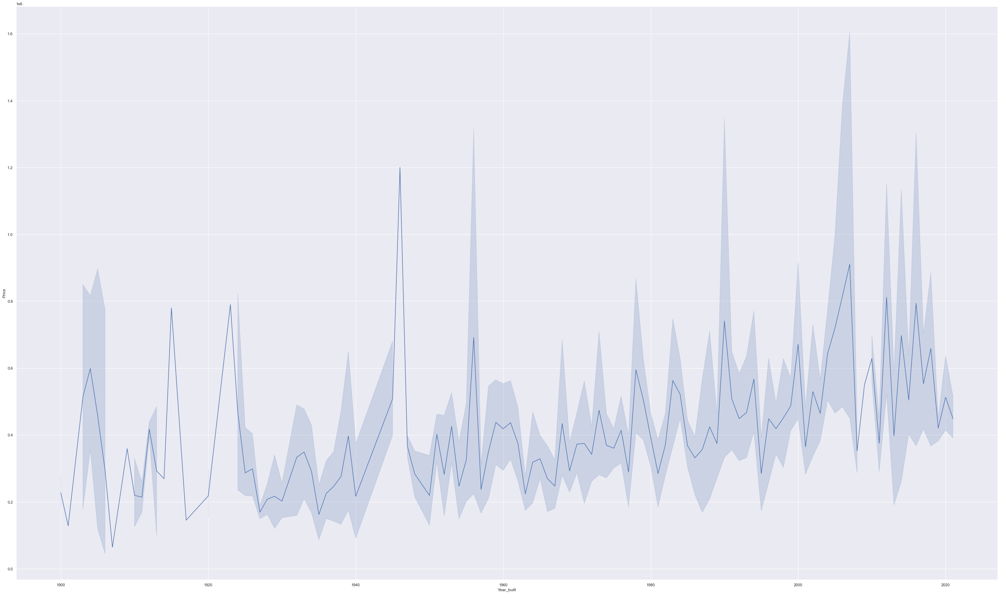

In [48]:
# Plotting the price distribution based on build year in the Rheinland Pfalz state as well.
plt.figure(figsize=(50,30))
sns.lineplot(x='Year_built', y='Price', data=data_ger_state_5)

With the data filtered for outliers for the state of Rheinland Pfalz, the graph above is not only more readable, the max-min distributions are shown for all plotpoints. 

Futhermore, we would like to see a correlation matrix of variables in the dataset. To get the most amount of correlation info, we want to include variables which are non numeric (String values).

In [49]:
# Encoding columns and saving to new dataframe.
data_ger_state_5_sub = MultiColumnLabelEncoder(columns = column_select).fit_transform(data_ger_state_5)

In [50]:
# Imputing for missing data
imp_mean = IterativeImputer(estimator=RandomForestRegressor(), random_state=8)
imp_mean.fit(data_ger_state_5_sub)
data_ger_state_5_sub = pd.DataFrame(imp_mean.transform(data_ger_state_5_sub), columns=data_ger_state_5.columns)


<AxesSubplot:>

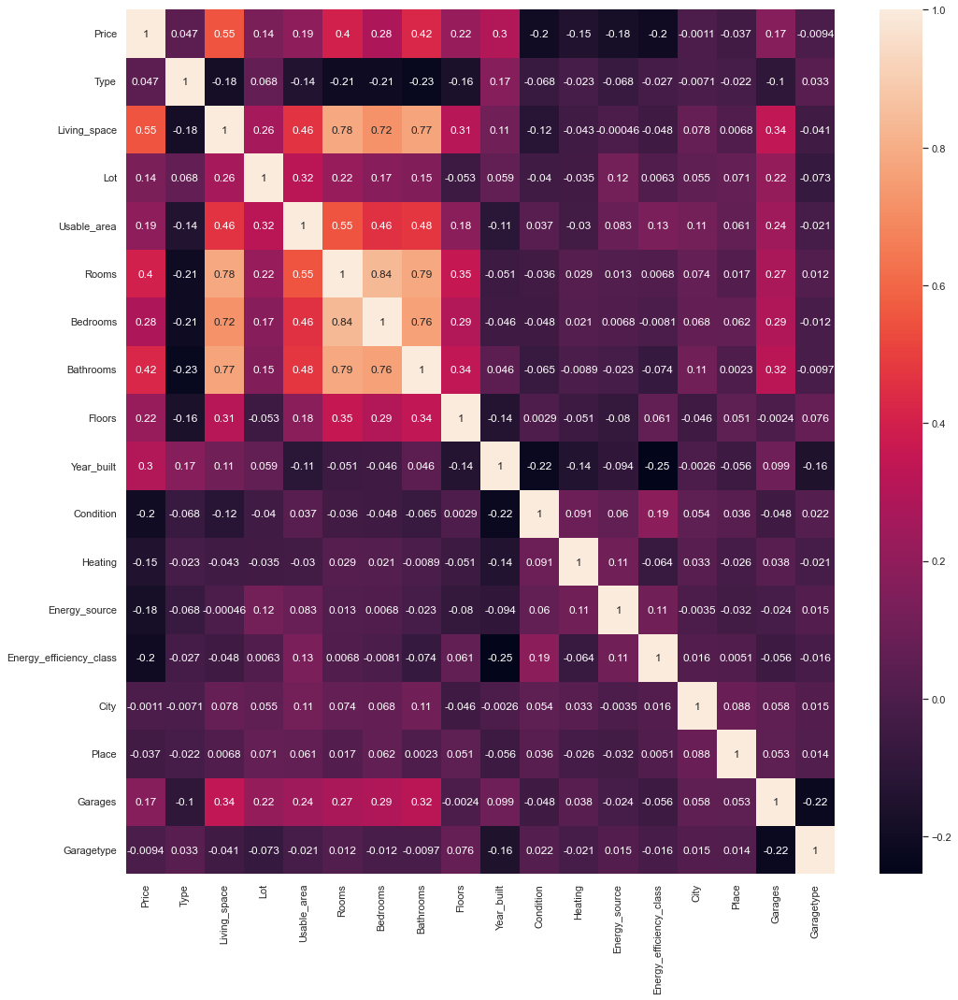

In [51]:
sns.set(rc={'figure.figsize':(17,17)})
sns.heatmap(data_ger_state_5_sub.corr(), annot=True)

The correlation matrix above displays the correlation coefficient for the different variables selected, including the otherwise categorical variables.


In [ ]:
#Files are not shareable sadly


#reading the file for our reginal indicator and unique ID
#Regional_data_raw = pd.read_csv(r"C:\Users\Krisser\Desktop\Skole\9. Sem\M4\M4 projektmappe\SOEP files\D-file.csv", sep=";")
#Regional_data_raw = Regional_data_raw[Regional_data_raw.DB010 > 2015]

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (3,5,27,28) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
# Displaying the regional data
Regional_data_raw

,DB020,DB040,DB040_F,DB050,DB050_F,DB060,DB060_F,DB062,DB062_F,DB070,...,DB110_F,DB120,DB120_F,DB130,DB130_F,DB135x,DB135,DB135_F,DB030,DB010
23,DE,3,1,101,1,101002,1,,-1,,...,-1,11,1,11,1,10,1,1,94,2016
24,DE,3,1,101,1,101002,1,,-1,,...,-1,,-1,11,-2,10,1,1,94,2017
25,DE,3,1,101,1,101002,1,,-1,,...,-1,,-1,11,-2,10,1,1,94,2018
39,DE,1,1,101,1,101004,1,,-1,,...,-1,,-1,11,-2,10,1,1,159,2016
40,DE,1,1,101,1,101004,1,,-1,,...,-1,,-1,11,-2,10,1,1,159,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213590,DE,2,1,1903,1,1900026,1,,-1,,...,-1,,-1,11,-2,10,1,1,3923800,2017
213591,DE,2,1,1903,1,1900026,1,,-1,,...,-1,,-1,11,-2,10,1,1,3923800,2018
213592,DE,2,1,1929,1,1900027,1,,-1,,...,-1,,-1,11,-2,10,1,1,3923835,2017
213593,DE,2,1,1929,1,1900027,1,,-1,,...,-1,11,1,11,1,10,1,1,3923835,2018


In [ ]:
#Saving the 2 coulumns we are initially interested in and modifying the dataframe for better readability
saved_columns = ["DB040","DB030", "DB010"]
Regional_data_convert = pd.DataFrame(Regional_data_raw, columns= saved_columns)
Regional_data_convert.columns = ["Area", "ID", "Year"]

#Creating a dictionary for the differant areas (North Rhine-Westphalia = Nordrehein-Westfalen, Bavaria = Bayern, Lower Saxony = Niedersachsen, Rhineland-Palatinate = Rheinland-Pfalz)
NUTS1 = {1:"Baden-Württemberg", 2:"Bavaria", 3:"Berlin", 4:"Brandenburg", 5:"Bremen", 6:"Hamburg", 7:"Hesse", 8:"Mecklenburg-Vorpommern", 9:"Lower Saxony", 
    10:"North Rhine-Westphalia", 11:"Rhineland-Palatinate", 12:"Saarland", 13:"Saxony", 14:"Saxony-Anhalt", 15:"Schleswig-Holstein", 16:"Thuringia"}

#Mapping the dictionary to our Areas
Regional_data_convert["Area"] = Regional_data_convert["Area"].map(NUTS1)


In [ ]:
# Loading and sorting data for newest observations
R_data = pd.read_csv(r"C:\Users\Krisser\Desktop\Skole\9. Sem\M4\M4 projektmappe\SOEP files\R-file.csv", sep=";", low_memory=False)
R_data = R_data[R_data.RB010 > 2015]

P_data = pd.read_csv(r"C:\Users\Krisser\Desktop\Skole\9. Sem\M4\M4 projektmappe\SOEP files\P-file.csv", sep=";", low_memory=False)
P_data = P_data[P_data.PB010 > 2015]

H_data = pd.read_csv(r"C:\Users\Krisser\Desktop\Skole\9. Sem\M4\M4 projektmappe\SOEP files\H-file.csv", sep=";", low_memory=False)
H_data = H_data[H_data.HB010 > 2015]

In [ ]:
# As all of these datasets contains a coded variable name, we change this to something more relateable for all the following datasets
R_data_filtered = R_data[["RB010", "RB030", "RB031", "RB170", "RB200", "RB210"]]
R_data_filtered.columns = ["Year", "ID", "Year_of_immigration", "Main_activity", "Residential_status", "Activity_status"]


In [ ]:
# Same as above
P_data_filtered = P_data[["PB010", "PB030","PB190", "PE040", "PH010", "PH020", "PL020", "PL030", "PL040", "PL051", "PL060", "PL140", "PL160", "PL170", "PL180", "PL190", "PL200", "PX030"]]
P_data_filtered.columns = ["Year", "ID", "Marital_status", "Highest_ISCED", "Generel_health", "Chronic_condition", "LF_job", "Economic_status", "Employment_status", "Eccupation", "Workhours_weekly", 
    "Contract", "Yearly_jobchange", "Change_reason", "Activity_change", "First_job", "Years_in_workforce", "Household_ID"]


In [ ]:
# Same as above
H_data_filtered = H_data[["HB010", "HB030", "HH010", "HH020", "HS040", "HS050", "HS060", "HS070", "HS090", "HS100", "HS110", "HS120", "HY010", "HY020", "HY022", "HY023", "HX040", "HX100"]]
H_data_filtered.columns = ["Year", "ID", "Dwelling_type", "Tenure_status", "Affording_holiday", "Affording_diverse_food", "Affording_unexpected", "Phone", "Computer", "Washing_machine", 
    "Car", "Ends_meet", "HH_gross_income", "HH_disposable_income", "HH_disposable_no_socialservice", "HH_disposable_income_without_socialservice_pension_survivor", "HH_size", "Income_quintile"]

In [ ]:
# Merging the datasets on the regional key of unique person id and year
Merge_test = pd.merge(Regional_data_convert, R_data_filtered, how="outer", on= ["ID", "Year"])

In [ ]:
# Same as above for the next dataset
Merge_test_2 = pd.merge(Merge_test, P_data_filtered, how="outer", on= ["ID", "Year"])

In [ ]:
# Same as above for the next dataset
Merge_test_3 = pd.merge(Merge_test_2, H_data_filtered, how="outer", on= ["ID", "Year"])

In [ ]:
# Checking to see the different variables added to the now primary dataframe.
Merge_test_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165502 entries, 0 to 165501
Data columns (total 39 columns):
 #   Column                                                       Non-Null Count   Dtype  
---  ------                                                       --------------   -----  
 0   Area                                                         56158 non-null   object 
 1   ID                                                           165502 non-null  int64  
 2   Year                                                         165502 non-null  int64  
 3   Year_of_immigration                                          109467 non-null  object 
 4   Main_activity                                                109468 non-null  object 
 5   Residential_status                                           109468 non-null  object 
 6   Activity_status                                              109468 non-null  object 
 7   Marital_status                                               1083

In [ ]:
# As the Area column, or state of observation, is necessary for later merge upon the housing price dataset, we can only use the observations where this information is present.
Merge_test_3 = Merge_test_3[Merge_test_3['Area'].notna()]

In [ ]:
# Displaying the dataframe as it is. There is a lot of missing values present in this outtake.
Merge_test_3

,Area,ID,Year,Year_of_immigration,Main_activity,Residential_status,Activity_status,Marital_status,Highest_ISCED,Generel_health,...,Computer,Washing_machine,Car,Ends_meet,HH_gross_income,HH_disposable_income,HH_disposable_no_socialservice,HH_disposable_income_without_socialservice_pension_survivor,HH_size,Income_quintile
0,Berlin,94,2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,2,,15143,13748,13748,524,1.0,2
1,Berlin,94,2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,2,,12568,11221,11221,-1307,1.0,1
2,Berlin,94,2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,,,15052,15052,15052,508,1.0,2
3,Baden-Württemberg,159,2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,1,,82371,55064,55064,55064,1.0,5
4,Baden-Württemberg,159,2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,1,,79704,52666,52666,52666,1.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56153,Bavaria,3923800,2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,,,0,,,,5.0,
56154,Bavaria,3923800,2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,3,,13728,13728,5112,5112,5.0,1
56155,Bavaria,3923835,2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,,,0,,,,1.0,
56156,Bavaria,3923835,2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,,,3,,4200,4200,0,0,1.0,1


In [ ]:
# Checking the states with high observation counts. This is good, the first 4 states are the primary states for comparison with the house pricing dataset.
Merge_test_3['Area'].value_counts()

North Rhine-Westphalia    11601
Bavaria                    8658
Baden-Württemberg          6301
Lower Saxony               5469
Hesse                      4026
Saxony                     3224
Rhineland-Palatinate       2655
Berlin                     2423
Brandenburg                2285
Schleswig-Holstein         2149
Thuringia                  1984
Saxony-Anhalt              1857
Mecklenburg-Vorpommern     1236
Hamburg                    1135
Saarland                    652
Bremen                      503
Name: Area, dtype: int64

In [ ]:
# Loading an additional variable dataset, this one is part of the youth questionare made by SOEP.
jugend_data = pd.read_csv(r'C:\Users\Krisser\Desktop\Skole\9. Sem\M4\M4 projektmappe\SOEP files\jugendl.csv', sep=";")

In [ ]:
# Renaming the coded variable names to something more interpretable.
jugend_data = jugend_data[["pid","hid","syear","jl0043","jl0044","jl0045","jl0050","jl0051","jl0056","jl0057","jl0131","jl0147","jl0218","jl0224","jl0225","jl0361","jl0363","jl0369","jl0374","jl0392","jl0437","jl1043","jl1661","jl1662"]]
jugend_data.columns = ["ID", "Household_ID", "Year", "Mother_talk_worry","Mother_asks_prior_decision", "Father_asks_prior_decision", "Mother_trust", "Father_trust", "Mother_show_love", "Father_show_love", "Pref_certificate", 
    "School_grade_satis", "Health_status", "Prob_job_success", "Prob_unemployed", "Trust_people", "Distrust_strangers", "Often_worry", "Am_nervous", "Life_satisfaction", "School_type","Father_talk_worry","Mother_help_homework","Father_help_homework"]


In [ ]:
# Sorting for newer observations.
jugend_data = jugend_data[jugend_data.Year > 2015]

In [ ]:
# Making negative values, which are na values in the dataset by removing every observation that is less than 0  
jugend_data = jugend_data[(jugend_data >= 0) | (jugend_data.isnull())]

<AxesSubplot:xlabel='Mother_trust', ylabel='ID'>

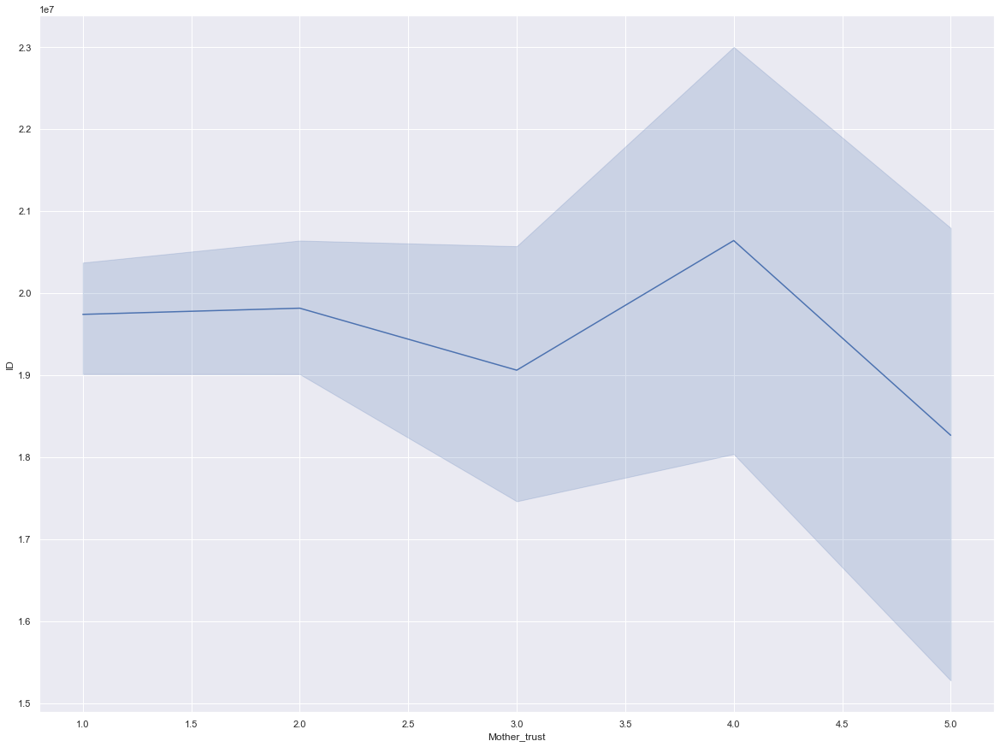

In [ ]:
# Plotting one of the variables on the ID.
# This shows that the distribution does have a lot of variance, which could be caused by the lack of observations.
# We can hopefully improve this by imputing additional data for the missing values.
sns.lineplot(x='Mother_trust',y='ID',data=jugend_data)

In [ ]:
# Imputing missing values using iterative imputer. This is good at guessing missing values by looking at other observations and their variable composition.
imp_mean = IterativeImputer(estimator=RandomForestRegressor(), random_state=8)
imp_mean.fit(jugend_data)
jugend_data = pd.DataFrame(imp_mean.transform(jugend_data), columns=jugend_data.columns)

<AxesSubplot:xlabel='Mother_trust', ylabel='ID'>

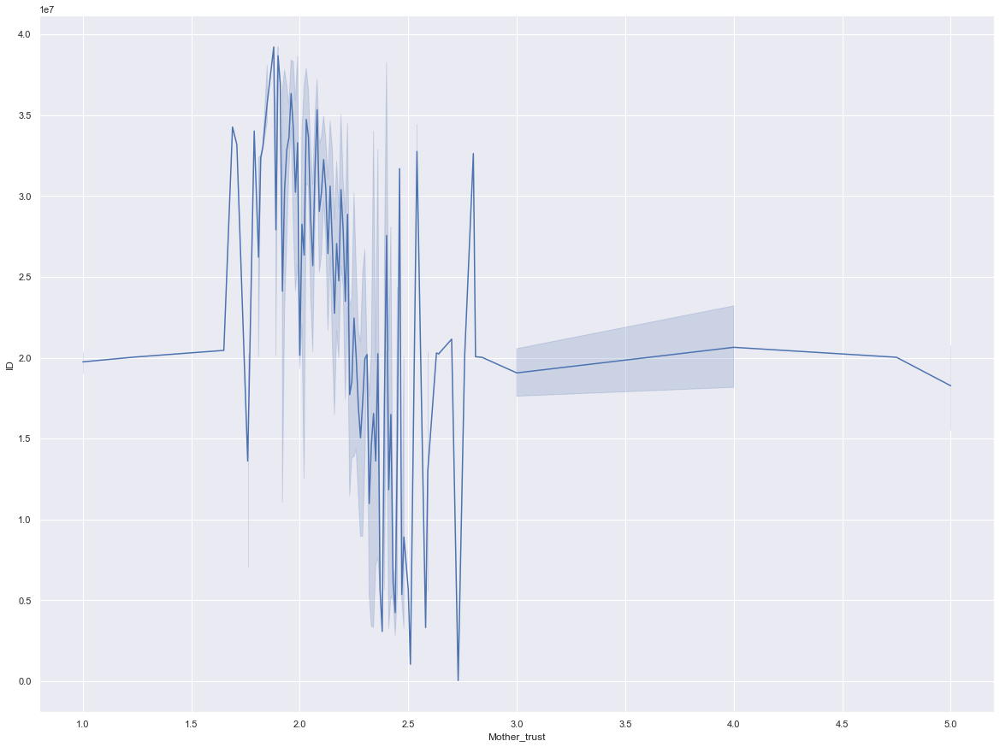

In [ ]:
# Displaying the lineplot after imputing. This seems like the imputer did a good job at creating values which are centered in the middle.
# This seem to have improven the variance in the dataset, as we have observations which are more condensed (blue line), instead of the large spread of observations (shaded areas).
sns.lineplot(x='Mother_trust',y='ID',data=jugend_data)

In [ ]:
# Displaying the dataframe after imputation.
jugend_data

,ID,Household_ID,Year,Mother_talk_worry,Mother_asks_prior_decision,Father_asks_prior_decision,Mother_trust,Father_trust,Mother_show_love,Father_show_love,...,Prob_unemployed,Trust_people,Distrust_strangers,Often_worry,Am_nervous,Life_satisfaction,School_type,Father_talk_worry,Mother_help_homework,Father_help_homework
0,187309.0,113395.0,2016.0,3.00,1.00,1.00,1.00,1.00,1.00,1.00,...,0.0,3.68,6.00,3.0,2.0,9.0,2.03,3.00,2.98,3.62
1,418805.0,114430.0,2016.0,2.00,2.00,1.00,1.00,1.00,1.00,1.00,...,10.0,5.00,3.00,5.0,3.0,7.0,1.00,2.00,3.23,3.05
2,454705.0,45470.0,2016.0,3.00,3.00,3.00,1.00,2.00,3.00,4.00,...,10.0,2.00,6.00,6.0,7.0,8.0,3.00,3.00,2.95,2.63
3,613704.0,61379.0,2016.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,30.0,2.00,6.00,6.0,3.0,8.0,3.00,1.00,3.28,3.10
4,654005.0,65404.0,2016.0,5.00,1.00,1.00,1.00,1.00,1.00,1.00,...,10.0,4.00,7.00,6.0,5.0,8.0,3.00,5.00,3.23,2.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2227,39179903.0,3917991.0,2019.0,2.99,2.55,2.72,2.14,2.15,1.63,2.30,...,32.2,4.18,4.41,4.0,6.0,7.0,2.68,2.88,1.00,1.00
2228,39185105.0,3918513.0,2019.0,3.36,2.65,2.81,2.09,2.19,1.64,2.33,...,25.2,4.88,4.37,1.0,2.0,10.0,2.63,3.00,1.00,1.00
2229,39185203.0,3918521.0,2019.0,3.27,2.58,2.63,1.99,1.77,1.42,2.29,...,20.4,4.99,5.46,3.0,1.0,10.0,2.09,2.67,6.00,6.00
2230,39186005.0,3918602.0,2019.0,3.10,2.65,2.81,1.97,1.84,1.50,2.26,...,24.6,4.58,4.87,6.0,1.0,10.0,2.66,2.72,1.00,1.00


<AxesSubplot:>

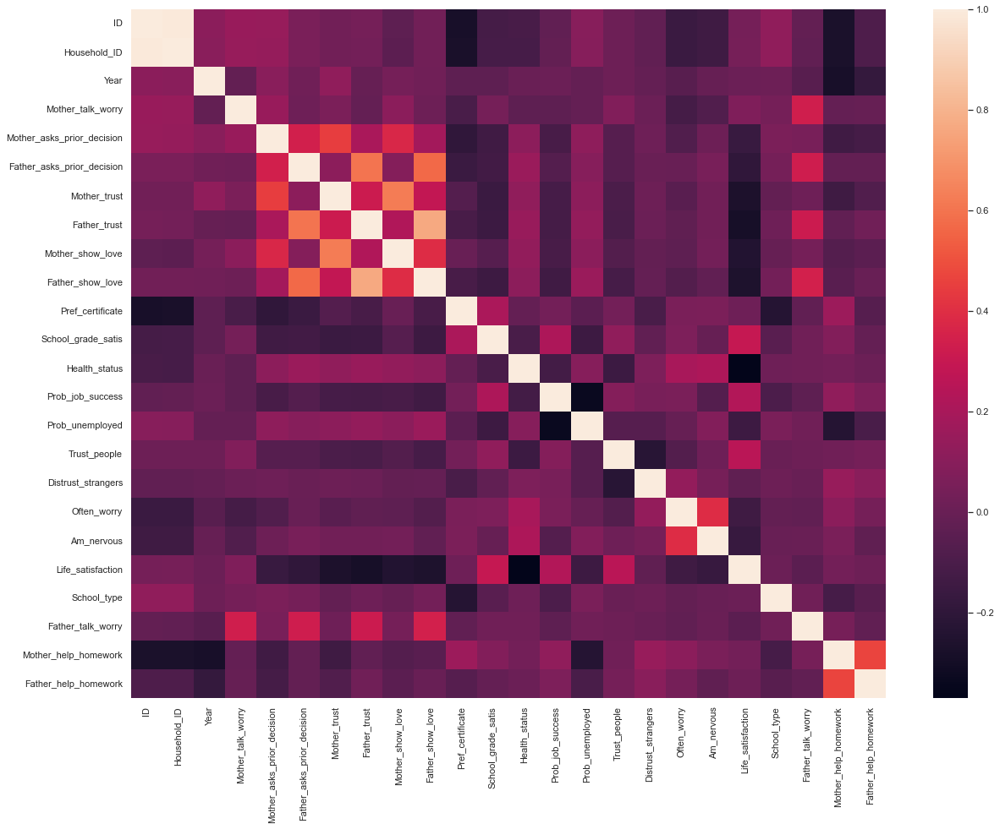

In [ ]:
# Running a fast pearson correlation, all variables are numeric, to see if there are any obvious patterns to identify.
sns.set(rc={'figure.figsize':(20,15)})
sns.heatmap(jugend_data.corr())

Parents interaction with their children seem to have high correlation, which is why these features could be combined into a singular variable.

In [ ]:
# Creating an aggregated parental score for households. This should in term reflect the household youth's view of their parents, as this can be a valueable indicator of physchological well being of the household.

jugend_data['Parental_score_neg'] = (((jugend_data['Mother_talk_worry'] + jugend_data['Father_talk_worry']) / 2) + ((jugend_data["Mother_help_homework"] + jugend_data["Father_help_homework"]) / 2)/ 2)
jugend_data['Parental_score_pos'] = (((jugend_data['Mother_asks_prior_decision'] + jugend_data['Father_asks_prior_decision']) / 2) + ((jugend_data['Mother_trust'] + jugend_data['Father_trust']) / 2) + ((jugend_data['Mother_show_love'] + jugend_data['Father_show_love']) / 2) / 3)
# The summary score is a reflection of how supportive parents are in regards to their children. Note that a lower score is gained for gaining a 'good' score in the survery and vice versa.  
jugend_data['Parental_score_sum'] = (jugend_data['Parental_score_pos'] - jugend_data['Parental_score_neg']) 

In [ ]:
jugend_data

,ID,Household_ID,Year,Mother_talk_worry,Mother_asks_prior_decision,Father_asks_prior_decision,Mother_trust,Father_trust,Mother_show_love,Father_show_love,...,Often_worry,Am_nervous,Life_satisfaction,School_type,Father_talk_worry,Mother_help_homework,Father_help_homework,Parental_score_neg,Parental_score_pos,Parental_score_sum
0,187309.0,113395.0,2016.0,3.00,1.00,1.00,1.00,1.00,1.00,1.00,...,3.0,2.0,9.0,2.03,3.00,2.98,3.62,4.650,2.333333,-2.316667
1,418805.0,114430.0,2016.0,2.00,2.00,1.00,1.00,1.00,1.00,1.00,...,5.0,3.0,7.0,1.00,2.00,3.23,3.05,3.570,2.833333,-0.736667
2,454705.0,45470.0,2016.0,3.00,3.00,3.00,1.00,2.00,3.00,4.00,...,6.0,7.0,8.0,3.00,3.00,2.95,2.63,4.395,5.666667,1.271667
3,613704.0,61379.0,2016.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,6.0,3.0,8.0,3.00,1.00,3.28,3.10,2.595,2.333333,-0.261667
4,654005.0,65404.0,2016.0,5.00,1.00,1.00,1.00,1.00,1.00,1.00,...,6.0,5.0,8.0,3.00,5.00,3.23,2.97,6.550,2.333333,-4.216667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2227,39179903.0,3917991.0,2019.0,2.99,2.55,2.72,2.14,2.15,1.63,2.30,...,4.0,6.0,7.0,2.68,2.88,1.00,1.00,3.435,5.435000,2.000000
2228,39185105.0,3918513.0,2019.0,3.36,2.65,2.81,2.09,2.19,1.64,2.33,...,1.0,2.0,10.0,2.63,3.00,1.00,1.00,3.680,5.531667,1.851667
2229,39185203.0,3918521.0,2019.0,3.27,2.58,2.63,1.99,1.77,1.42,2.29,...,3.0,1.0,10.0,2.09,2.67,6.00,6.00,5.970,5.103333,-0.866667
2230,39186005.0,3918602.0,2019.0,3.10,2.65,2.81,1.97,1.84,1.50,2.26,...,6.0,1.0,10.0,2.66,2.72,1.00,1.00,3.410,5.261667,1.851667


In [ ]:
# Merging the new youth data to the rest of the data. Keeping all observations.
Merge_test_4 = pd.merge(Merge_test_3, jugend_data, how="outer", on= ["Household_ID"])

In [ ]:
# Displaying the new and updated dataset. A lot of missing values are present, as well as new missing values in the Area column, this is not good
# as it indicates that the youth data household id used for merging, has a lot of household id's missing from the previous dataframe. 
Merge_test_4

,Area,ID_x,Year_x,Year_of_immigration,Main_activity,Residential_status,Activity_status,Marital_status,Highest_ISCED,Generel_health,...,Often_worry,Am_nervous,Life_satisfaction,School_type,Father_talk_worry,Mother_help_homework,Father_help_homework,Parental_score_neg,Parental_score_pos,Parental_score_sum
0,Berlin,94.0,2016.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Berlin,94.0,2017.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Berlin,94.0,2018.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Baden-Württemberg,159.0,2016.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Baden-Württemberg,159.0,2017.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58382,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.0,6.0,7.0,2.68,2.88,1.0,1.0,3.435,5.435000,2.000000
58383,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,2.0,10.0,2.63,3.00,1.0,1.0,3.680,5.531667,1.851667
58384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,1.0,10.0,2.09,2.67,6.0,6.0,5.970,5.103333,-0.866667
58385,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.0,1.0,10.0,2.66,2.72,1.0,1.0,3.410,5.261667,1.851667


In [ ]:
# Defining the list of Areas (States) which are needed to merge on the upcoming housing price dataset.
housing_data_list = ['Baden-Württemberg','North Rhine-Westphalia', 'Bavaria', 'Lower Saxony', 'Rhineland-Palatinate']

In [ ]:
# Keeping only observations which are part of the list above
Merge_test_4 = Merge_test_4[Merge_test_4['Area'].isin(housing_data_list)]
# This is very unfortunate, we lost a lot of observations.
Merge_test_4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34684 entries, 3 to 56159
Data columns (total 65 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   Area                                                         34684 non-null  object 
 1   ID_x                                                         34684 non-null  float64
 2   Year_x                                                       34684 non-null  float64
 3   Year_of_immigration                                          86 non-null     object 
 4   Main_activity                                                86 non-null     object 
 5   Residential_status                                           86 non-null     object 
 6   Activity_status                                              86 non-null     object 
 7   Marital_status                                               84 non-null    

Unfortunately, after merging the data and sorting for Area (State) the amount of observations for a lot of features are severely lacking.
Therefore, it is decided to keep only the features of which that contains a lot of observations.

Limited in the feature selection, the following steps are taken to prepare for feature engineering


In [ ]:
# Add relevant features to a new dataset and discarding the rest. There are simply too few observations to justify imputation of the missing values.
feature_data = Merge_test_4.iloc[:,np.r_[0, 23:39]]

In [ ]:
# Some missing data was replaced with a blank space, which will have to be replaced with NA.
feature_data = feature_data.replace(' ', np.nan)

In [ ]:
# After this sorting, there have unfortunately been discovered more variables of which there are few to no observations 
feature_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34684 entries, 3 to 56159
Data columns (total 17 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   Area                                                         34684 non-null  object 
 1   Dwelling_type                                                28525 non-null  object 
 2   Tenure_status                                                0 non-null      float64
 3   Affording_holiday                                            31295 non-null  object 
 4   Affording_diverse_food                                       33820 non-null  object 
 5   Affording_unexpected                                         34474 non-null  object 
 6   Phone                                                        5842 non-null   object 
 7   Computer                                                     0 non-null     

In [ ]:
# Dropping empty feature columns
droplist = ['Tenure_status','Computer','Washing_machine','Ends_meet']
feature_data.drop(droplist, axis=1, inplace=True)

In [ ]:
# Missing features has been dropped, but some observations with decimals use a comma decimal seperator instead of a punctuation mark.
feature_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34684 entries, 3 to 56159
Data columns (total 13 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   Area                                                         34684 non-null  object 
 1   Dwelling_type                                                28525 non-null  object 
 2   Affording_holiday                                            31295 non-null  object 
 3   Affording_diverse_food                                       33820 non-null  object 
 4   Affording_unexpected                                         34474 non-null  object 
 5   Phone                                                        5842 non-null   object 
 6   Car                                                          31496 non-null  object 
 7   HH_gross_income                                              34601 non-null 

In [ ]:
# Correcting decimals on problematic columns
feature_data.iloc[:,7:11] = feature_data.iloc[:,7:11].apply(lambda x: x.str.replace(',','.'))

In [ ]:
# Tried an iterative imputer, but this gives Convergence Warnings; the results of the algorithm cannot be trusted. It is necessary to find another way to impute.
# https://biologyforfun.wordpress.com/2018/04/09/help-i-have-convergence-warnings/

#imp_mean = IterativeImputer(estimator=RandomForestRegressor(), random_state=18, max_iter=20)
#imp_mean.fit(feature_data.iloc[:,1:7])
#feature_data.iloc[:,1:7] = pd.DataFrame(imp_mean.transform(feature_data.iloc[:,1:7]), columns=feature_data.iloc[:,1:7].columns)

In [ ]:
# Using the KNN imputer instead. This should not be as precise as the iterative imputer, 
# but it should provide some data that would otherwise have to be removed.
# This is done with checking neighbouring observations and calculating a new observation. 
feature_data.iloc[:,np.r_[11,1:7]] = KNN(k=3).fit_transform(feature_data.iloc[:,np.r_[11,1:7]])

Imputing row 1/34684 with 1 missing, elapsed time: 133.264
Imputing row 101/34684 with 1 missing, elapsed time: 133.438
Imputing row 201/34684 with 1 missing, elapsed time: 133.549
Imputing row 301/34684 with 1 missing, elapsed time: 133.649
Imputing row 401/34684 with 1 missing, elapsed time: 133.744
Imputing row 501/34684 with 2 missing, elapsed time: 133.840
Imputing row 601/34684 with 2 missing, elapsed time: 133.934
Imputing row 701/34684 with 2 missing, elapsed time: 134.023
Imputing row 801/34684 with 1 missing, elapsed time: 134.111
Imputing row 901/34684 with 1 missing, elapsed time: 134.210
Imputing row 1001/34684 with 1 missing, elapsed time: 134.350
Imputing row 1101/34684 with 1 missing, elapsed time: 134.496
Imputing row 1201/34684 with 1 missing, elapsed time: 134.653
Imputing row 1301/34684 with 1 missing, elapsed time: 134.883
Imputing row 1401/34684 with 1 missing, elapsed time: 135.101
Imputing row 1501/34684 with 2 missing, elapsed time: 135.295
Imputing row 1601/34

In [ ]:
# Using KNN imputer for monetary variables as well. Splitting these imputations up as they by themselves take a lot of time.
feature_data.iloc[:,7:11] = KNN(k=3).fit_transform(feature_data.iloc[:,7:11])

Imputing row 1/34684 with 0 missing, elapsed time: 131.501
Imputing row 101/34684 with 0 missing, elapsed time: 131.547
Imputing row 201/34684 with 0 missing, elapsed time: 131.553
Imputing row 301/34684 with 0 missing, elapsed time: 131.553
Imputing row 401/34684 with 0 missing, elapsed time: 131.566
Imputing row 501/34684 with 0 missing, elapsed time: 131.597
Imputing row 601/34684 with 0 missing, elapsed time: 131.599
Imputing row 701/34684 with 0 missing, elapsed time: 131.599
Imputing row 801/34684 with 0 missing, elapsed time: 131.599
Imputing row 901/34684 with 0 missing, elapsed time: 131.599
Imputing row 1001/34684 with 0 missing, elapsed time: 131.600
Imputing row 1101/34684 with 0 missing, elapsed time: 131.600
Imputing row 1201/34684 with 0 missing, elapsed time: 131.600
Imputing row 1301/34684 with 0 missing, elapsed time: 131.600
Imputing row 1401/34684 with 0 missing, elapsed time: 131.600
Imputing row 1501/34684 with 0 missing, elapsed time: 131.601
Imputing row 1601/34

In [ ]:
# Converting object type columns to floats and integers respectively
feature_data.iloc[:,7:11] = feature_data.iloc[:,7:11].astype(float, errors='raise')
# We want integers for these columns, as they represent a categorical value and therefore can't be with decimals.
feature_data.iloc[:,np.r_[11,1:7]] = feature_data.iloc[:,np.r_[11,1:7]].astype(int, errors='raise')

In [ ]:
# Removing observations where the monetary values are 0 in gross income, as these are treated as unrepresentative outliers
feature_data = feature_data[feature_data.HH_gross_income != 0]

In [ ]:
# Now we have a full dataset, with only a slight decrease in observations.
feature_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30526 entries, 3 to 56159
Data columns (total 13 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   Area                                                         30526 non-null  object 
 1   Dwelling_type                                                30526 non-null  int32  
 2   Affording_holiday                                            30526 non-null  int32  
 3   Affording_diverse_food                                       30526 non-null  int32  
 4   Affording_unexpected                                         30526 non-null  int32  
 5   Phone                                                        30526 non-null  int32  
 6   Car                                                          30526 non-null  int32  
 7   HH_gross_income                                              30526 non-null 

In [ ]:
# First feature enginered variable. Simply creating a feature for the social service income by subtracting pre and post social service disposable income.
feature_data['HH_social_service_dis_income'] = (feature_data['HH_disposable_income'] - feature_data['HH_disposable_no_socialservice'])
feature_data

,Area,Dwelling_type,Affording_holiday,Affording_diverse_food,Affording_unexpected,Phone,Car,HH_gross_income,HH_disposable_income,HH_disposable_no_socialservice,HH_disposable_income_without_socialservice_pension_survivor,HH_size,Income_quintile,HH_social_service_dis_income
3,Baden-Württemberg,1,1,1,1,1,1,82371.0,55064.0,55064.0,55064.0,1,5,0.0
4,Baden-Württemberg,1,1,1,1,1,1,79704.0,52666.0,52666.0,52666.0,1,5,0.0
5,Baden-Württemberg,1,1,1,1,1,1,79963.0,74767.0,74767.0,74767.0,1,5,0.0
47,Bavaria,1,1,1,1,1,1,115420.0,77017.0,72697.0,72697.0,4,5,4320.0
48,Bavaria,1,1,1,1,1,1,131720.0,90532.0,80886.0,80886.0,4,5,9646.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56152,North Rhine-Westphalia,3,1,1,1,1,1,63323.0,59224.0,38009.0,38009.0,4,4,21215.0
56153,Bavaria,4,1,1,2,1,1,22366.0,17749.0,17749.0,17749.0,2,1,0.0
56154,Bavaria,4,1,1,1,1,1,25149.0,19587.0,19587.0,19587.0,2,2,0.0
56155,North Rhine-Westphalia,3,2,2,2,1,2,21096.0,18863.0,8567.0,8567.0,1,3,10296.0


In [ ]:
# Crosstab comparison of unexpected costs for the household and the ability to afford diverse food.
# Though it would seem that unexpected costs is the primary issue, 
# combining these variables can yield a feature that says something about the households ability to provide necessities to it's residents.

pd.crosstab([feature_data['Affording_diverse_food'], feature_data['Affording_unexpected']], feature_data['Car'])

Car                                              1     2     3
Affording_diverse_food Affording_unexpected                   
1                      1                     19303   502  1594
                       2                      4961  2629  1049
2                      1                        29     6     4
                       2                       163   252    34

In [ ]:
# Defining different aggregate relative poverty indexes with different household data combinations.

def categorise(row):  
    if row['Affording_diverse_food'] == 2 and row['Affording_unexpected'] == 2 and row['Car'] == 2:
        return 'Poor_unstable'
    elif row['Affording_diverse_food'] == 1 and row['Affording_unexpected'] == 1 and row['Car'] == 1:
        return 'Economically_stable'
    elif row['Affording_diverse_food'] == 1 and row['Affording_unexpected'] == 2 and row['Car'] >= 2:
        return 'Economically_unstable'
    return 'Relatively_stable'

In [ ]:
# Applying function above to a new column in the dataset.

feature_data['Relative_poverty'] = feature_data.apply(lambda row: categorise(row), axis=1)

In [ ]:
# We want to convert the new Relative_poverty feature to be a numerical by using Ordinal Encoder
# This is done for later use, while still keeping the explanitory feature.
ord_enc = OrdinalEncoder()
feature_data["Relative_pov_cat"] = ord_enc.fit_transform(feature_data[["Relative_poverty"]])

In [ ]:
# We can remove the aggregated variables now. These should in theory be represented by the remaining features.
feature_data.drop(['Affording_diverse_food','Affording_unexpected','Car','Relative_poverty','HH_disposable_no_socialservice','HH_disposable_income_without_socialservice_pension_survivor'], axis=1, inplace=True)


In [ ]:
# Displaying the dataframe before next step of splitting it to state.
feature_data

,Area,Dwelling_type,Affording_holiday,Phone,HH_gross_income,HH_disposable_income,HH_size,Income_quintile,HH_social_service_dis_income,Relative_pov_cat
3,Baden-Württemberg,1,1,1,82371.0,55064.0,1,5,0.0,0.0
4,Baden-Württemberg,1,1,1,79704.0,52666.0,1,5,0.0,0.0
5,Baden-Württemberg,1,1,1,79963.0,74767.0,1,5,0.0,0.0
47,Bavaria,1,1,1,115420.0,77017.0,4,5,4320.0,0.0
48,Bavaria,1,1,1,131720.0,90532.0,4,5,9646.0,0.0
...,...,...,...,...,...,...,...,...,...,...
56152,North Rhine-Westphalia,3,1,1,63323.0,59224.0,4,4,21215.0,0.0
56153,Bavaria,4,1,1,22366.0,17749.0,2,1,0.0,3.0
56154,Bavaria,4,1,1,25149.0,19587.0,2,2,0.0,0.0
56155,North Rhine-Westphalia,3,2,1,21096.0,18863.0,1,3,10296.0,2.0


Now the feature engineering of relevant variables are finished, the preparation of the data for combining with the housing dataset is next.

Splitting the dataset out to the following states: 'Baden-Württemberg','North Rhine-Westphalia', 'Bavaria', 'Lower Saxony', 'Rhineland Palatinate' is necessary to prepare it for merging.

In [ ]:
# It is necessary to split the data into separate groupings based on state because of the later need to merge this data with the housing price data.
feature_data_Baden_Wurttemberg = feature_data[feature_data['Area'] == 'Baden-Württemberg']
feature_data_North_Rhine_Westphalia = feature_data[feature_data['Area'] == 'North Rhine-Westphalia']
feature_data_Bavaria = feature_data[feature_data['Area'] == 'Bavaria']
feature_data_Lower_Saxony = feature_data[feature_data['Area'] == 'Lower Saxony']
feature_data_Rhineland_Palatinate = feature_data[feature_data['Area'] == 'Rhineland-Palatinate']

In [ ]:
# Resetting index and deleting the old one
feature_data_Baden_Wurttemberg.reset_index(inplace=True, drop=True)
feature_data_North_Rhine_Westphalia.reset_index(inplace=True, drop=True)
feature_data_Bavaria.reset_index(inplace=True, drop=True)
feature_data_Lower_Saxony.reset_index(inplace=True, drop=True)
feature_data_Rhineland_Palatinate.reset_index(inplace=True, drop=True)

In [ ]:
# Saving the statistical describtion to seperate csv's as the features for later use in the housing price dataset
feature_data_Baden_Wurttemberg.describe().to_csv("Baden_wurttemberg.csv")
feature_data_North_Rhine_Westphalia.describe().to_csv("North_rhine_westphalia.csv")
feature_data_Bavaria.describe().to_csv("Bavaria.csv")
feature_data_Lower_Saxony.describe().to_csv("Lower_saxony.csv")
feature_data_Rhineland_Palatinate.describe().to_csv("Rhineland_palatinate.csv")

In [ ]:
# Reading the csv's with the index being the statistical categories
Baden_wurttember_sing = pd.read_csv("Baden_wurttemberg.csv", index_col="Unnamed: 0")
North_rhine_westphalia_sing = pd.read_csv("North_rhine_westphalia.csv", index_col="Unnamed: 0")
Bavaria_sing = pd.read_csv('Bavaria.csv', index_col="Unnamed: 0")
Lower_saxony_sing = pd.read_csv("Lower_saxony.csv", index_col="Unnamed: 0")
Rhineland_palatinate_sing = pd.read_csv("Rhineland_palatinate.csv", index_col="Unnamed: 0")

In [ ]:
# Dropping unnecessary columns 
Baden_wurttember_sing.drop(['count', 'min', '25%', '50%','75%','max'], axis='index', inplace=True)
North_rhine_westphalia_sing.drop(['count', 'min', '25%', '50%','75%','max'], axis='index', inplace=True)
Bavaria_sing.drop(['count', 'min', '25%', '50%','75%','max'], axis='index', inplace=True)
Lower_saxony_sing.drop(['count', 'min', '25%', '50%','75%','max'], axis='index', inplace=True)
Rhineland_palatinate_sing.drop(['count', 'min', '25%', '50%','75%','max'], axis='index', inplace=True)

In [ ]:
# Adding data for 2019 crime rate pr. 100.000 capita in German states
# As this data cannot be exported, it is manually entered.
# https://www.statista.com/statistics/1081057/crime-rate-in-germany/
Crime_rate = {'Baden_Wurttemberg_crime_rate': [5037], 'North_Rhine_Westphalia_crime_rate': [6720], 'Bavaria_crime_rate': [4343], 'Lower_Saxony_crime_rate': [6272], 'Rhineland_Palatinate_crime_rate': [5777]}
Crime_rate = pd.DataFrame(Crime_rate)

In [ ]:
# Adding crime rate pr. capita to states
Baden_wurttember_sing.loc[Baden_wurttember_sing.index[0], 'crime_rate'] = Crime_rate['Baden_Wurttemberg_crime_rate'].item()
North_rhine_westphalia_sing.loc[North_rhine_westphalia_sing.index[0], 'crime_rate'] = Crime_rate['North_Rhine_Westphalia_crime_rate'].item()
Bavaria_sing.loc[Bavaria_sing.index[0], 'crime_rate'] = Crime_rate['Bavaria_crime_rate'].item()
Lower_saxony_sing.loc[Lower_saxony_sing.index[0], 'crime_rate'] = Crime_rate['Lower_Saxony_crime_rate'].item()
Rhineland_palatinate_sing.loc[Rhineland_palatinate_sing.index[0], 'crime_rate'] = Crime_rate['Rhineland_Palatinate_crime_rate'].item()

In [ ]:
# Filling NA values with blank spaces. The crime rate data does not contain standard deviation, we only need the mean.
Baden_wurttember_sing['crime_rate'] = Baden_wurttember_sing['crime_rate'].fillna('')
North_rhine_westphalia_sing['crime_rate'] = North_rhine_westphalia_sing['crime_rate'].fillna('')
Bavaria_sing['crime_rate'] = Bavaria_sing['crime_rate'].fillna('')
Lower_saxony_sing['crime_rate'] = Lower_saxony_sing['crime_rate'].fillna('')
Rhineland_palatinate_sing['crime_rate'] = Rhineland_palatinate_sing['crime_rate'].fillna('')

In [ ]:
# Displaying example of socioeconomic features added to the states  
Baden_wurttember_sing

,Dwelling_type,Affording_holiday,Phone,HH_gross_income,HH_disposable_income,HH_size,HH_social_service_dis_income,Relative_pov_cat,crime_rate
mean,2.234716,1.215066,1.226346,59817.938467,42517.022350,2.794214,4581.415727,0.802038,5037.0
std,1.072547,0.410905,0.546379,50908.834009,31512.226852,1.564288,8717.403701,1.234227,


In [ ]:
Baden_wurttember_sing.to_csv("Baden_wurttember.csv")
North_rhine_westphalia_sing.to_csv("North_rhine_westphalia.csv")
Bavaria_sing.to_csv("Bavaria_sing.csv")
Lower_saxony_sing.to_csv("Lower_saxony_sing.csv")
Rhineland_palatinate_sing.to_csv("Rhineland_palatinate.csv")

## EDA state level elaboration

### Price/Built year graphs 
Comparing the price over built year for the three different states, we find that there seems to be a trend on our data set, only containing very few old housing options. These were filtered off later in the respectical state EDA sections. 
Furthermore, the later graphs of price plotted against built year shows a general random distribution - it's hard to visually determine a linear trend. 

### Correlation heatmap matrices
Comparitively, the matrices of variable correlation has shown approximately the same results with some minor variations. 
Though some correlations, especially with price as a focal point, seem to have little to no impact, we will still include these features for prediction modelling. The primary argument being, that a prediction model may find structures which are not able to be presented in these matrices. Additionally, these low impact variables can add noise to our model, likely reducing overfitting.

In [52]:
# Adding a state column to each housing price dataset for merging with socioeconomic data
data_ger_state_1_sub['State'] = 'Nordrhein_Westfalen'
data_ger_state_2_sub['State'] = 'Bayern'
data_ger_state_3_sub['State'] = 'Baden_Wurttemberg'
data_ger_state_4_sub['State'] = 'Neidersachsen'
data_ger_state_5_sub['State'] = 'Rheinland_Pfalz'

In [53]:
# Reading the socioeconomic data
BW = pd.read_csv('Baden_wurttember.csv')
# Pivoting the data and reducing the dataset to a single row with all mean and standard deviation for all socioeconomic features
BW = BW.pivot(columns='Unnamed: 0')
BW = BW.fillna(method='ffill')
BW = BW.iloc[1:,:]
BW.columns = ['_'.join(col) for col in BW.columns.values]
BW.drop(BW.columns[len(BW.columns)-1],axis=1, inplace=True)
# Adding state name to later identification in the housing price dataset. 
BW.insert(0,'State',['Baden_Wurttemberg'])

In [54]:
# Doing the same as before for the seperate states socioeconomic data
NW = pd.read_csv('North_rhine_westphalia.csv')
NW = NW.pivot(columns='Unnamed: 0')
NW = NW.fillna(method='ffill')
NW = NW.iloc[1:,:]
NW.columns = ['_'.join(col) for col in NW.columns.values]
NW.drop(NW.columns[len(NW.columns)-1],axis=1, inplace=True)
NW.insert(0,'State',['Nordrhein_Westfalen'])

In [55]:
BA = pd.read_csv('Bavaria_sing.csv')
BA = BA.pivot(columns='Unnamed: 0')
BA = BA.fillna(method='ffill')
BA = BA.iloc[1:,:]
BA.columns = ['_'.join(col) for col in BA.columns.values]
BA.drop(BA.columns[len(BA.columns)-1],axis=1, inplace=True)
BA.insert(0,'State',['Bayern'])

In [56]:
LS = pd.read_csv('Lower_saxony_sing.csv')
LS = LS.pivot(columns='Unnamed: 0')
LS = LS.fillna(method='ffill')
LS = LS.iloc[1:,:]
LS.columns = ['_'.join(col) for col in LS.columns.values]
LS.drop(LS.columns[len(LS.columns)-1],axis=1, inplace=True)
LS.insert(0,'State',['Neidersachsen'])

In [57]:
RP = pd.read_csv('Rhineland_palatinate.csv')
RP = RP.pivot(columns='Unnamed: 0')
RP = RP.fillna(method='ffill')
RP = RP.iloc[1:,:]
RP.columns = ['_'.join(col) for col in RP.columns.values]
RP.drop(RP.columns[len(RP.columns)-1],axis=1, inplace=True)
RP.insert(0,'State',['Rheinland_Pfalz'])

In [58]:
State_1 = data_ger_state_1_sub.merge(NW, how='left', on='State')
State_2 = data_ger_state_2_sub.merge(BA, how='left', on='State')
State_3 = data_ger_state_3_sub.merge(BW, how='left', on='State')
State_4 = data_ger_state_4_sub.merge(LS, how='left', on='State')
State_5 = data_ger_state_5_sub.merge(RP, how='left', on='State')

In [59]:
input_data = pd.concat([State_1, State_2, State_3, State_4, State_5])

In [60]:
input_data['State'].unique()

array(['Nordrhein_Westfalen', 'Bayern', 'Baden_Wurttemberg',
       'Neidersachsen', 'Rheinland_Pfalz'], dtype=object)

In [61]:
input_data = MultiColumnLabelEncoder(columns = ['State']).fit_transform(input_data)

In [62]:
input_data['State'].value_counts()

3    1487
1    1191
2    1139
0    1135
4     856
Name: State, dtype: int64

### Continuation of EDA on full dataset
This includes both the housing price data as well as the socioeconomic data.

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 54.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 47.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 70.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 65.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packa

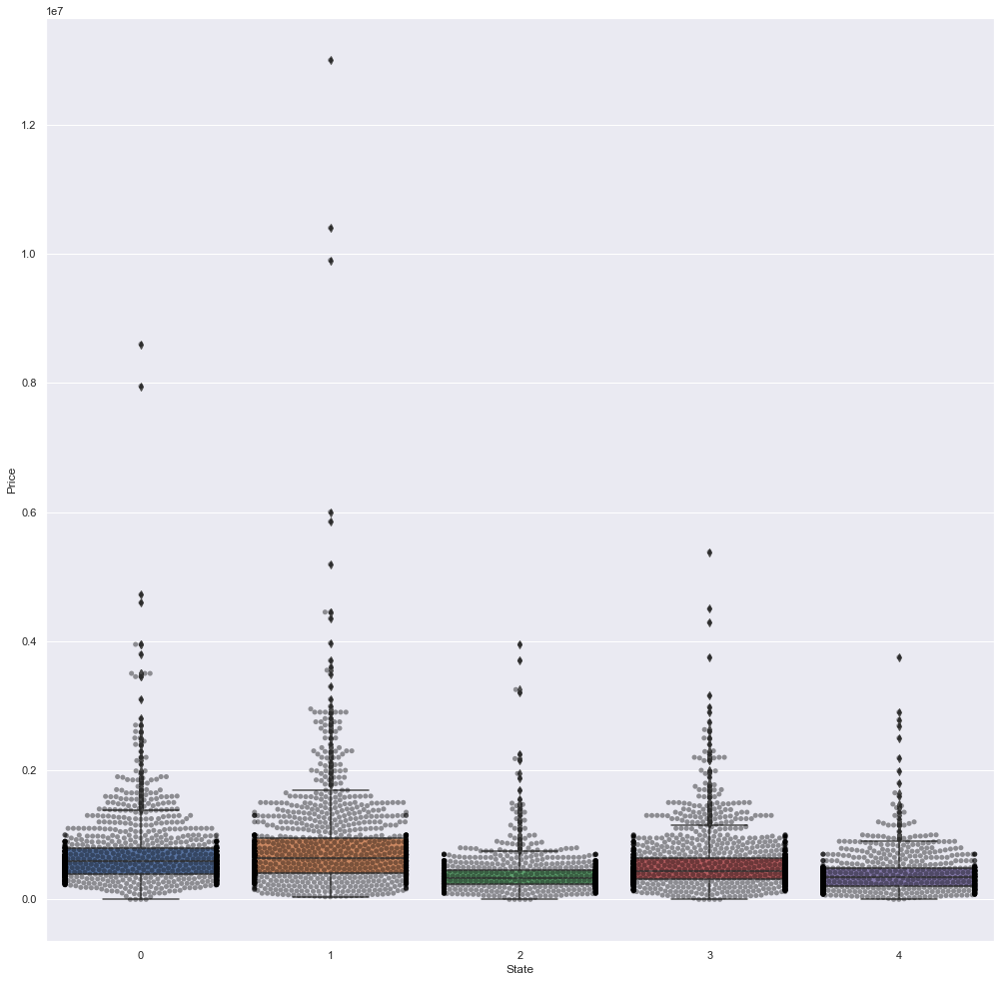

In [63]:
sns.boxplot(x='State',y='Price', fliersize=5, data=input_data)
sns.swarmplot(x='State',y='Price', data=input_data, color='black', alpha=0.4, linewidth=0.02);

In [64]:
# The purpose of this code is to filter out the outliers as displayed above because it will make the machine learning model easier to get better results than having them included
# in the test/training set
for x in ['Price']:
    q75,q25=np.percentile(input_data.loc[:,x],[75,25])
    intr_qr=q75-q25
    max=q75+(1.5*intr_qr)
    min=q25-(1.5*intr_qr)
    input_data.loc[input_data[x]<min,x]=np.nan
    input_data.loc[input_data[x]>max,x]=np.nan

In [65]:
input_data.isnull().sum().head()

Price           428
Type              0
Living_space      0
Lot               0
Usable_area       0
dtype: int64

In [66]:
input_data=input_data.dropna(axis=0)

In [67]:
input_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5380 entries, 0 to 855
Data columns (total 36 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Price                              5380 non-null   float64
 1   Type                               5380 non-null   float64
 2   Living_space                       5380 non-null   float64
 3   Lot                                5380 non-null   float64
 4   Usable_area                        5380 non-null   float64
 5   Rooms                              5380 non-null   float64
 6   Bedrooms                           5380 non-null   float64
 7   Bathrooms                          5380 non-null   float64
 8   Floors                             5380 non-null   float64
 9   Year_built                         5380 non-null   float64
 10  Condition                          5380 non-null   float64
 11  Heating                            5380 non-null   float6

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


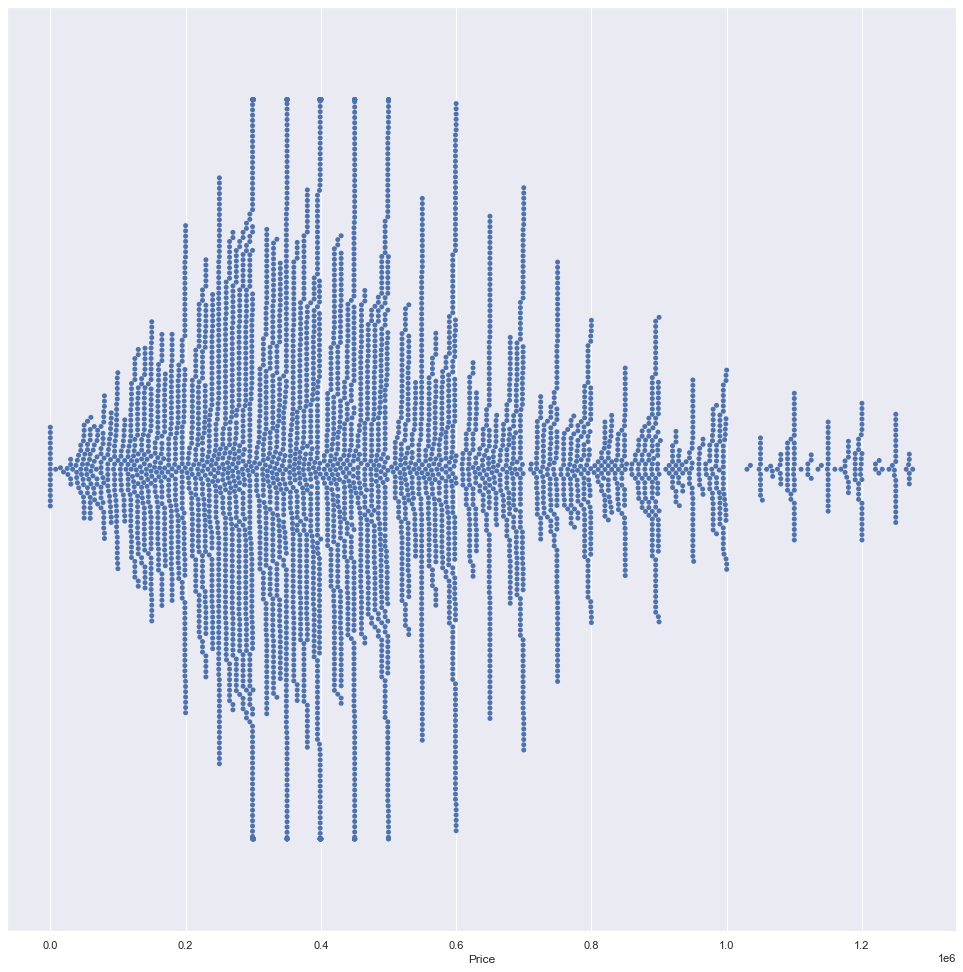

In [68]:
sns.swarmplot(input_data.Price);

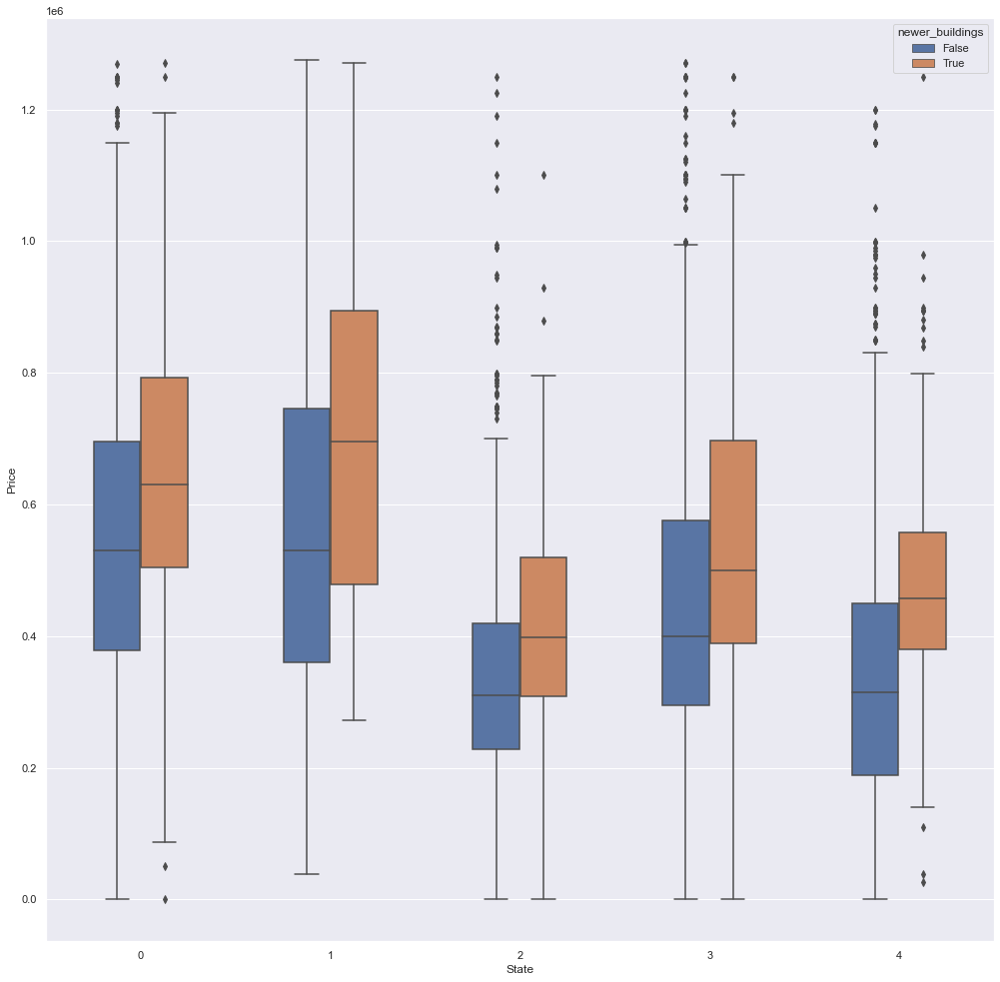

In [69]:
# This code displays how different house vary in price based on the year built
housepricesforbuldingyear=input_data
housepricesforbuldingyear['newer_buildings']=housepricesforbuldingyear.Year_built >2005
sns.boxplot(x='State',y='Price', hue='newer_buildings', width=0.5, fliersize=5, data=housepricesforbuldingyear);

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 8.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 9.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


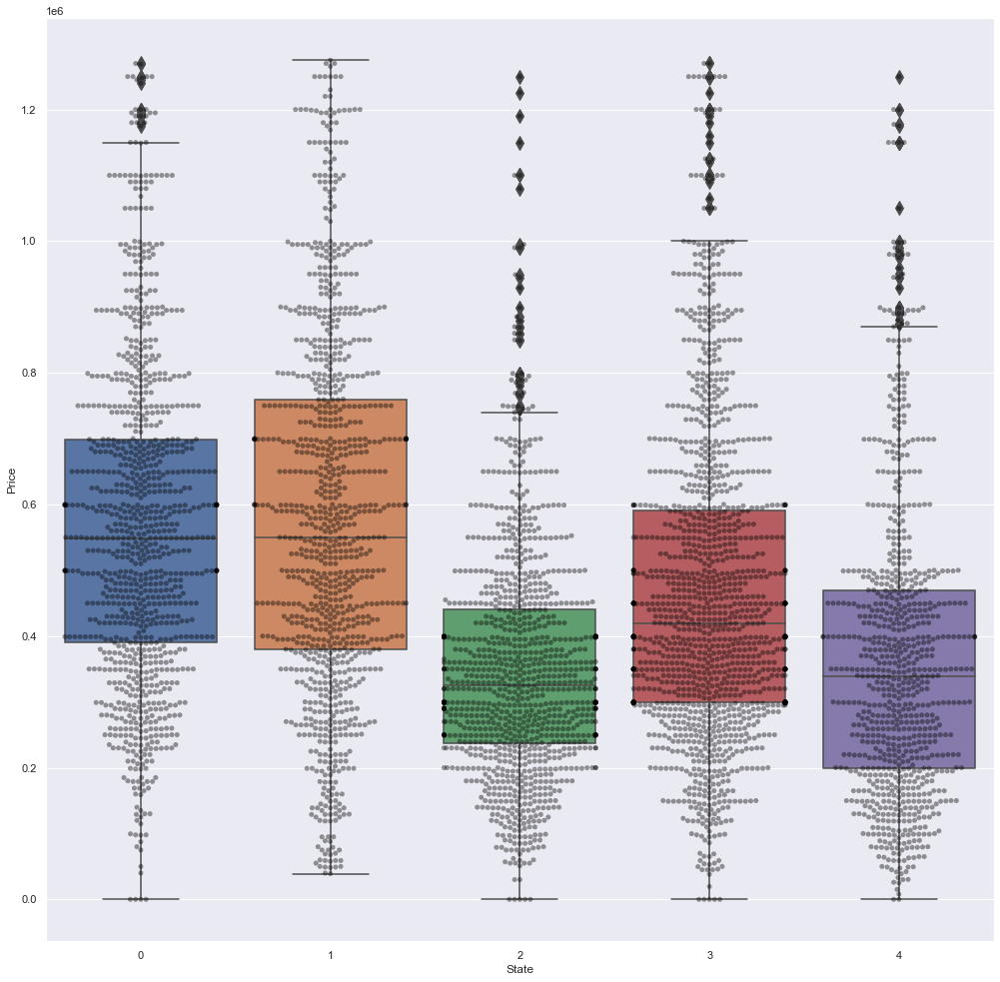

In [70]:
# This is a mix of a box plot and a swarmplot where the code displays how the data vary between the different states
sns.boxplot(x='State',y='Price', fliersize=10, data=input_data)
sns.swarmplot(x='State',y='Price', data=input_data, color='black', alpha=0.4);

As shown above do the different states vary where some of them are have a higer median than the other.
We also see that there are some price values at 0, which could be considered errors. 
These can be imputated as to not remove too many observations from the already relatively low amount of observations left in the dataset.

In [71]:
# As we can see, the dataset still contains 16 price values that are unreasonably low. 
input_data['Price'].sort_values().head(17)

844        0.0
277        0.0
73         0.0
77         0.0
401        0.0
554        0.0
845        0.0
846        0.0
1448       0.0
38         0.0
1390       0.0
288        0.0
908        0.0
777        1.0
125        1.0
846        1.0
139     7900.0
Name: Price, dtype: float64

In [72]:
# Replacing the 0 and 1 price values with NA for the imputer to recognize.
input_data['Price'] = input_data['Price'].replace([0.0,1.0], np.nan)

In [73]:
# Imputing the NA values for the low prices
imp_mean.fit(input_data)
input_data = pd.DataFrame(imp_mean.transform(input_data), columns=input_data.columns)

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\sklearn\impute\_iterative.py:701: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  ConvergenceWarning,


C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 7.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 9.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


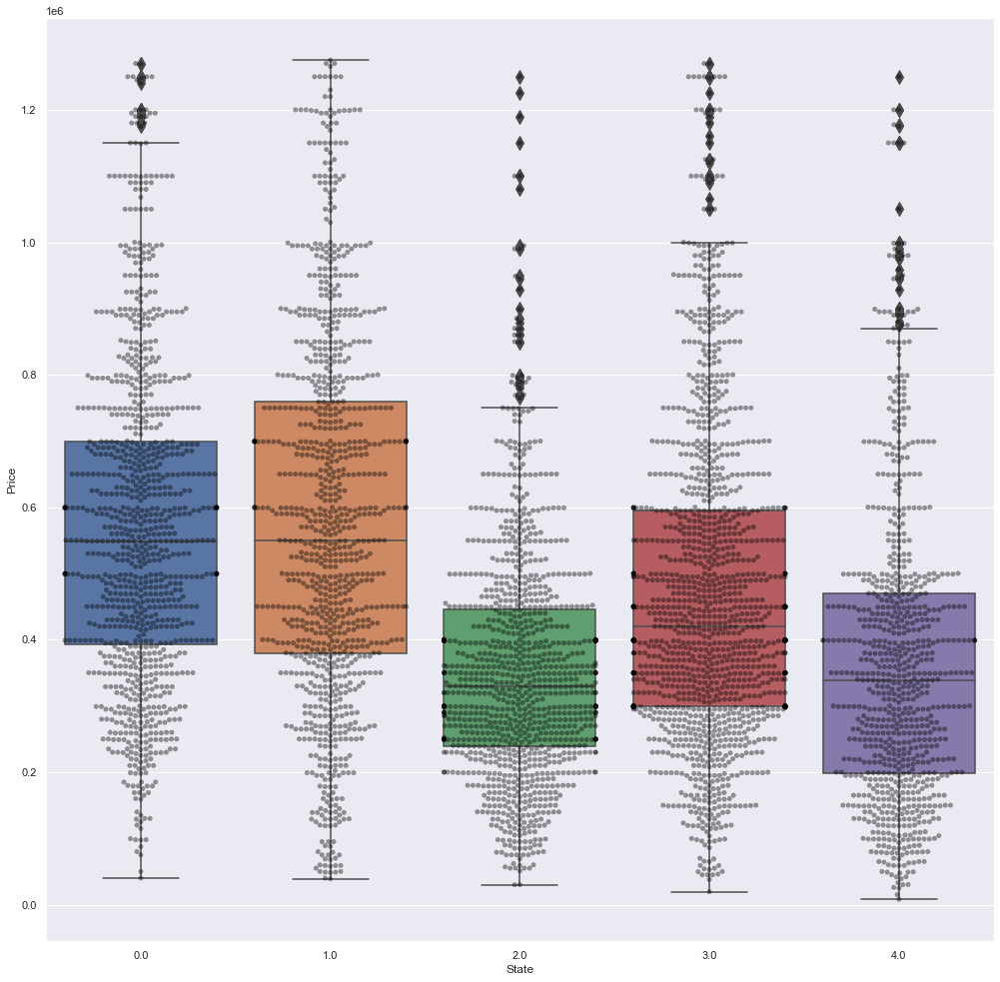

In [74]:
# Recreating the swarm+box plot 
sns.boxplot(x='State',y='Price', fliersize=10, data=input_data)
sns.swarmplot(x='State',y='Price', data=input_data, color='black', alpha=0.4);

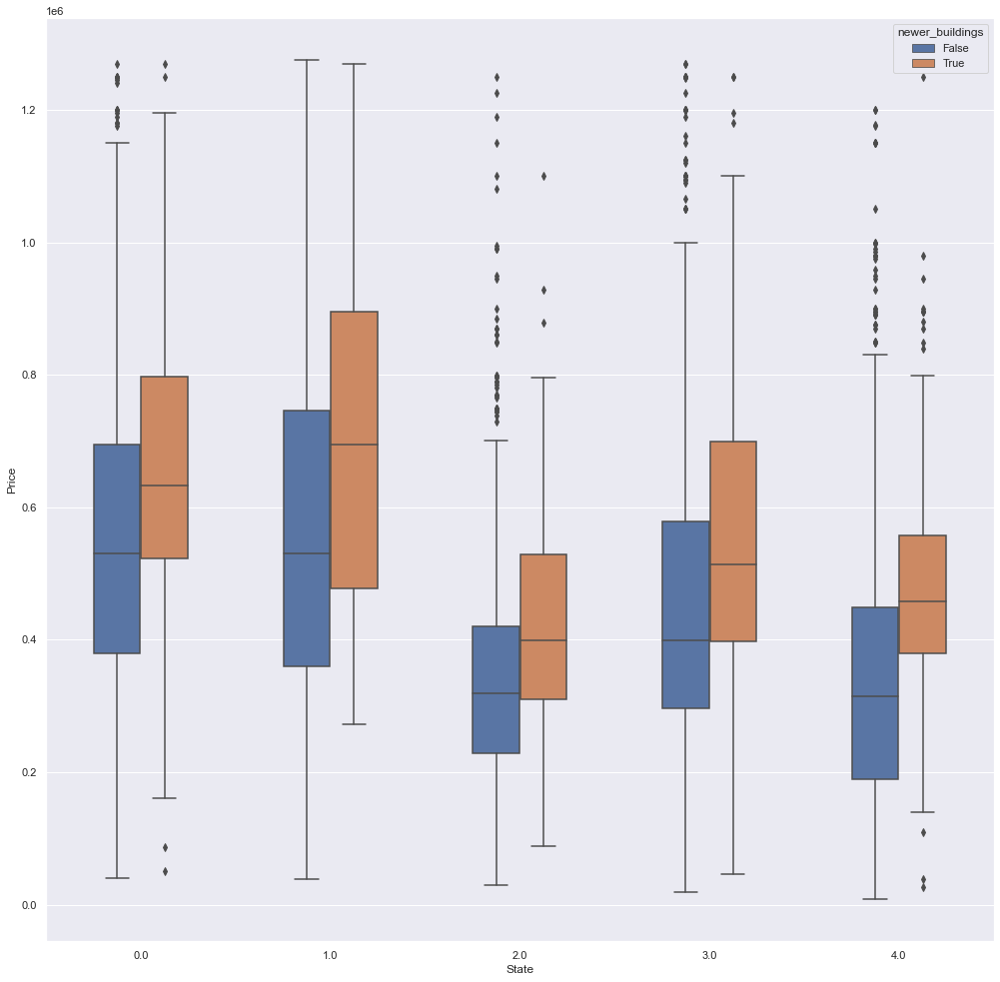

In [75]:
housepricesforbuldingyear=input_data
housepricesforbuldingyear['newer_buildings']=housepricesforbuldingyear.Year_built >2005
sns.boxplot(x='State',y='Price', hue='newer_buildings', width=0.5, fliersize=5, data=housepricesforbuldingyear);

In [76]:
input_data.to_csv('input_data.csv')

In [ ]:
# Reading the data for correlation testing.
Input_data = pd.read_csv("input_data.csv")
# Removing an added column from reading the data.
Input_data.drop('Unnamed: 0', axis=1, inplace=True)

<AxesSubplot:>

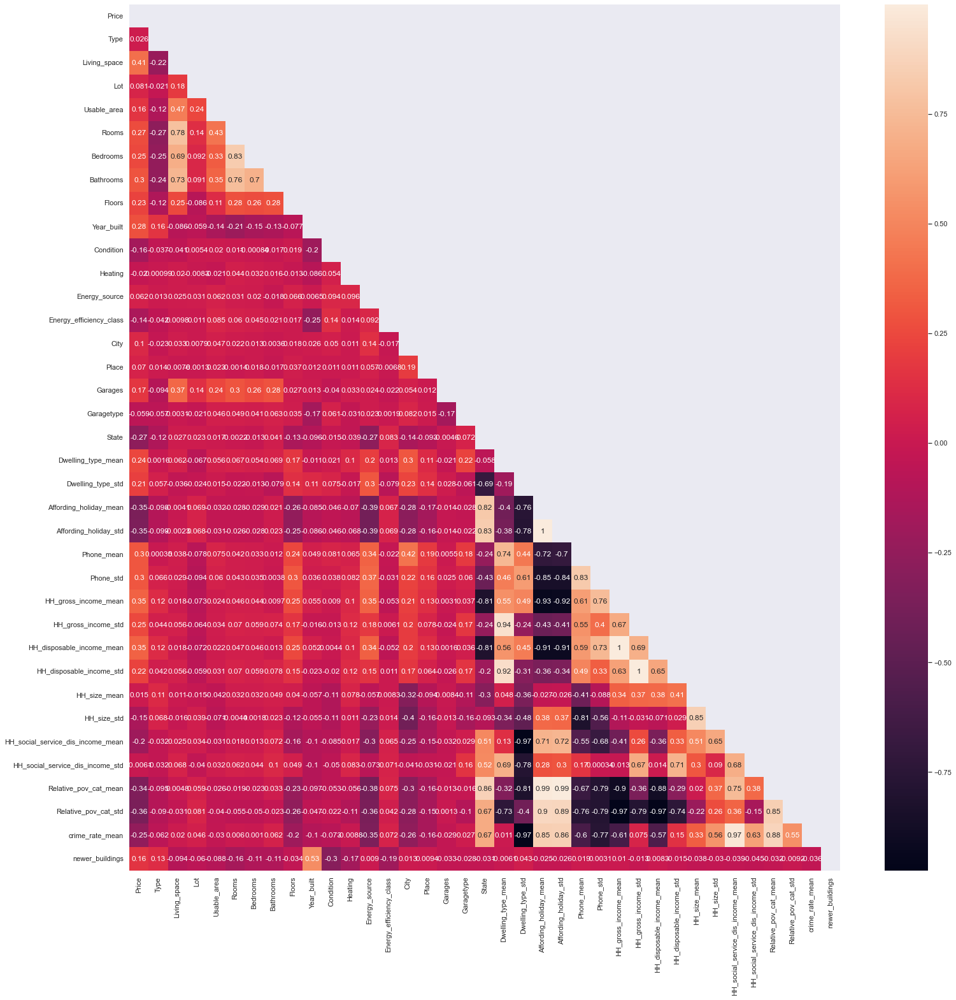

In [ ]:
# Displaying the Pearson correlation in a heatmap matrix. values close to or equal to 0 have little to no correlation to the respective variable.
sns.set(rc={"figure.figsize":(25,25)})
masking=np.triu(np.ones_like(Input_data.corr(),dtype=bool))
sns.heatmap(Input_data.corr(),annot=True, mask=masking)

In [ ]:
# Saving the Pearson correlation data to a dataframe
Input_data_corr = Input_data.corr()

In [ ]:
# saving one half of the data with the triangulation function np.triu, otherwise the whole dataset would consist of dublicated values.
Input_data_triu = np.triu(Input_data_corr, 1)

In [ ]:
# Showing the correlations in a dataframe.
Input_data_corr_df = pd.DataFrame(Input_data_triu, columns=Input_data_corr.columns, index=Input_data_corr.columns)
Input_data_corr_df

,Price,Type,Living_space,Lot,Usable_area,Rooms,Bedrooms,Bathrooms,Floors,Year_built,...,HH_disposable_income_mean,HH_disposable_income_std,HH_size_mean,HH_size_std,HH_social_service_dis_income_mean,HH_social_service_dis_income_std,Relative_pov_cat_mean,Relative_pov_cat_std,crime_rate_mean,newer_buildings
Price,0.0,0.026038,0.405045,0.081408,0.163777,0.266642,0.246157,0.295349,0.227775,0.282400,...,0.345542,0.224764,0.015123,-0.149200,-0.195904,-0.006097,-0.341566,-0.360207,-0.254205,0.161396
Type,0.0,0.000000,-0.223388,-0.021385,-0.122809,-0.270834,-0.245637,-0.243535,-0.120805,0.164975,...,0.118547,0.041550,0.111505,0.068099,-0.032127,-0.031609,-0.095240,-0.090465,-0.061718,0.126418
Living_space,0.0,0.000000,0.000000,0.184300,0.467294,0.782158,0.690613,0.727184,0.250859,-0.086303,...,0.018435,0.056053,0.010753,-0.016266,0.025191,0.068406,0.004841,-0.031204,0.020128,-0.093555
Lot,0.0,0.000000,0.000000,0.000000,0.241786,0.135683,0.092241,0.090702,-0.085563,-0.058539,...,-0.072454,-0.059398,-0.014731,0.039108,0.033837,-0.039705,0.058728,0.080632,0.045755,-0.060209
Usable_area,0.0,0.000000,0.000000,0.000000,0.000000,0.428594,0.328673,0.352393,0.114287,-0.144822,...,0.021571,0.030503,-0.041736,-0.070536,-0.031478,0.032203,-0.026216,-0.039609,-0.029817,-0.087870
Rooms,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.834081,0.760930,0.279942,-0.206230,...,0.046994,0.069580,0.032277,-0.004433,0.018013,0.061903,-0.018941,-0.054676,0.006008,-0.158957
Bedrooms,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.701967,0.263502,-0.154276,...,0.045691,0.058780,0.031875,0.001757,0.012770,0.044200,-0.022633,-0.049747,0.001013,-0.114836
Bathrooms,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.281072,-0.130019,...,0.012971,0.077524,0.048876,0.023208,0.071959,0.101481,0.032668,-0.023188,0.062353,-0.110988
Floors,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.076632,...,0.249545,0.148284,0.040488,-0.120960,-0.160329,0.048509,-0.231032,-0.261715,-0.199206,-0.033943
Year_built,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.051562,-0.023040,-0.056615,-0.054919,-0.099636,-0.102531,-0.097426,-0.047286,-0.101576,0.532748


In [ ]:
# Showing only the Pearson correlations for Price
Input_data_corr_df.iloc[1,:]

Price                                0.000000
Type                                 0.000000
Living_space                        -0.223388
Lot                                 -0.021385
Usable_area                         -0.122809
Rooms                               -0.270834
Bedrooms                            -0.245637
Bathrooms                           -0.243535
Floors                              -0.120805
Year_built                           0.164975
Condition                           -0.036895
Heating                              0.000986
Energy_source                        0.012784
Energy_efficiency_class             -0.042409
City                                -0.023488
Place                                0.013818
Garages                             -0.093989
Garagetype                          -0.057279
State                               -0.123258
Dwelling_type_mean                   0.001624
Dwelling_type_std                    0.056514
Affording_holiday_mean            

In [ ]:
# Replacing the 0's from the triangulation with NAN
Input_data_corr_df = Input_data_corr_df.replace(0, np.nan)

In [ ]:
# Saving the positive correlated variables that are over the threshold of 0.1 correlation
index_pos, cols_pos = np.where(Input_data_corr_df >= 0.1)
# Identifying the index and column positions to find the specific value sorted by the threshold for correlation amount
pos_correlation = [(Input_data_corr_df.index[i], Input_data_corr_df.columns[j], Input_data_corr_df.iloc[i,j]) for i, j in zip(index_pos, cols_pos)]

In [ ]:
# Saving the negative correlated variables that are under the threshold of -0.1 correlation
index_neg, cols_neg = np.where(Input_data_corr_df <= -0.1)
# Identifying the index and column positions to find the specific value sorted by the threshold for correlation amount
neg_correlation = [(Input_data_corr_df.index[i], Input_data_corr_df.columns[j], Input_data_corr_df.iloc[i,j]) for i, j in zip(index_neg, cols_neg)]

In [ ]:
#Transforming it into a pandas dataframe again with parameters and their correlation
pos_corr_df = pd.DataFrame(pos_correlation, columns = ["parameter_one","parameter_two","correlation"])
neg_corr_df = pd.DataFrame(neg_correlation, columns = ["parameter_one","parameter_two","correlation"])

In [ ]:
# Merging the two dataframes for positive and negative correlations to a single dataframe
Correlation_df = pd.concat([pos_corr_df, neg_corr_df])

In [ ]:
# Displaying variables Pearson correlation above/below the threshold of 0.1 to -0.1
Correlation_df

,parameter_one,parameter_two,correlation
0,Price,Living_space,0.405045
1,Price,Usable_area,0.163777
2,Price,Rooms,0.266642
3,Price,Bedrooms,0.246157
4,Price,Bathrooms,0.295349
...,...,...,...
128,HH_disposable_income_mean,crime_rate_mean,-0.568726
129,HH_disposable_income_std,Relative_pov_cat_mean,-0.290696
130,HH_disposable_income_std,Relative_pov_cat_std,-0.740172
131,HH_size_mean,Relative_pov_cat_std,-0.216361


In [ ]:
# Creating a dataframe with all correlations, regardless of threshold.
index, cols = np.where(Input_data_corr_df <= 1)

correlation_total = [(Input_data_corr_df.index[i], Input_data_corr_df.columns[j], Input_data_corr_df.iloc[i,j]) for i, j in zip(index, cols)]

In [ ]:
# Creating a new dataframe from the correlations and parameters
total_corr_df = pd.DataFrame(correlation_total, columns = ["parameter_one","parameter_two","correlation"])

In [ ]:
# Adding a bool condition for correlation based on
total_corr_df['Do_correlate?'] = 'no'
total_corr_df.loc[total_corr_df['correlation'] > 0.05,'Do_correlate?'] = 'yes'
total_corr_df.loc[total_corr_df['correlation'] < -0.05,'Do_correlate?'] = 'yes'

In [ ]:
# Displaying the change
total_corr_df

,parameter_one,parameter_two,correlation,Do_correlate?
0,Price,Type,0.026038,no
1,Price,Living_space,0.405045,yes
2,Price,Lot,0.081408,yes
3,Price,Usable_area,0.163777,yes
4,Price,Rooms,0.266642,yes
...,...,...,...,...
661,Relative_pov_cat_mean,crime_rate_mean,0.877348,yes
662,Relative_pov_cat_mean,newer_buildings,-0.031875,no
663,Relative_pov_cat_std,crime_rate_mean,0.545227,yes
664,Relative_pov_cat_std,newer_buildings,-0.009170,no


In [ ]:
# Keeping only correlations with price
Pearson_price_corr = total_corr_df.loc[total_corr_df['parameter_one'] == 'Price']

In [ ]:
# Sorting by highest correlation down towards negative.
Pearson_price_corr.sort_values(by=['correlation'], ascending=False, inplace=True)

C:\Users\Krisser\anaconda3\envs\myenv\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


In [ ]:
# Resetting index
Pearson_price_corr.reset_index(drop=True,inplace=True)

In [ ]:
# Exporting the dataframe as a table with gradient on correlation amount.
df_styled = Pearson_price_corr.style.background_gradient()
dfi.export(df_styled,"pearson_corr_table.png")

ANOVA START

In [ ]:
# Defining the ols model with variable correlation to dependent variable 'Price'
model_ols = ols('Price ~ Type + Living_space + Lot + Usable_area + Rooms + Bedrooms + Bathrooms + Floors + Year_built + Condition + Heating + Energy_source + Energy_efficiency_class + City + Place + Garages + Garagetype + State + Dwelling_type_mean + Dwelling_type_std + Affording_holiday_mean + Affording_holiday_std + Phone_mean + Phone_std + HH_gross_income_mean + HH_gross_income_std + HH_disposable_income_mean + HH_disposable_income_std + HH_size_mean + HH_size_std + HH_social_service_dis_income_mean + HH_social_service_dis_income_std + Relative_pov_cat_mean + Relative_pov_cat_std + crime_rate_mean',
            data=Input_data).fit()


In [ ]:
# Applying anova to the ols function. 
anova_results = sm.stats.anova_lm(model_ols, typ=2)


In [ ]:
# Displaying the anova results.
anova_results

,sum_sq,df,F,PR(>F)
Type,6.919001e+11,1.0,18.623173,1.621408e-05
Living_space,1.708860e+13,1.0,459.956605,5.829819e-98
Lot,1.209921e+12,1.0,32.566214,1.213827e-08
Usable_area,1.481813e+10,1.0,0.398845,5.277134e-01
Rooms,3.258080e+11,1.0,8.769445,3.076629e-03
Bedrooms,3.788201e+10,1.0,1.019632,3.126520e-01
Bathrooms,9.218861e+11,1.0,24.813473,6.513741e-07
Floors,1.363644e+12,1.0,36.703824,1.468835e-09
Year_built,1.651329e+13,1.0,444.471497,7.470000e-95
Condition,3.111570e+12,1.0,83.750970,7.818699e-20


In [ ]:
# Creating the same bool variable column for the 5% significance level.
anova_table_res = anova_results
anova_table_res['Do_correlate?'] = 'no'
anova_table_res.loc[anova_table_res['PR(>F)'] <= 0.05,'Do_correlate?'] = 'yes'

In [ ]:
# Sorting for lowest to greatest correlation
anova_table_res.sort_values(by=['PR(>F)'], ascending=False, inplace=True)

In [ ]:
# Dropping the columns for the table output that aren't used for classifying significance level.
anova_table_res = anova_table_res.drop(['df','F','sum_sq'], axis=1)

In [ ]:
# Exporting the dataframe as a table with gradient on correlation amount.
df_styled = anova_table_res.style.background_gradient()
dfi.export(df_styled,"anova_corr_table.png")

In [ ]:
# Showing the anova results sorted for high correlation
anova_results["PR(>F)"].sort_values()

HH_size_mean                         2.429710e-151
crime_rate_mean                      6.564871e-117
Living_space                          5.829819e-98
Year_built                            7.470000e-95
HH_disposable_income_mean             1.861176e-52
Relative_pov_cat_mean                 2.124497e-50
Affording_holiday_std                 1.507554e-48
Affording_holiday_mean                9.112464e-48
Relative_pov_cat_std                  4.923831e-47
State                                 1.252415e-44
Phone_mean                            3.389130e-44
Dwelling_type_std                     1.677892e-42
HH_gross_income_mean                  3.829186e-41
HH_disposable_income_std              9.586705e-41
Dwelling_type_mean                    9.876171e-41
Phone_std                             1.089573e-40
HH_gross_income_std                   1.102984e-24
Condition                             7.818699e-20
Energy_source                         6.957953e-12
HH_social_service_dis_income_me

In [ ]:
# Selecting only the significant variables
anova_results = anova_results [anova_results['PR(>F)'] > 0.05].index

As the ANOVA model shows, some variables are not highly correlated with the dependend variable Price on 5% significant level. 
To give the machine learning models the best probability at succeeding, removing the variables which are higher than the significans level should provide less noise and a better outcome. 


In [ ]:
# Removing variables which are not significant in correlation.
Input_data_upd = Input_data.drop(columns=anova_results)

In [ ]:
# Showing the variables which has been removed.
print(np.setdiff1d(Input_data.columns, Input_data_upd.columns))

['Bedrooms' 'Garages' 'Place' 'Usable_area']


In [ ]:
# Exporting the data with anova correlation filtered variables
Input_data_upd.to_csv('input_data_upd.csv')

In [ ]:
# Importing the full data
Input_data_house = pd.read_csv("input_data.csv")
# Removing an added column
Input_data_house.drop('Unnamed: 0', axis=1, inplace=True)

# Sorting data as to only keep housing price data
x_house = Input_data_house.iloc[:,1:19]
y_house = Input_data_house.iloc[:,0]

# Creating test/train splits
x_house_train, x_house_test, y_house_train, y_house_test = train_test_split(x_house, y_house, test_size = 0.2, random_state = 13)

In [ ]:
Input_data = pd.read_csv("input_data.csv")
Input_data.drop('Unnamed: 0', axis=1, inplace=True)

# Keeping all variables in the dataset for the X/Y's
x = Input_data.iloc[:,1:]
y = Input_data.iloc[:,0]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 13)

In [ ]:
input_data_anova = pd.read_csv("input_data_upd.csv")
input_data_anova.drop('Unnamed: 0', axis=1, inplace=True)

# Keeping all variables from the data after being updated through anova correlations.
x_anova = input_data_anova.iloc[:,1:]
y_anova = input_data_anova.iloc[:,0]

x_train_anova, x_test_anova, y_train_anova, y_test_anova = train_test_split(x_anova, y_anova, test_size = 0.2, random_state = 13)

In [ ]:
#Defining scalers
x_scaler = MinMaxScaler(feature_range=(0, 1))
y_scaler = MinMaxScaler(feature_range=(0, 1))


In [ ]:
# Applying a seperate scaler for each dataset instance, this is to be able to reverse the scaling for showing results later.
x_house_train_scaled = x_scaler.fit_transform(x_house_train)
y_house_train_scaled = y_scaler.fit_transform(y_house_train.values.reshape(-1,1))

x_house_test_scaled = x_scaler.transform(x_house_test)
y_house_test_scaled = y_scaler.transform(y_house_test.values.reshape(-1,1))

x_train_scaled = x_scaler.fit_transform(x_train)
y_train_scaled = y_scaler.fit_transform(y_train.values.reshape(-1,1))

x_test_scaled = x_scaler.transform(x_test)
y_test_scaled = y_scaler.transform(y_test.values.reshape(-1,1))

x_train_anova_scaled = x_scaler.fit_transform(x_train_anova)
y_train_anova_scaled = y_scaler.fit_transform(y_train_anova.values.reshape(-1,1))

x_test_anova_scaled = x_scaler.transform(x_test_anova)
y_test_anova_scaled = y_scaler.transform(y_test_anova.values.reshape(-1,1))

Supervised machine learning

In [ ]:
#Defining the SML models for each dataset iteration
RFG_model_house = RandomForestRegressor()
OLS_model_house = LinearRegression()

RFG_model_combined = RandomForestRegressor()
OLS_model_combined = LinearRegression()

RFG_model_anova = RandomForestRegressor()
OLS_model_anova = LinearRegression()

In [ ]:
#Fitting OLS and RFR models to the split data
OLS_model_house.fit(x_house_train_scaled, y_house_train_scaled)
RFG_model_house.fit(x_house_train_scaled, y_house_train_scaled)

OLS_model_combined.fit(x_train_scaled, y_train_scaled)
RFG_model_combined.fit(x_train_scaled, y_train_scaled)

OLS_model_anova.fit(x_train_anova_scaled, y_train_anova_scaled)
RFG_model_anova.fit(x_train_anova_scaled, y_train_anova_scaled)

RandomForestRegressor()

In [ ]:
#Finding the R^2 score of the models
OLS_score_house = OLS_model_house.score(x_house_test_scaled, y_house_test_scaled)
RFG_score_house = RFG_model_house.score(x_house_test_scaled, y_house_test_scaled)


OLS_score_combined = OLS_model_combined.score(x_test_scaled, y_test_scaled)
RFG_score_combined = RFG_model_combined.score(x_test_scaled, y_test_scaled)

OLS_score_anova = OLS_model_anova.score(x_test_anova_scaled, y_test_anova_scaled)
RFG_score_anova = RFG_model_anova.score(x_test_anova_scaled, y_test_anova_scaled)

# Displaying the R2 score as a dataframe for all models
r2_sml_data = {"House":[OLS_score_house, RFG_score_house],
    "Combined":[OLS_score_combined, RFG_score_combined],
    "Anova":[OLS_score_anova, RFG_score_anova]}

SML_r2_DF = pd.DataFrame(r2_sml_data, index=["OLS", "RFR"])

SML_r2_DF
#print("Housing data: The OLS model's R^2 score is ", OLS_score_house, "And the RFR models R^2 score is ", RFG_score_house)
#print("Combined data: The OLS model's R^2 score is ", OLS_score_combined, "And the RFR models R^2 score is ", RFG_score_combined)
#print("Filtered anova data: The OLS model's R^2 score is ", OLS_score_anova, "And the RFR models R^2 score is ", RFG_score_anova)

,House,Combined,Anova
OLS,0.362646,0.415778,0.416261
RFR,0.475059,0.478989,0.476774


In [ ]:
#Regarding the R2 score for the models, the RFR models seem to perform slightly better overall than the OLS models
#Though this score is still very low for all models on all data iterations.

In [ ]:
#Saving the predictions of all models
y_prediction_OLS_house = OLS_model_house.predict(x_house_test_scaled)
y_prediction_RFG_house = RFG_model_house.predict(x_house_test_scaled)

y_prediction_OLS_combined = OLS_model_combined.predict(x_test_scaled)
y_prediction_RFG_combined = RFG_model_combined.predict(x_test_scaled)

y_prediction_OLS_anova = OLS_model_anova.predict(x_test_anova_scaled)
y_prediction_RFG_anova = RFG_model_anova.predict(x_test_anova_scaled)

In [ ]:
# Creating scaled MAE measures based on all model tests and displaying them in a matrix.
MAE_OLS_house = mean_absolute_error(y_house_test_scaled, y_prediction_OLS_house)
MAE_RFG_house = mean_absolute_error(y_house_test_scaled, y_prediction_RFG_house)

MAE_OLS_combined = mean_absolute_error(y_test_scaled, y_prediction_OLS_combined)
MAE_RFG_combined = mean_absolute_error(y_test_scaled, y_prediction_RFG_combined)

MAE_OLS_anova = mean_absolute_error(y_test_anova_scaled, y_prediction_OLS_anova)
MAE_RFG_anova = mean_absolute_error(y_test_anova_scaled, y_prediction_RFG_anova)

MAE_dataframe_data = {"House":[MAE_OLS_house, MAE_RFG_house],
    "Combined":[MAE_OLS_combined, MAE_RFG_combined],
    "Anova":[MAE_OLS_anova, MAE_RFG_anova]}

SML_MAE_DF = pd.DataFrame(MAE_dataframe_data, index=["OLS", "RFR"])
SML_MAE_DF

,House,Combined,Anova
OLS,0.119415,0.111982,0.111932
RFR,0.105192,0.104593,0.105283


In [ ]:
# Creating scaled MSE measures based on all model tests and displaying them in a matrix.
MSE_OLS_house = mean_squared_error(y_house_test_scaled, y_prediction_OLS_house)
MSE_RFG_house = mean_squared_error(y_house_test_scaled, y_prediction_RFG_house)

MSE_OLS_combined = mean_squared_error(y_test_scaled, y_prediction_OLS_combined)
MSE_RFG_combined = mean_squared_error(y_test_scaled, y_prediction_RFG_combined)

MSE_OLS_anova = mean_squared_error(y_test_anova_scaled, y_prediction_OLS_anova)
MSE_RFG_anova = mean_squared_error(y_test_anova_scaled, y_prediction_RFG_anova)

MSE_dataframe_data = {"House":[MSE_OLS_house, MSE_RFG_house],
    "Combined":[MSE_OLS_combined, MSE_RFG_combined],
    "Anova":[MSE_OLS_anova, MSE_RFG_anova]}

SML_MSE_DF = pd.DataFrame(MSE_dataframe_data, index=["OLS", "RFR"])
SML_MSE_DF

,House,Combined,Anova
OLS,0.024147,0.022134,0.022116
RFR,0.019888,0.019739,0.019823


In [ ]:
# Inverse transforming the prediction values of all model tests
y_prediction_OLS_house_unscaled = y_scaler.inverse_transform(y_prediction_OLS_house)
y_prediction_RFG_house_unscaled = y_scaler.inverse_transform(y_prediction_RFG_house.reshape(1, -1))

y_prediction_OLS_combined_unscaled = y_scaler.inverse_transform(y_prediction_OLS_combined)
y_prediction_RFG_combined_unscaled = y_scaler.inverse_transform(y_prediction_RFG_combined.reshape(1, -1))

y_prediction_OLS_anova_unscaled = y_scaler.inverse_transform(y_prediction_OLS_anova)
y_prediction_RFG_anova_unscaled = y_scaler.inverse_transform(y_prediction_RFG_anova.reshape(1, -1))


In [ ]:
# When inverse transformed, the data is transformed to a numpy array, therefore it is necessary to flatten the data to compare in a graph. 
y_prediction_OLS_house_unscaled = list(y_prediction_OLS_house_unscaled.flatten())
y_prediction_RFG_house_unscaled = list(y_prediction_RFG_house_unscaled.flatten())

y_prediction_OLS_combined_unscaled = list(y_prediction_OLS_combined_unscaled.flatten())
y_prediction_RFG_combined_unscaled = list(y_prediction_RFG_combined_unscaled.flatten())

y_prediction_OLS_anova_unscaled = list(y_prediction_OLS_anova_unscaled.flatten())
y_prediction_RFG_anova_unscaled = list(y_prediction_RFG_anova_unscaled.flatten())

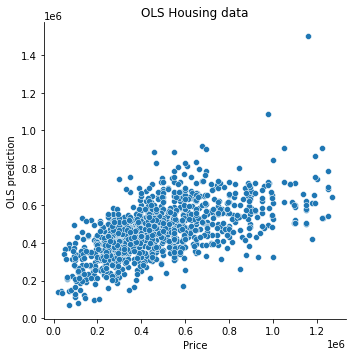

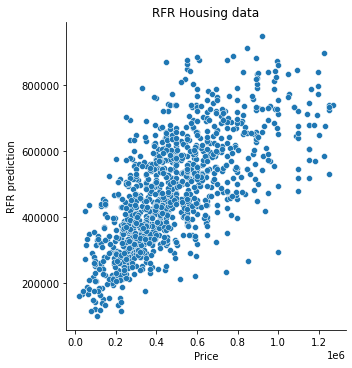

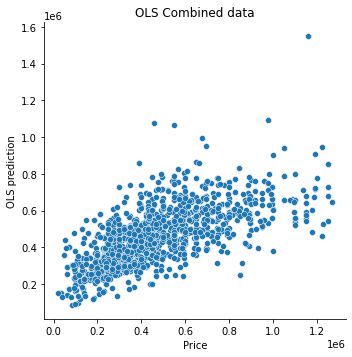

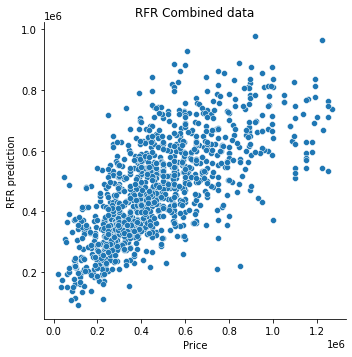

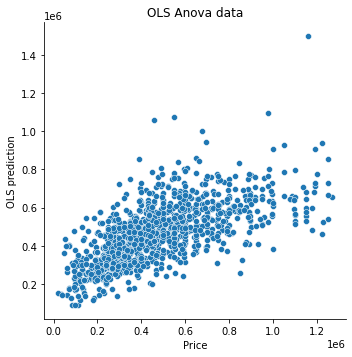

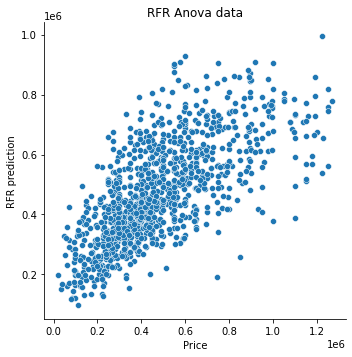

In [ ]:
#quick overview of how the regression models performed plotted for test set and model predictions. 

sns.relplot(y_house_test, y_prediction_OLS_house_unscaled).set(xlabel="Price", ylabel= "OLS prediction", title="OLS Housing data")
sns.relplot(y_house_test, y_prediction_RFG_house_unscaled).set(xlabel="Price", ylabel= "RFR prediction", title="RFR Housing data")

sns.relplot(y_test, y_prediction_OLS_combined_unscaled).set(xlabel="Price", ylabel= "OLS prediction", title="OLS Combined data")
sns.relplot(y_test, y_prediction_RFG_combined_unscaled).set(xlabel="Price", ylabel= "RFR prediction", title="RFR Combined data")

sns.relplot(y_test_anova, y_prediction_OLS_anova_unscaled).set(xlabel="Price", ylabel= "OLS prediction", title="OLS Anova data")
sns.relplot(y_test_anova, y_prediction_RFG_anova_unscaled).set(xlabel="Price", ylabel= "RFR prediction", title="RFR Anova data")


In [ ]:
#As the R2 score and the prediction plots show, the performance of the simple SML models are quite poor. Therefore, a neural network model can perhaps be better at predicting this problem. 
#It should give the possibility to better understand and predict on the complexity of the variable composition.

Simple Dense model - Housing data


In [ ]:
# Creating scalers for x and y variables.
x_house_train = x_scaler.fit_transform(x_house_train)
# The reason we reshape the y-train/test is to make it 2 dimensional, which is necessary when we are to inverse the scaling.
y_house_train = y_scaler.fit_transform(y_house_train.values.reshape(-1,1))

x_house_test = x_scaler.transform(x_house_test)
y_house_test = y_scaler.transform(y_house_test.values.reshape(-1,1))


In [ ]:
# Defining the input size by the column amount of the dataset.
input_size_house = len(x_house.columns)

In [ ]:
# Creating the sequential neural network with dense layers, relu activations, Adam as optimizer, mean absolute error as loss and for comparison, mean squared error as metric. 
model_house = Sequential()
# Utilizing the basic dense layers, as these are commonly used in regression problems for neural networks.
# Using the relu activation function as this is sensible to minor changes in input and changes output to 0 and scales up as a linear function.
model_house.add(Dense(35, activation = "relu", input_shape=(input_size_house,)))
model_house.add(Dense(10, 'relu'))
# Ending the model on a dense layer with 1 neuron, doing this because we have a single value as an output goal.
model_house.add(Dense(1))
# As Mean squared error is a common loss function for regression problems, we use it as a metric,
# Though Mean absolute error can be better when handling data with a lot of outliers, and as the housing prices have a large variance, we want to add MAE as the primary loss function
# https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/
# Optimizer 'adam' is usually used in neural networks as it is very quick and efficient at finding the local minimum.
model_house.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model_house.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 35)                665       
_________________________________________________________________
dense_1 (Dense)              (None, 10)                360       
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 11        
Total params: 1,036
Trainable params: 1,036
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Fitting the model to the data on 100 epochs with a single batch on a 10% validation split - This will be default setting for all remaining models.
history_house = model_house.fit(x_house_train, y_house_train, epochs=100, batch_size= 1, validation_split=0.1)


Epoch 1/100
3873/3873 [==============================] - 1s 386us/step - loss: 0.1317 - mean_squared_error: 0.0309 - val_loss: 0.1361 - val_mean_squared_error: 0.0306
Epoch 2/100
3873/3873 [==============================] - 1s 362us/step - loss: 0.1234 - mean_squared_error: 0.0278 - val_loss: 0.1324 - val_mean_squared_error: 0.0302
Epoch 3/100
3873/3873 [==============================] - 1s 349us/step - loss: 0.1212 - mean_squared_error: 0.0268 - val_loss: 0.1289 - val_mean_squared_error: 0.0300
Epoch 4/100
3873/3873 [==============================] - 1s 361us/step - loss: 0.1203 - mean_squared_error: 0.0264 - val_loss: 0.1319 - val_mean_squared_error: 0.0294
Epoch 5/100
3873/3873 [==============================] - 1s 355us/step - loss: 0.1197 - mean_squared_error: 0.0263 - val_loss: 0.1279 - val_mean_squared_error: 0.0294
Epoch 6/100
3873/3873 [==============================] - 1s 364us/step - loss: 0.1189 - mean_squared_error: 0.0260 - val_loss: 0.1253 - val_mean_squared_error: 0.027

In [ ]:
# Saving evaluation of the models performance on the testset.
model_evaluation_house = model_house.evaluate(x_house_test, y_house_test)

34/34 [==============================] - 0s 631us/step - loss: 0.1166 - mean_squared_error: 0.0254


Text(0, 0.5, 'Loss')

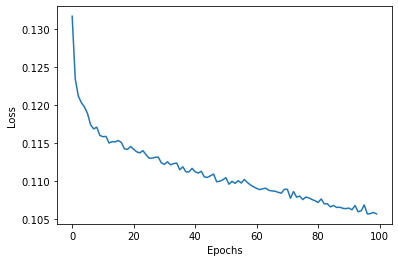

In [ ]:
# Displaying the 'loss', or in this case, mean absolute error reduction over epochs.
loss_per_epoch_house = history_house.history['loss']
plt.plot(range(len(loss_per_epoch_house)),loss_per_epoch_house);
plt.xlabel("Epochs")
plt.ylabel("Loss")

Text(0, 0.5, 'Validation loss')

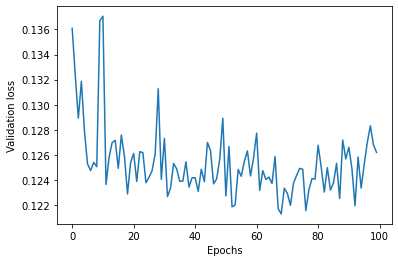

In [ ]:
# Displaying the loss again, this time for our validation set
loss_per_epoch_house = history_house.history['val_loss']
plt.plot(range(len(loss_per_epoch_house)),loss_per_epoch_house);
plt.xlabel("Epochs")
plt.ylabel("Validation loss")

Text(0, 0.5, 'Mean squared error')

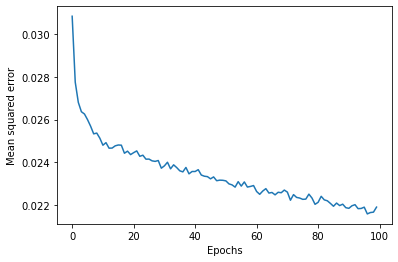

In [ ]:
# Displaying the additional model metric, in this case, mean squared error reduction over epochs.
loss_per_epoch_house = history_house.history['mean_squared_error']
plt.plot(range(len(loss_per_epoch_house)),loss_per_epoch_house);
plt.xlabel("Epochs")
plt.ylabel("Mean squared error")

Text(0, 0.5, 'Validation mean squared error')

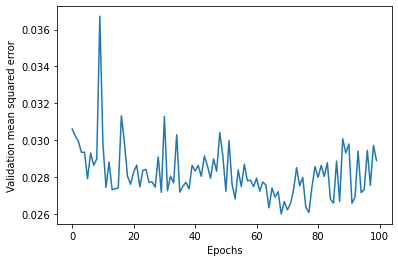

In [ ]:
# Displaying the mean squared error again, this time for the validation set
loss_per_epoch_house = history_house.history['val_mean_squared_error']
plt.plot(range(len(loss_per_epoch_house)),loss_per_epoch_house);
plt.xlabel("Epochs")
plt.ylabel("Validation mean squared error")

In [ ]:
# Displaying a dataframe consisting of the y_test results as compared the model predictions. 
# We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model_house.predict(x_house_test)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_house_test)


In [ ]:
#We flatten the result to make them fit into a dataframe.
results_house = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results_house = results_house.round(decimals=0)
results_house

,y_true,y_pred
0,695000.0,252351.0
1,738000.0,732291.0
2,394900.0,488796.0
3,395000.0,312473.0
4,69000.0,401555.0
...,...,...
1071,598000.0,418320.0
1072,250000.0,495260.0
1073,499900.0,435212.0
1074,259000.0,491794.0


Text(0, 0.5, 'Price')

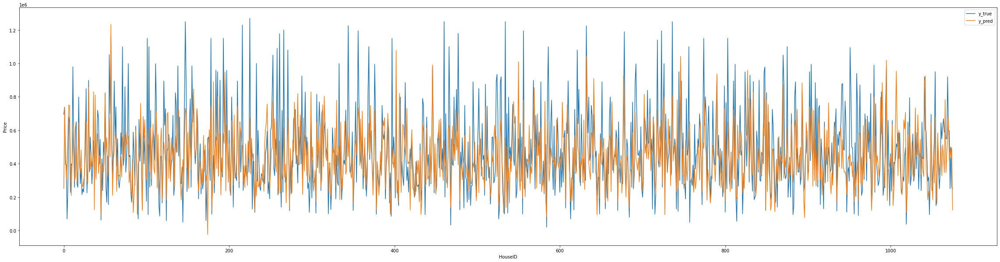

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results_house.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

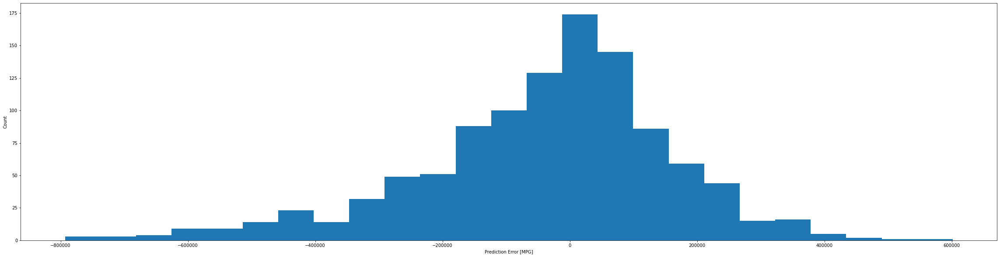

In [ ]:
# Showing error distribution of the model
error = results_house['y_pred'] - results_house['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Simple Dense model - Combined data

In [ ]:
x_train = x_scaler.fit_transform(x_train)
# The reason we reshape the y-train/test is to make it 2 dimensional, which is necessary when we are to inverse the scaling.
y_train = y_scaler.fit_transform(y_train.values.reshape(-1,1))

x_test = x_scaler.transform(x_test)
y_test = y_scaler.transform(y_test.values.reshape(-1,1))

In [ ]:
input_size = len(x.columns)

In [ ]:
model = Sequential()
model.add(Dense(35, activation = "relu", input_shape=(input_size,)))
model.add(Dense(10, 'relu'))
model.add(Dense(1))
model.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 35)                1295      
_________________________________________________________________
dense_4 (Dense)              (None, 10)                360       
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 11        
Total params: 1,666
Trainable params: 1,666
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = model.fit(x_train, y_train, epochs=100, batch_size= 1, validation_split=0.1)


Epoch 1/100
3873/3873 [==============================] - 1s 381us/step - loss: 0.1359 - mean_squared_error: 0.0323 - val_loss: 0.1237 - val_mean_squared_error: 0.0276
Epoch 2/100
3873/3873 [==============================] - 1s 376us/step - loss: 0.1248 - mean_squared_error: 0.0276 - val_loss: 0.1270 - val_mean_squared_error: 0.0285
Epoch 3/100
3873/3873 [==============================] - 1s 365us/step - loss: 0.1223 - mean_squared_error: 0.0268 - val_loss: 0.1225 - val_mean_squared_error: 0.0264
Epoch 4/100
3873/3873 [==============================] - 1s 367us/step - loss: 0.1187 - mean_squared_error: 0.0257 - val_loss: 0.1213 - val_mean_squared_error: 0.0264
Epoch 5/100
3873/3873 [==============================] - 2s 391us/step - loss: 0.1180 - mean_squared_error: 0.0255 - val_loss: 0.1233 - val_mean_squared_error: 0.0266
Epoch 6/100
3873/3873 [==============================] - 1s 381us/step - loss: 0.1173 - mean_squared_error: 0.0250 - val_loss: 0.1233 - val_mean_squared_error: 0.026

In [ ]:
model_evaluation = model.evaluate(x_test, y_test)

34/34 [==============================] - 0s 580us/step - loss: 0.1096 - mean_squared_error: 0.0223


Text(0, 0.5, 'Loss')

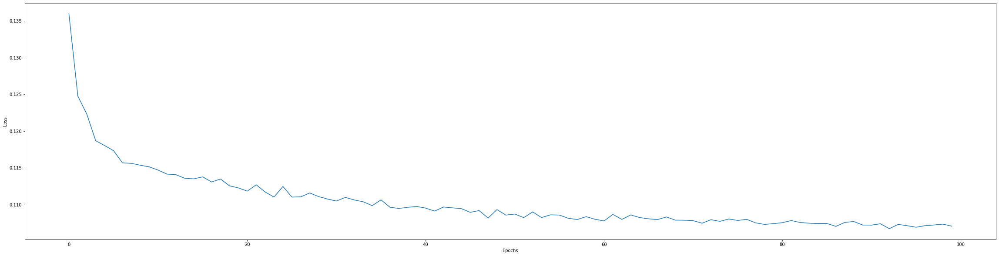

In [ ]:
# Displaying the 'loss', or in this case, mean absolute error reduction over epochs.
loss_per_epoch = history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch);
plt.xlabel("Epochs")
plt.ylabel("Loss")

Text(0, 0.5, 'Validation loss')

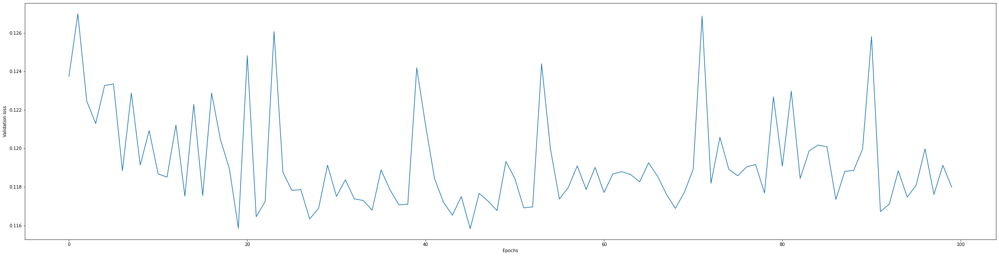

In [ ]:
#Displaying the loss again, this time for our validation set
loss_per_epoch = history.history['val_loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch);
plt.xlabel("Epochs")
plt.ylabel("Validation loss")

Text(0, 0.5, 'Mean squared error')

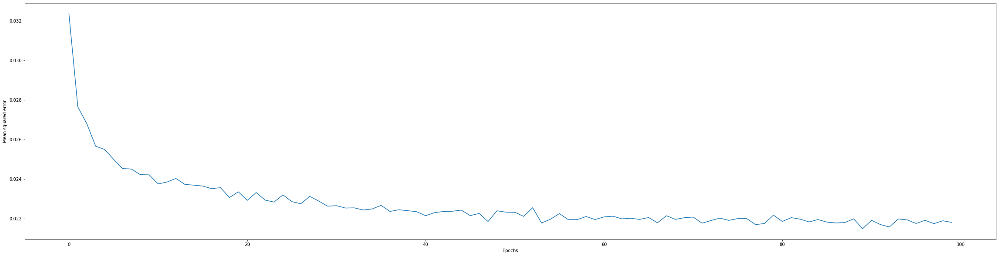

In [ ]:
# Displaying the additional model metric, in this case, mean squared error reduction over epochs.
loss_per_epoch = history.history['mean_squared_error']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch);
plt.xlabel("Epochs")
plt.ylabel("Mean squared error")

Text(0, 0.5, 'Validation mean squared error')

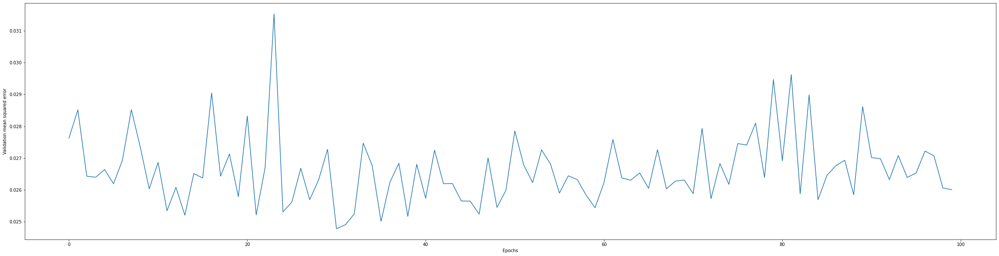

In [ ]:
# Displaying the mean squared error again, this time for the validation set
loss_per_epoch = history.history['val_mean_squared_error']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch);
plt.xlabel("Epochs")
plt.ylabel("Validation mean squared error")

In [ ]:
#Displaying a dataframe consisten of our y_test results as compared the model predictions. We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model.predict(x_test)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_test)


In [ ]:
#We flatten the result to make them fit into a dataframe.
results = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results = results.round(decimals=0)
results

,y_true,y_pred
0,695000.0,312115.0
1,738000.0,855344.0
2,394900.0,646068.0
3,395000.0,332669.0
4,69000.0,359188.0
...,...,...
1071,598000.0,553359.0
1072,250000.0,403039.0
1073,499900.0,485308.0
1074,259000.0,463028.0


Text(0, 0.5, 'Price')

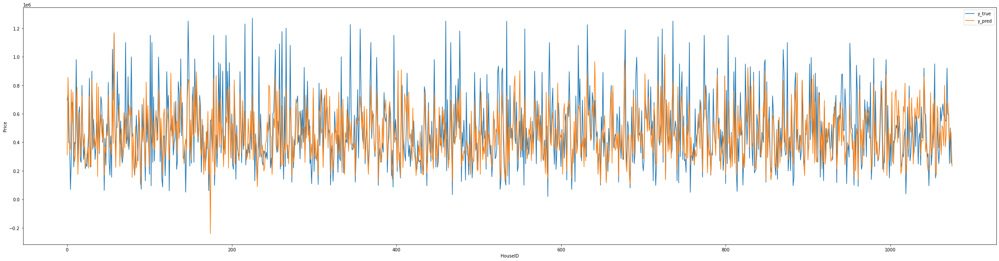

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

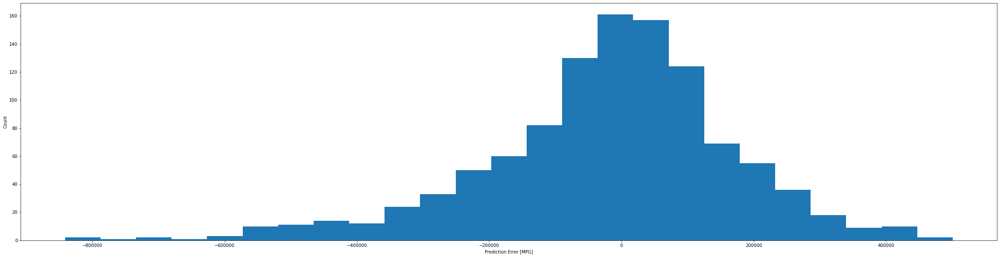

In [ ]:
# Showing error distribution of the model
error = results['y_pred'] - results['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Simple Dense model - Anova filtered data

In [ ]:
x_train_anova = x_scaler.fit_transform(x_train_anova)
# The reason we reshape the y-train/test is to make it 2 dimensional, which is necessary when we are to inverse the scaling.
y_train_anova = y_scaler.fit_transform(y_train_anova.values.reshape(-1,1))

x_test_anova = x_scaler.transform(x_test_anova)
y_test_anova = y_scaler.transform(y_test_anova.values.reshape(-1,1))

In [ ]:
input_size_anova = len(x_anova.columns)

In [ ]:
# Same dense model as before
model_anova = Sequential()
model_anova.add(Dense(35, activation = "relu", input_shape=(input_size_anova,)))
model_anova.add(Dense(10, 'relu'))
model_anova.add(Dense(1))
model_anova.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model_anova.summary()


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 35)                1155      
_________________________________________________________________
dense_7 (Dense)              (None, 10)                360       
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 11        
Total params: 1,526
Trainable params: 1,526
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_anova = model_anova.fit(x_train_anova, y_train_anova, epochs=100, batch_size= 1, validation_split=0.1)


Epoch 1/100
3873/3873 [==============================] - 1s 385us/step - loss: 0.1299 - mean_squared_error: 0.0302 - val_loss: 0.1237 - val_mean_squared_error: 0.0277
Epoch 2/100
3873/3873 [==============================] - 1s 354us/step - loss: 0.1213 - mean_squared_error: 0.0260 - val_loss: 0.1283 - val_mean_squared_error: 0.0272
Epoch 3/100
3873/3873 [==============================] - 1s 354us/step - loss: 0.1195 - mean_squared_error: 0.0256 - val_loss: 0.1233 - val_mean_squared_error: 0.0273
Epoch 4/100
3873/3873 [==============================] - 1s 359us/step - loss: 0.1187 - mean_squared_error: 0.0254 - val_loss: 0.1240 - val_mean_squared_error: 0.0294
Epoch 5/100
3873/3873 [==============================] - 1s 355us/step - loss: 0.1172 - mean_squared_error: 0.0248 - val_loss: 0.1281 - val_mean_squared_error: 0.0317
Epoch 6/100
3873/3873 [==============================] - 1s 356us/step - loss: 0.1169 - mean_squared_error: 0.0246 - val_loss: 0.1219 - val_mean_squared_error: 0.028

In [ ]:
model_evaluation_anova = model_anova.evaluate(x_test_anova, y_test_anova)

34/34 [==============================] - 0s 585us/step - loss: 0.1230 - mean_squared_error: 0.0250


Text(0, 0.5, 'Loss')

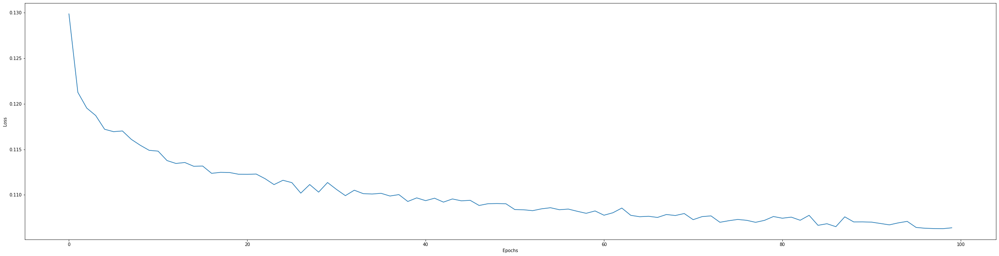

In [ ]:
# Displaying the 'loss', or in this case, mean absolute error reduction over epochs.
loss_per_epoch_anova = history_anova.history['loss']
plt.plot(range(len(loss_per_epoch_anova)),loss_per_epoch_anova);
plt.xlabel("Epochs")
plt.ylabel("Loss")

Text(0, 0.5, 'Validation loss')

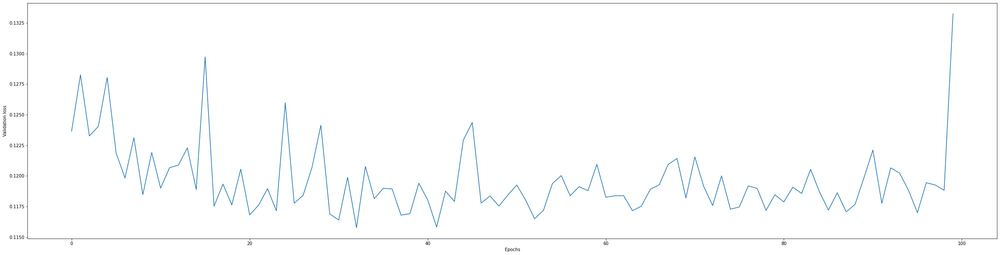

In [ ]:
#Displaying the loss again, this time for our validation set
loss_per_epoch_anova = history_anova.history['val_loss']
plt.plot(range(len(loss_per_epoch_anova)),loss_per_epoch_anova);
plt.xlabel("Epochs")
plt.ylabel("Validation loss")

Text(0, 0.5, 'Mean squared error')

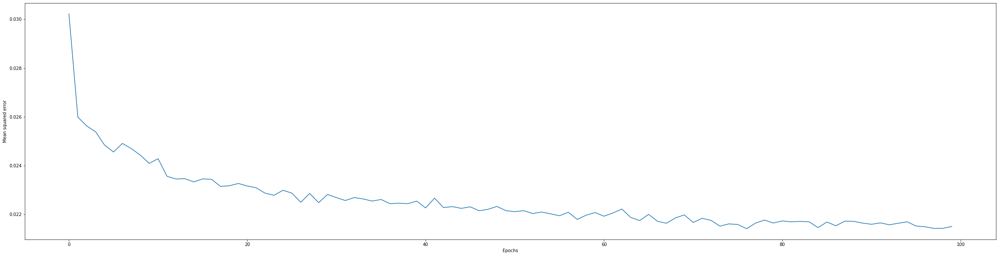

In [ ]:
# Displaying the additional model metric, in this case, mean squared error reduction over epochs.
loss_per_epoch_anova = history_anova.history['mean_squared_error']
plt.plot(range(len(loss_per_epoch_anova)),loss_per_epoch_anova);
plt.xlabel("Epochs")
plt.ylabel("Mean squared error")

Text(0, 0.5, 'Validation mean squared error')

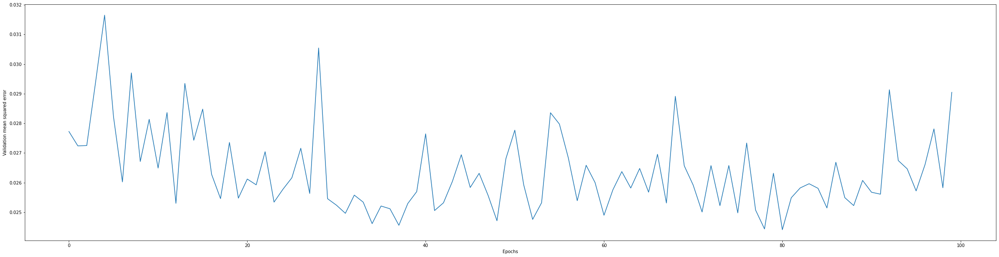

In [ ]:
# Displaying the mean squared error again, this time for the validation set
loss_per_epoch_anova = history_anova.history['val_mean_squared_error']
plt.plot(range(len(loss_per_epoch_anova)),loss_per_epoch_anova);
plt.xlabel("Epochs")
plt.ylabel("Validation mean squared error")

In [ ]:
#Displaying a dataframe consisten of our y_test results as compared the model predictions. We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model_anova.predict(x_test_anova)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_test_anova)

In [ ]:
#We flatten the result to make them fit into a dataframe.
results_anova = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results_anova = results_anova.round(decimals=0)
results_anova

,y_true,y_pred
0,695000.0,399529.0
1,738000.0,793756.0
2,394900.0,731279.0
3,395000.0,397384.0
4,69000.0,332995.0
...,...,...
1071,598000.0,536921.0
1072,250000.0,528621.0
1073,499900.0,572552.0
1074,259000.0,583544.0


Text(0, 0.5, 'Price')

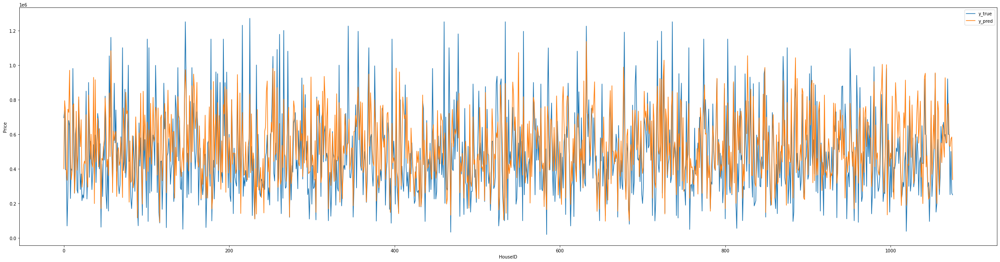

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results_anova.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

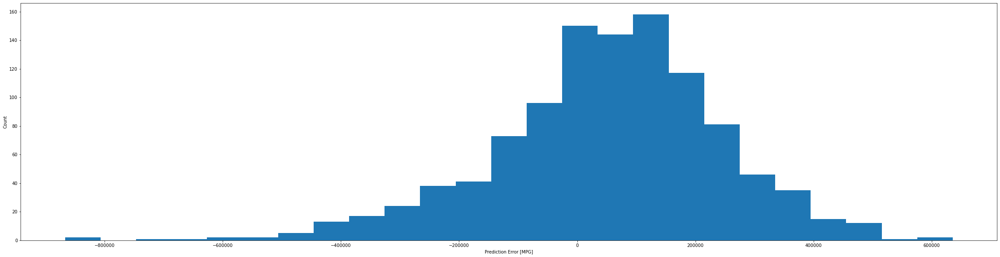

In [ ]:
# Showing error distribution of the model
error = results_anova['y_pred'] - results_anova['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Gaussian Dropout model - Housing data

In [ ]:
model_house_v_2 = Sequential()
model_house_v_2.add(Dense(35, activation='relu', input_shape=(input_size_house,)))
# Adding a Gaussian (dropout) Noise layer as to create random data augmentations. This is to prevent overfitting
# Could be beneficial when a lot of data is imputed, as these imputations may have had a higher variance had they been real observations.
# As the gaussian noise dropout should increase the backpropagation speed because of how it doesn't affect activation function values, 
# as well as allowing for all nodes to be exposed to each training sample iteration. Keeping efficiency of the model as well as reducing overfitting.
# This allows for us to increase the epoch count of the model without reducing speed of the model by a lot. 
# https://www.mygreatlearning.com/blog/understanding-gaussian-dropout/
model_house_v_2.add(GaussianDropout(35))
model_house_v_2.add(Dense(10, 'relu'))
model_house_v_2.add(Dense(1, 'linear'))
model_house_v_2.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model_house_v_2.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 35)                665       
_________________________________________________________________
gaussian_dropout (GaussianDr (None, 35)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 10)                360       
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 11        
Total params: 1,036
Trainable params: 1,036
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_house_2 = model_house_v_2.fit(x_house_train, y_house_train, epochs=100, batch_size= 1, validation_split=0.1)

Epoch 1/100
3873/3873 [==============================] - 1s 386us/step - loss: 0.1329 - mean_squared_error: 0.0314 - val_loss: 0.1300 - val_mean_squared_error: 0.0300
Epoch 2/100
3873/3873 [==============================] - 1s 366us/step - loss: 0.1258 - mean_squared_error: 0.0282 - val_loss: 0.1268 - val_mean_squared_error: 0.0287
Epoch 3/100
3873/3873 [==============================] - 1s 359us/step - loss: 0.1231 - mean_squared_error: 0.0272 - val_loss: 0.1279 - val_mean_squared_error: 0.0301
Epoch 4/100
3873/3873 [==============================] - 1s 355us/step - loss: 0.1209 - mean_squared_error: 0.0265 - val_loss: 0.1271 - val_mean_squared_error: 0.0282
Epoch 5/100
3873/3873 [==============================] - 1s 356us/step - loss: 0.1194 - mean_squared_error: 0.0258 - val_loss: 0.1258 - val_mean_squared_error: 0.0284
Epoch 6/100
3873/3873 [==============================] - 1s 355us/step - loss: 0.1194 - mean_squared_error: 0.0262 - val_loss: 0.1254 - val_mean_squared_error: 0.027

In [ ]:
#Displaying a dataframe consisten of our y_test results as compared the model predictions. We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model_house_v_2.predict(x_house_test)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_house_test)

results_house_2 = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results_house_2 = results_house_2.round(decimals=0)
results_house_2


,y_true,y_pred
0,695000.0,294675.0
1,738000.0,830602.0
2,394900.0,518262.0
3,395000.0,299822.0
4,69000.0,336335.0
...,...,...
1071,598000.0,516389.0
1072,250000.0,421340.0
1073,499900.0,438690.0
1074,259000.0,537584.0


Text(0, 0.5, 'Price')

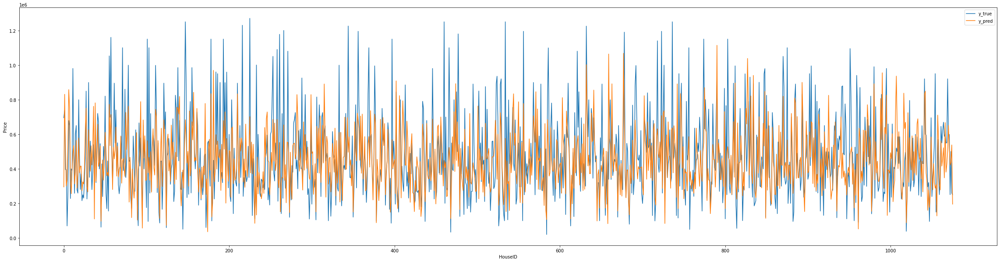

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results_house_2.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

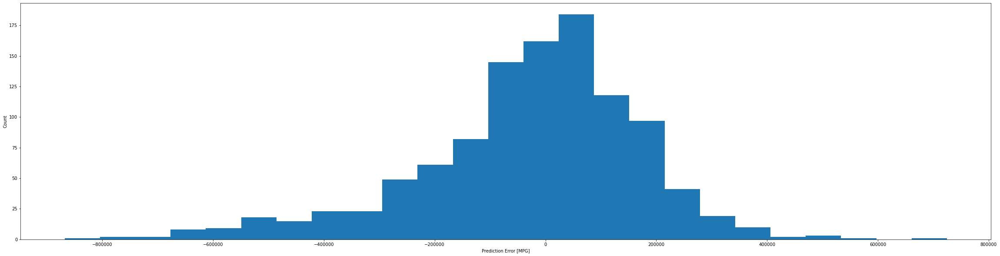

In [ ]:
# Showing error distribution of the model
error = results_house_2['y_pred'] - results_house_2['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Gaussian Dropout model - Combined data

In [ ]:
model_v_2 = Sequential()
model_v_2.add(Dense(35, activation='relu', input_shape=(input_size,)))
model_v_2.add(GaussianDropout(35))
model_v_2.add(Dense(10, 'relu'))
model_v_2.add(Dense(1, 'linear'))
model_v_2.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model_v_2.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 35)                1295      
_________________________________________________________________
gaussian_dropout_1 (Gaussian (None, 35)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 10)                360       
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 11        
Total params: 1,666
Trainable params: 1,666
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_v2 = model_v_2.fit(x_train, y_train, epochs=100, batch_size= 1, validation_split=0.1)

Epoch 1/100
3873/3873 [==============================] - 1s 380us/step - loss: 0.1342 - mean_squared_error: 0.0311 - val_loss: 0.1256 - val_mean_squared_error: 0.0277
Epoch 2/100
3873/3873 [==============================] - 1s 374us/step - loss: 0.1229 - mean_squared_error: 0.0270 - val_loss: 0.1245 - val_mean_squared_error: 0.0287
Epoch 3/100
3873/3873 [==============================] - 1s 361us/step - loss: 0.1202 - mean_squared_error: 0.0259 - val_loss: 0.1233 - val_mean_squared_error: 0.0273
Epoch 4/100
3873/3873 [==============================] - 1s 368us/step - loss: 0.1190 - mean_squared_error: 0.0258 - val_loss: 0.1252 - val_mean_squared_error: 0.0301
Epoch 5/100
3873/3873 [==============================] - 1s 363us/step - loss: 0.1181 - mean_squared_error: 0.0253 - val_loss: 0.1269 - val_mean_squared_error: 0.0269
Epoch 6/100
3873/3873 [==============================] - 1s 365us/step - loss: 0.1172 - mean_squared_error: 0.0249 - val_loss: 0.1191 - val_mean_squared_error: 0.026

In [ ]:
#Displaying a dataframe consisten of our y_test results as compared the model predictions. We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model_v_2.predict(x_test)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_test)

results_2 = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results_2 = results_2.round(decimals=0)
results_2


,y_true,y_pred
0,695000.0,333644.0
1,738000.0,674942.0
2,394900.0,634607.0
3,395000.0,331689.0
4,69000.0,328029.0
...,...,...
1071,598000.0,500266.0
1072,250000.0,420293.0
1073,499900.0,469972.0
1074,259000.0,495462.0


Text(0, 0.5, 'Price')

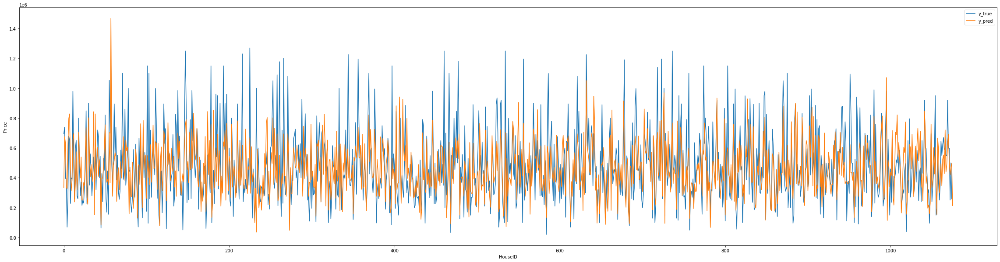

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results_2.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

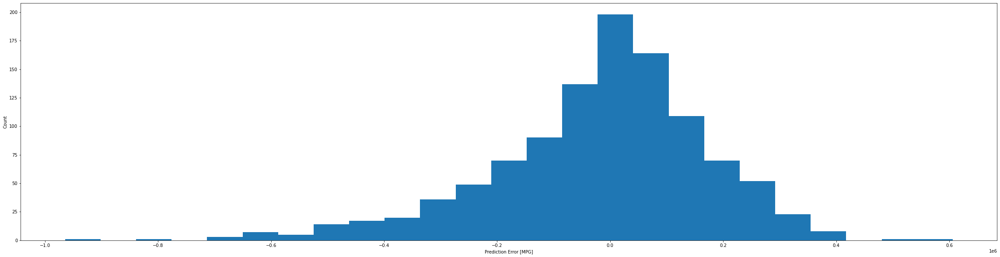

In [ ]:
# Showing error distribution of the model
error = results_2['y_pred'] - results_2['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Gaussian Dropout model - Anova filtered data

In [ ]:
model_anova_v_2 = Sequential()
model_anova_v_2.add(Dense(35, activation='relu', input_shape=(input_size_anova,)))
model_anova_v_2.add(GaussianDropout(35))
model_anova_v_2.add(Dense(10, 'relu'))
model_anova_v_2.add(Dense(1, 'linear'))
model_anova_v_2.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model_anova_v_2.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 35)                1155      
_________________________________________________________________
gaussian_dropout_2 (Gaussian (None, 35)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 10)                360       
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 11        
Total params: 1,526
Trainable params: 1,526
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_anova_2 = model_anova_v_2.fit(x_train_anova, y_train_anova, epochs=100, batch_size= 1, validation_split=0.1)

Epoch 1/100
3873/3873 [==============================] - 1s 387us/step - loss: 0.1357 - mean_squared_error: 0.0321 - val_loss: 0.1263 - val_mean_squared_error: 0.0273
Epoch 2/100
3873/3873 [==============================] - 1s 362us/step - loss: 0.1227 - mean_squared_error: 0.0267 - val_loss: 0.1205 - val_mean_squared_error: 0.0270
Epoch 3/100
3873/3873 [==============================] - 1s 359us/step - loss: 0.1197 - mean_squared_error: 0.0257 - val_loss: 0.1209 - val_mean_squared_error: 0.0264
Epoch 4/100
3873/3873 [==============================] - 1s 358us/step - loss: 0.1180 - mean_squared_error: 0.0251 - val_loss: 0.1232 - val_mean_squared_error: 0.0264
Epoch 5/100
3873/3873 [==============================] - 1s 361us/step - loss: 0.1173 - mean_squared_error: 0.0250 - val_loss: 0.1213 - val_mean_squared_error: 0.0251
Epoch 6/100
3873/3873 [==============================] - 1s 361us/step - loss: 0.1170 - mean_squared_error: 0.0249 - val_loss: 0.1184 - val_mean_squared_error: 0.026

In [ ]:
#Displaying a dataframe consisten of our y_test results as compared the model predictions. We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model_anova_v_2.predict(x_test_anova)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_test_anova)

results_anova_2 = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results_anova_2 = results_anova_2.round(decimals=0)
results_anova_2


,y_true,y_pred
0,695000.0,340413.0
1,738000.0,710574.0
2,394900.0,564016.0
3,395000.0,340413.0
4,69000.0,233572.0
...,...,...
1071,598000.0,434758.0
1072,250000.0,381452.0
1073,499900.0,411927.0
1074,259000.0,482677.0


Text(0, 0.5, 'Price')

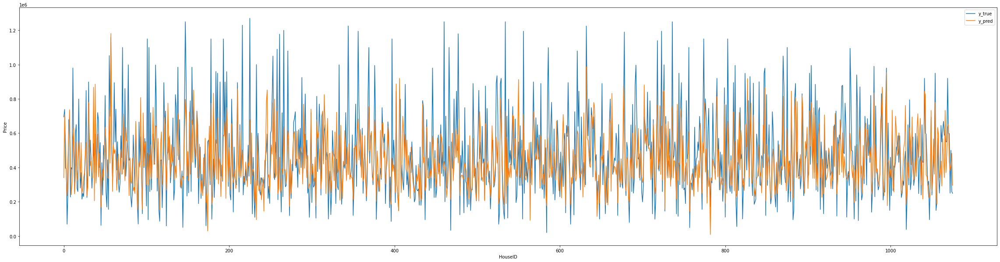

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results_anova_2.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

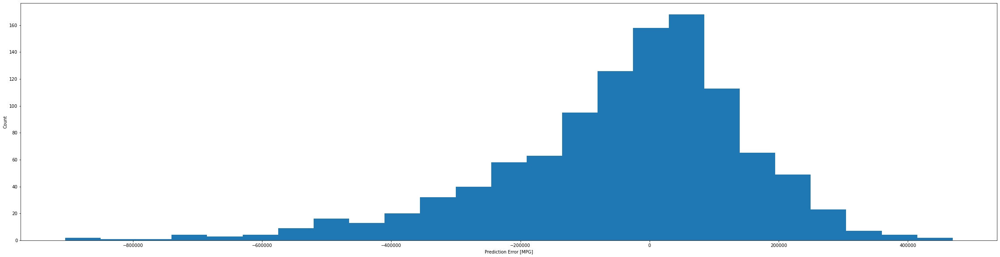

In [ ]:
# Showing error distribution of the model
error = results_anova_2['y_pred'] - results_anova_2['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Higher Neuron count model - Housing data

In [ ]:
#model building
model_house_v_3 = Sequential()
model_house_v_3.add(Dense(64, activation='relu', input_shape=(input_size_house,)))
model_house_v_3.add(GaussianDropout(64))
model_house_v_3.add(Dense(32, 'relu'))
model_house_v_3.add(Dense(16, 'relu'))
model_house_v_3.add(Dense(1, 'linear'))
model_house_v_3.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model_house_v_3.summary()


Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 64)                1216      
_________________________________________________________________
gaussian_dropout_3 (Gaussian (None, 64)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_20 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 17        
Total params: 3,841
Trainable params: 3,841
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_house_3 = model_house_v_3.fit(x_house_train, y_house_train, epochs=100, batch_size= 1, validation_split=0.1)

Epoch 1/100
3873/3873 [==============================] - 2s 430us/step - loss: 0.1350 - mean_squared_error: 0.0319 - val_loss: 0.1288 - val_mean_squared_error: 0.0307
Epoch 2/100
3873/3873 [==============================] - 2s 390us/step - loss: 0.1250 - mean_squared_error: 0.0285 - val_loss: 0.1311 - val_mean_squared_error: 0.0290
Epoch 3/100
3873/3873 [==============================] - 1s 385us/step - loss: 0.1225 - mean_squared_error: 0.0275 - val_loss: 0.1295 - val_mean_squared_error: 0.0291
Epoch 4/100
3873/3873 [==============================] - 2s 395us/step - loss: 0.1209 - mean_squared_error: 0.0263 - val_loss: 0.1264 - val_mean_squared_error: 0.0287
Epoch 5/100
3873/3873 [==============================] - 2s 396us/step - loss: 0.1196 - mean_squared_error: 0.0261 - val_loss: 0.1273 - val_mean_squared_error: 0.0306
Epoch 6/100
3873/3873 [==============================] - 2s 398us/step - loss: 0.1194 - mean_squared_error: 0.0259 - val_loss: 0.1250 - val_mean_squared_error: 0.029

In [ ]:
#Displaying a dataframe consisten of our y_test results as compared the model predictions. We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model_house_v_3.predict(x_house_test)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_house_test)

results_house_3 = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results_house_3 = results_house_3.round(decimals=0)
results_house_3


,y_true,y_pred
0,695000.0,256893.0
1,738000.0,695667.0
2,394900.0,488468.0
3,395000.0,376248.0
4,69000.0,297732.0
...,...,...
1071,598000.0,478558.0
1072,250000.0,335822.0
1073,499900.0,393944.0
1074,259000.0,463077.0


Text(0, 0.5, 'Price')

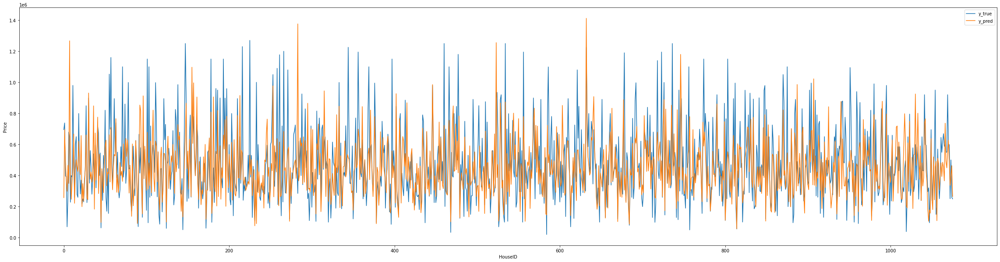

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results_house_3.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

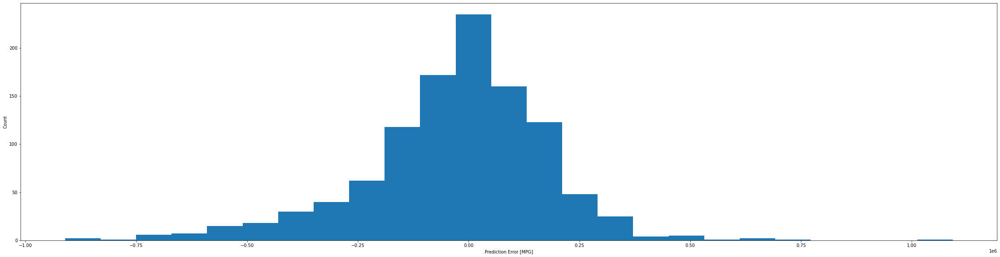

In [ ]:
# Showing error distribution of the model
error = results_house_3['y_pred'] - results_house_3['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Higher Neuron count model - Combined data

In [ ]:
#model building
model_v_3 = Sequential()
model_v_3.add(Dense(64, activation='relu', input_shape=(input_size,)))
model_v_3.add(GaussianDropout(64))
model_v_3.add(Dense(32, 'relu'))
model_v_3.add(Dense(16, 'relu'))
model_v_3.add(Dense(1, 'linear'))
model_v_3.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model_v_3.summary()


Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_22 (Dense)             (None, 64)                2368      
_________________________________________________________________
gaussian_dropout_4 (Gaussian (None, 64)                0         
_________________________________________________________________
dense_23 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_24 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_25 (Dense)             (None, 1)                 17        
Total params: 4,993
Trainable params: 4,993
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_v3 = model_v_3.fit(x_train, y_train, epochs=100, batch_size= 1, validation_split=0.1)

Epoch 1/100
3873/3873 [==============================] - 2s 412us/step - loss: 0.1340 - mean_squared_error: 0.0313 - val_loss: 0.1271 - val_mean_squared_error: 0.0287
Epoch 2/100
3873/3873 [==============================] - 2s 395us/step - loss: 0.1235 - mean_squared_error: 0.0270 - val_loss: 0.1322 - val_mean_squared_error: 0.0325
Epoch 3/100
3873/3873 [==============================] - 2s 396us/step - loss: 0.1213 - mean_squared_error: 0.0266 - val_loss: 0.1260 - val_mean_squared_error: 0.0265
Epoch 4/100
3873/3873 [==============================] - 2s 397us/step - loss: 0.1197 - mean_squared_error: 0.0260 - val_loss: 0.1233 - val_mean_squared_error: 0.0281
Epoch 5/100
3873/3873 [==============================] - 2s 394us/step - loss: 0.1182 - mean_squared_error: 0.0252 - val_loss: 0.1212 - val_mean_squared_error: 0.0266
Epoch 6/100
3873/3873 [==============================] - 2s 392us/step - loss: 0.1172 - mean_squared_error: 0.0249 - val_loss: 0.1218 - val_mean_squared_error: 0.028

In [ ]:
#Displaying a dataframe consisten of our y_test results as compared the model predictions. We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model_v_3.predict(x_test)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_test)

results_3 = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results_3 = results_3.round(decimals=0)
results_3


,y_true,y_pred
0,695000.0,285324.0
1,738000.0,619429.0
2,394900.0,573272.0
3,395000.0,293870.0
4,69000.0,289859.0
...,...,...
1071,598000.0,420443.0
1072,250000.0,339785.0
1073,499900.0,471330.0
1074,259000.0,426226.0


Text(0, 0.5, 'Price')

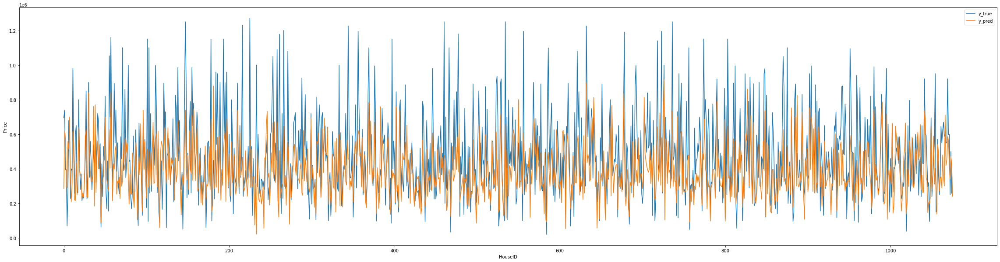

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results_3.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

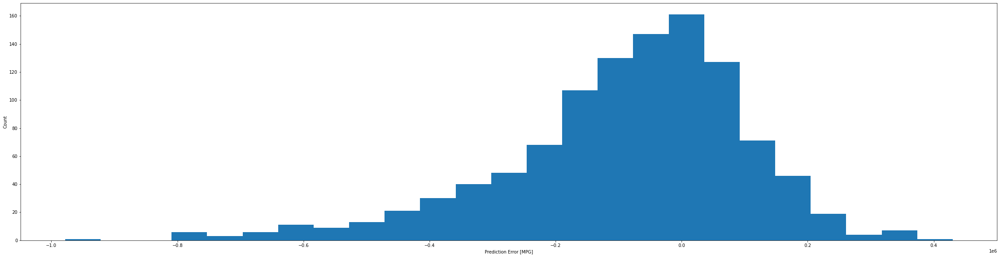

In [ ]:
# Showing error distribution of the model
error = results_3['y_pred'] - results_3['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Nigher Neuron count model - Anova filtered data

In [ ]:
#model building
model_anova_v_3 = Sequential()
model_anova_v_3.add(Dense(64, activation='relu', input_shape=(input_size_anova,)))
model_anova_v_3.add(GaussianDropout(64))
model_anova_v_3.add(Dense(32, 'relu'))
model_anova_v_3.add(Dense(16, 'relu'))
model_anova_v_3.add(Dense(1, 'linear'))
model_anova_v_3.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer='adam', metrics=['mean_squared_error'])
model_anova_v_3.summary()


Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_26 (Dense)             (None, 64)                2112      
_________________________________________________________________
gaussian_dropout_5 (Gaussian (None, 64)                0         
_________________________________________________________________
dense_27 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_28 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 17        
Total params: 4,737
Trainable params: 4,737
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_anova_3 = model_anova_v_3.fit(x_train_anova, y_train_anova, epochs=100, batch_size= 1, validation_split=0.1)

Epoch 1/100
3873/3873 [==============================] - 2s 395us/step - loss: 0.1341 - mean_squared_error: 0.0313 - val_loss: 0.1255 - val_mean_squared_error: 0.0289
Epoch 2/100
3873/3873 [==============================] - 1s 373us/step - loss: 0.1227 - mean_squared_error: 0.0269 - val_loss: 0.1220 - val_mean_squared_error: 0.0264
Epoch 3/100
3873/3873 [==============================] - 1s 372us/step - loss: 0.1197 - mean_squared_error: 0.0258 - val_loss: 0.1295 - val_mean_squared_error: 0.0274
Epoch 4/100
3873/3873 [==============================] - 1s 385us/step - loss: 0.1189 - mean_squared_error: 0.0255 - val_loss: 0.1239 - val_mean_squared_error: 0.0270
Epoch 5/100
3873/3873 [==============================] - 1s 367us/step - loss: 0.1181 - mean_squared_error: 0.0255 - val_loss: 0.1210 - val_mean_squared_error: 0.0256
Epoch 6/100
3873/3873 [==============================] - 1s 375us/step - loss: 0.1167 - mean_squared_error: 0.0248 - val_loss: 0.1257 - val_mean_squared_error: 0.026

In [ ]:
#Displaying a dataframe consisten of our y_test results as compared the model predictions. We do this by inverse transforming the results and our scaled data to compare them. 
y_pred_scaled = model_anova_v_3.predict(x_test_anova)
y_pred = y_scaler.inverse_transform(y_pred_scaled)
y_test_result = y_scaler.inverse_transform(y_test_anova)

results_anova_3 = pd.DataFrame({'y_true':y_test_result.flatten(),'y_pred':y_pred.flatten()})
results_anova_3 = results_anova_3.round(decimals=0)
results_anova_3


,y_true,y_pred
0,695000.0,343552.0
1,738000.0,766844.0
2,394900.0,707340.0
3,395000.0,348630.0
4,69000.0,377876.0
...,...,...
1071,598000.0,507363.0
1072,250000.0,365056.0
1073,499900.0,528033.0
1074,259000.0,486614.0


Text(0, 0.5, 'Price')

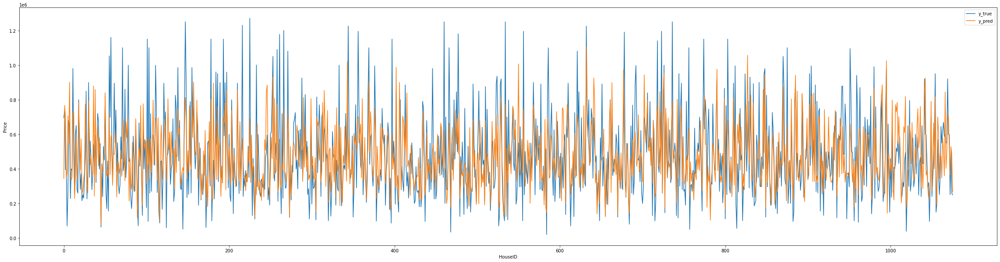

In [ ]:
# Plotting the test set with the predictions
plt.rcParams["figure.figsize"] = (40,10)
results_anova_3.plot()
plt.xlabel("HouseID")
plt.ylabel("Price")

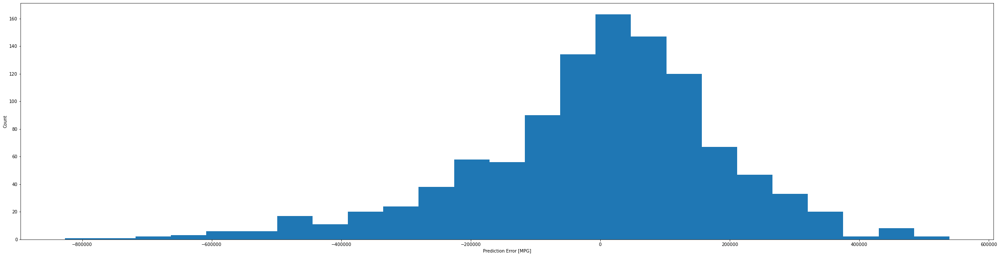

In [ ]:
# Showing error distribution of the model
error = results_anova_3['y_pred'] - results_anova_3['y_true'] 
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

Validation :)

In [ ]:
loss_dataframe_data = {"House":[history_house.history["loss"][-1] ,history_house_2.history["loss"][-1],history_house_3.history["loss"][-1]],
    "Combined":[history.history["loss"][-1] ,history_v2.history["loss"][-1],history_v3.history["loss"][-1]],
    "Anova":[history_anova.history["loss"][-1] ,history_anova_2.history["loss"][-1],history_anova_3.history["loss"][-1]]}

In [ ]:
loss_dataframe = pd.DataFrame(loss_dataframe_data, index=["Simple dense model", "Gaussian dropout model", "Higher neuron count model"])
loss_dataframe

,House,Combined,Anova
Simple dense model,0.105674,0.107068,0.106383
Gaussian dropout model,0.102374,0.106446,0.106466
Higher neuron count model,0.095399,0.104125,0.105653


In [ ]:
results_house["dif"] = (results_house["y_true"] -  results_house["y_pred"]).abs()
results_house_2["dif"] = (results_house_2["y_true"] - results_house_2["y_pred"]).abs()
results_house_3["dif"] = (results_house_3["y_true"] - results_house_3["y_pred"]).abs()

results["dif"] = (results["y_true"] - results["y_pred"]).abs()
results_2["dif"] = (results_2["y_true"] - results_2["y_pred"]).abs()
results_3["dif"] = (results_3["y_true"] - results_3["y_pred"]).abs()

results_anova["dif"] = (results_anova["y_true"] - results_anova["y_pred"]).abs()
results_anova_2["dif"] = (results_anova_2["y_true"] - results_anova_2["y_pred"]).abs()
results_anova_3["dif"] = (results_anova_3["y_true"] - results_anova_3["y_pred"]).abs()

In [ ]:
Diff_dataframe_data = {"House": [results_house["dif"].mean(),results_house_2["dif"].mean(), results_house_3["dif"].mean()],
    "Combined": [results["dif"].mean(), results_2["dif"].mean(), results_3["dif"].mean()],
    "Anova":[results_anova["dif"].mean(), results_anova_2["dif"].mean(), results_anova_3["dif"].mean()]}

In [ ]:
dif_dataframe = pd.DataFrame(Diff_dataframe_data, index=["Simple dense model", "Gaussian dropout model", "Higher neuron count model"])
dif_dataframe

,House,Combined,Anova
Simple dense model,147763.613383,138853.656134,155881.094796
Gaussian dropout model,149399.144981,141943.557621,142436.966543
Higher neuron count model,150664.612454,152530.743494,143777.285316


In [ ]:
MSE_dataframe_data = {"House":[history_house.history["mean_squared_error"][-1] ,history_house_2.history["mean_squared_error"][-1],history_house_3.history["mean_squared_error"][-1]],
    "Combined":[history.history["mean_squared_error"][-1] ,history_v2.history["mean_squared_error"][-1],history_v3.history["mean_squared_error"][-1]],
    "Anova":[history_anova.history["mean_squared_error"][-1] ,history_anova_2.history["mean_squared_error"][-1],history_anova_3.history["mean_squared_error"][-1]]}

In [ ]:
MSE_dataframe = pd.DataFrame(MSE_dataframe_data, index=["Simple dense model", "Gaussian dropout model", "Higher neuron count model"])
MSE_dataframe

,House,Combined,Anova
Simple dense model,0.021892,0.021804,0.021508
Gaussian dropout model,0.020646,0.021721,0.021645
Higher neuron count model,0.018376,0.020715,0.021132


In [ ]:
from IPython.display import display_html
from itertools import chain,cycle
def display_side_by_side(*args,titles=cycle([''])):
    html_str=''
    for df,title in zip(args, chain(titles,cycle(['</br>'])) ):
        html_str+='<th style="text-align:center"><td style="vertical-align:top">'
        html_str+=f'<h2>{title}</h2>'
        html_str+=df.to_html().replace('table','table style="display:inline"')
        html_str+='</td></th>'
    display_html(html_str,raw=True)
  

In [ ]:
display_side_by_side(loss_dataframe, SML_MAE_DF, MSE_dataframe, SML_MSE_DF, SML_r2_DF, titles=["MAE neural network", "MAE supervised machine learning", "MSE Neural network", "MSE Supervised machine learning", "R2 Supervised machine learning"])

,House,Combined,Anova
Simple dense model,0.105674,0.107068,0.106383
Gaussian dropout model,0.102374,0.106446,0.106466
Higher neuron count model,0.095399,0.104125,0.105653
,House,Combined,Anova
OLS,0.119415,0.111982,0.111932
RFR,0.105192,0.104593,0.105283
,House,Combined,Anova
Simple dense model,0.021892,0.021804,0.021508
Gaussian dropout model,0.020646,0.021721,0.021645
Higher neuron count model,0.018376,0.020715,0.021132
